# Dữ liệu

## Gọi bộ dữ liệu

In [160]:
import pandas as pd

In [161]:
# Gọi bộ dữ liệu đã lưu, trong folder /content, đã chia Train/Valid 
path = "../data/preprocessed_data"
train_valid_processed_comments = pd.read_csv(f"{path}/preprocessed_hus_fb.csv")
test_processed_comments = pd.read_csv(f"{path}/preprocessed_test.csv")

In [162]:
train_valid_processed_comments.shape, test_processed_comments.shape

((4512, 4), (688, 3))

In [163]:
test_processed_comments.head(3)

,Sentence,Emotion,Tokenized_Sentence
0,người ta có bạn bè nhìn vui thật,Sadness,"['người', 'ta', 'bạn bè', 'nhìn', 'vui']"
1,cho nghỉ viêc mói đúng sao goi là kỷ luật,Surprise,"['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật']"
2,kinh vãi phẫn_nộ,Disgust,"['kinh vãi', 'phẫn_nộ']"


## Chuyển đổi cột *Tokenized_Sentence* về danh sách từ

In [164]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'str'>
5 phần tử đầu tiên: ["['người', 'ta', 'bạn bè', 'nhìn', 'vui']", "['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật']", "['kinh vãi', 'phẫn_nộ']", "['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười']", "['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']"]


**Do dữ liệu đã được tiền xử lý và lưu dưới dạng chuỗi, ta cần chuyển đổi chúng trở lại thành danh sách từ**

In [165]:
import ast

# Sử dụng hàm literal_eval để chuyển chuỗi thành danh sách
train_valid_processed_comments['Tokenized_Sentence'] = train_valid_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)
test_processed_comments['Tokenized_Sentence'] = test_processed_comments['Tokenized_Sentence'].apply(ast.literal_eval)

In [166]:
texts = test_processed_comments['Tokenized_Sentence']

# Kiểm tra kiểu phần tử sau khi chuyển đổi
print("Kiểu phần tử:", type(texts.iloc[0]))
print("5 phần tử đầu tiên:", texts.iloc[:5].tolist())

Kiểu phần tử: <class 'list'>
5 phần tử đầu tiên: [['người', 'ta', 'bạn bè', 'nhìn', 'vui'], ['nghỉ', 'viêc', 'mói', 'đúng', 'sao', 'goi', 'kỷ luật'], ['kinh vãi', 'phẫn_nộ'], ['nhà', 'không', 'xa', 'lắm', 'nhưng', 'chưa', 'bao giờ', 'sợ', 'đè bẹp', 'luôn', 'người', 'cười'], ['bố', 'không', 'thích', 'nộp', 'đấy', 'mày', 'thích', 'ý kiến', 'không']]


# Tiền xử lý

## Tách các tập Train - Validation - Test và label

In [132]:
from sklearn.model_selection import train_test_split

In [133]:
def split_train_valid_test(df_train_valid, df_test, train_size, valid_size, random_state=11):
    X_train, X_valid, y_train, y_valid = train_test_split(
        df_train_valid.drop('Emotion', axis=1),
        df_train_valid['Emotion'],
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=df_train_valid['Emotion']
    )

    X_test = df_test.drop('Emotion', axis=1)
    y_test = df_test['Emotion']

    return X_train, X_valid, X_test, y_train, y_valid, y_test

## TF-IDF
**TF-IDF = Term Frequency * Inverse Document Frequency**
- Từ xuất hiện nhiều trong câu nhưng ít trong toàn bộ corpus => trọng số cao
- Từ phổ biến (stop words) => trọng số thấp

In [134]:
from sklearn.feature_extraction.text import TfidfVectorizer

def tfidf_embedding(tokens, max_features=8000, min_df=2, max_df=0.95):
    # Chuyển đổi danh sách token thành TF-IDF representation
    # max_features : Số lượng từ vựng tối đa mà  (mặc định: 8000)
    # tokens: Danh sách các token

    # Chuyển danh sách token thành chuỗi văn bản
    texts = [' '.join(token_list) for token_list in tokens]

    # Khởi tạo TfidfVectorizer
    vectorizer = TfidfVectorizer(
        max_features=max_features,
        ngram_range=(1, 2), # Sử dụng unigram và bigram
        min_df=min_df,           # Bỏ qua từ xuất hiện < min_df lần
        max_df=max_df         # Bỏ qua từ xuất hiện > max_df documents
    )

    # fit_transform
    # ma trận TF-IDF (n_samples x n_features)
    tfidf_matrix = vectorizer.fit_transform(texts)

    print("TF-IDF hoàn thành!")
    print(f"Shape: {tfidf_matrix.shape} (số câu x số từ vựng)")
    print("Số từ vựng:", len(vectorizer.get_feature_names_out()))
    print("TF-IDF - Non-zero values:", tfidf_matrix.nnz)

    return tfidf_matrix, vectorizer

In [135]:
def tfidf_transform(tokens, tfidf_vectorizer):
    texts = [' '.join(token_list) for token_list in tokens]
    return tfidf_vectorizer.transform(texts)

## Chuyển sang mảng numpy

In [136]:
def convert_to_array(tfidf_matrix):
    return tfidf_matrix.toarray()

In [137]:
def convert_full_to_array(train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix):
    return convert_to_array(train_tfidf_matrix), convert_to_array(valid_tfidf_matrix), convert_to_array(test_tfidf_matrix)

# Giảm chiều

## PCA
Giữ lại 90% thông tin sau khi PCA

In [167]:
from sklearn.decomposition import PCA

In [168]:
def pca(X_train_arr, X_test_arr, X_valid_arr, n_components=0.9):
    pca_model = PCA(n_components=n_components)
    X_train_pca = pca_model.fit_transform(X_train_arr)
    X_test_pca = pca_model.transform(X_test_arr)
    X_valid_pca = pca_model.transform(X_valid_arr)

    return pca_model, X_train_pca, X_test_pca, X_valid_pca

## LDA

- Tìm ma trận W chiếu DL vào không gian LDA
- Sau khi học được W, tính các hàm phân biệt tuyến tính (linear discriminats) để dự đoán lớp
- Thay vì mỗi TPC giữ một phần thông tin như PCA, thì LDA sẽ giữ một phần thông tin giúp phân biệt giữa các lớp
- Vì thế, LDA có thể giảm còn số chiều max là (n-1) chiều (n là số nhãn)

In [169]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

### LDA còn 6 chiều

In [170]:
def lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components):
    lda = LDA(n_components=n_components)
    X_train_lda =lda.fit_transform(X_train_arr, y_train)
    X_test_lda = lda.transform(X_test_arr)
    X_valid_lda = lda.transform(X_valid_arr)

    return lda, X_train_lda, X_test_lda, X_valid_lda

- LDA tìm ra 6 hướng giúp phân biệt tâm của 7 label
- Các vector riêng của S_w^-1 * S_B mô tả toàn bộ thông tin phân biệt giữa các lớp, tức là TOÀN BỘ KHẢ NĂNG PHÂN BIỆT đã ở trong 6 chiều này

## Hàm lựa chọn giảm chiều theo cách nào

In [171]:
def use_discriminant(X_train_arr, y_train, X_test_arr, X_valid_arr, discriminant="none", n_components_pca=0.9, n_components_lda=6):
    if discriminant == "pca":
        return pca(X_train_arr, X_test_arr, X_valid_arr, n_components_pca)

    elif discriminant == "lda":
        return lda(X_train_arr, y_train, X_test_arr, X_valid_arr, n_components_lda)

    return None, X_train_arr, X_test_arr, X_valid_arr

# Model phân loại

In [172]:
import time

## HOI QUY SOFTMAX - MULTINOMIAL LOGISTIC REGRESSION

In [173]:
from sklearn.linear_model import LogisticRegression

In [174]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [175]:
def log_reg(X_train, y_train, random_state=11, max_iter=1000):
    log_reg = LogisticRegression(
        multi_class='multinomial',
        class_weight='balanced',
        random_state=random_state,
        max_iter=max_iter)

    log_reg.fit(X_train, y_train)

    return log_reg

## K-NN

In [176]:
from sklearn.neighbors import KNeighborsClassifier

In [177]:
def knn(X_train, y_train, metric = 'cosine'):
    knn = KNeighborsClassifier(
    n_neighbors=83,
    metric=metric,
    n_jobs=-1)  # Dùng tất cả CPU cores để tăng tốc độ chạy

    knn.fit(X_train, y_train)

    return knn

## Hàm lựa chọn mô hình và dự đoán

In [178]:
def use_model(model_type, X_train_processed, y_train, metric='cosine', max_iter=1000,
              C=1.0, svm_kernel='rbf', svm_gamma='scale', svm_degree=3,
              tree_max_depth=None, nb_alpha=1.0,
              mlp_hidden=(128,), mlp_alpha=1e-4,
              random_state=11):
    if model_type == 'logistic_regression':
        model = LogisticRegression(
            C=C,
            multi_class='multinomial',
            class_weight='balanced',
            max_iter=max_iter,
            random_state=random_state
        )
    elif model_type == 'knn':
        model = knn(X_train_processed, y_train, metric)
    elif model_type == 'svm':
        if svm_kernel == 'linear':
            model = LinearSVC(C=C, class_weight='balanced', random_state=random_state, max_iter=max_iter)
        elif svm_kernel == 'poly':
            model = SVC(C=C, kernel='poly', degree=svm_degree, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size = 1000)
        else:
            model = SVC(C=C, kernel=svm_kernel, gamma=svm_gamma, class_weight='balanced', random_state=random_state, max_iter=max_iter, cache_size = 1000)
    elif model_type == 'naive_bayes':
        model = MultinomialNB(alpha=nb_alpha)
    elif model_type == 'decision_tree':
        model = DecisionTreeClassifier(
            max_depth=tree_max_depth,
            min_samples_leaf=2,
            random_state=random_state
        )
    elif model_type == 'mlp':
        model = MLPClassifier(
            hidden_layer_sizes=mlp_hidden,
            alpha=mlp_alpha,
            max_iter=max_iter,
            random_state=random_state
        )
    else:
        raise ValueError(f'Unknown model_type: {model_type}')

    if model_type in ['knn']:
        # KNN is trained inside knn()
        return model

    model.fit(X_train_processed, y_train)
    return model


In [179]:
def predict(model, X_train, X_valid, X_test):
    # model là log_reg, knn hoặc svm

    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)

    return y_pred_train, y_pred_valid, y_pred_test

## Đánh giá độ chính xác và trực quan

### Đánh giá độ chính xác

In [180]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

In [181]:
def get_metrics(y_true, y_pred):
    return accuracy_score(y_true, y_pred), precision_score(y_true, y_pred, average='weighted'), recall_score(y_true, y_pred, average='weighted'), f1_score(y_true, y_pred, average='weighted')

In [182]:
def get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test):
    accuracy_train, precision_train, recall_train, f1_train = get_metrics(y_train, y_pred_train)
    accuracy_valid, precision_valid, recall_valid, f1_valid = get_metrics(y_valid, y_pred_valid)
    accuracy_test, precision_test, recall_test, f1_test = get_metrics(y_test, y_pred_test)

    return [accuracy_train, precision_train, recall_train, f1_train], [accuracy_valid, precision_valid, recall_valid, f1_valid], [accuracy_test, precision_test, recall_test, f1_test]

In [183]:
def print_metrics(accuracy, precision, recall, f1):
    print("Accuracy:", accuracy)
    print("Recall:", recall)
    print("Precision:", precision)
    print("F1-score:", f1)

### Trực quan

In [184]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [185]:
# vẽ ma trận nhầm lẫn
def plot_normalized_confusion_matrix(y_true, y_pred, title='Normalized Confusion Matrix'):
    cm_normalized = confusion_matrix(y_true, y_pred, normalize='true')
    classes = np.unique(y_true)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [186]:
# hàm vẽ cả 3 ma trận nhầm lẫn cho cả 3 tập train - valid - test
def plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                          title='Normalized Confusion Matrix', discriminant="none", model_type="logistic_regression"):
    plot_normalized_confusion_matrix(y_train, y_pred_train, title=title + " Train " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_valid, y_pred_valid, title=title + " Valid " + discriminant + " " + model_type)
    plot_normalized_confusion_matrix(y_test, y_pred_test, title=title + " Test " + discriminant + " " + model_type)

# Pipeline cho bài toán phân loại

## Chuẩn bị dữ liệu 

In [34]:
def prepare_data_for_modeling(df_train_valid, df_test, train_size, valid_size, random_state=11,
                              min_df=2, max_df=0.95, max_features=8000,
                              discriminant="none", n_components_pca=0.9, n_components_lda=6):
    "TF-IDF, PCA/LDA trước khi vào pipeline modeling"
    
    # Chia train-valid
    X_train, X_valid, X_test, y_train, y_valid, y_test = split_train_valid_test(
        df_train_valid, df_test, train_size, valid_size, random_state
    )

    # TF-IDF Vectorization
    train_tfidf_matrix, tfidf_vectorizer = tfidf_embedding(
        X_train['Tokenized_Sentence'], 
        max_features=max_features, 
        min_df=min_df, 
        max_df=max_df
    )

    # Transform cho valid và test
    valid_tfidf_matrix = tfidf_transform(X_valid['Tokenized_Sentence'], tfidf_vectorizer)
    test_tfidf_matrix = tfidf_transform(X_test['Tokenized_Sentence'], tfidf_vectorizer)

    # Chuyển sang mảng numpy
    X_train_processed, X_valid_processed, X_test_processed = convert_full_to_array(
        train_tfidf_matrix, valid_tfidf_matrix, test_tfidf_matrix
    )

    # Giảm chiều (None / PCA / LDA)
    discriminant_model, X_train_processed, X_test_from_disc, X_valid_from_disc = use_discriminant(
        X_train_processed, y_train, X_test_processed, X_valid_processed,
        discriminant, n_components_pca, n_components_lda
    )
    X_valid_processed = X_valid_from_disc
    X_test_processed = X_test_from_disc

    # Trả về 
    # 1. DL đã processed (TF-IDF và có thể giảm chiều) 
    # 2. Nhãn của tập train - test - valid
    # 3. vectorize đã fit trên train
    # 4. Model giảm chiều đã fit trên train
    return (X_train_processed, X_valid_processed, X_test_processed, 
            y_train, y_valid, y_test, 
            tfidf_vectorizer, discriminant_model)

In [35]:
def pipeline_modeling(X_train, X_valid, X_test, y_train, y_valid, y_test,
                      model_type='logistic_regression', max_iter=1000, metric='cosine', model_params=None):

    if model_params is None:
        model_params = {}

    # Huấn luyện mô hình
    model = use_model(
        model_type, X_train, y_train, metric=metric, max_iter=max_iter, **model_params
    )

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict(model, X_train, X_valid, X_test)

    return model, [X_train, y_train], [X_valid, y_valid], [X_test, y_test], [y_pred_train, y_pred_valid, y_pred_test]


## Đánh giá độ chính xác và trực quan

In [36]:
# đánh giá độ chính xác và trực quan
def pipeline_evaluation(y_train, y_valid, y_test,
                        y_pred_train, y_pred_valid, y_pred_test,
                        train_size, valid_size, discriminant, model_type,
                        show_plot=True):

    metrics_train, metrics_valid, metrics_test = get_full_data_metrics(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test)

    # train
    print(f"--- train --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_train[0], metrics_train[1], metrics_train[2], metrics_train[3])

    print()

    # valid
    print(f"--- valid --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_valid[0], metrics_valid[1], metrics_valid[2], metrics_valid[3])

    print()

    # test
    print(f"--- test --- {train_size}:{valid_size} --- {model_type} --- {discriminant} ---")
    print_metrics(metrics_test[0], metrics_test[1], metrics_test[2], metrics_test[3])

    # trực quan
    if show_plot: plot_full_normalized_confusion_matrix(y_train, y_valid, y_test, y_pred_train, y_pred_valid, y_pred_test,
                                                        discriminant=discriminant, model_type=model_type)

# **Chạy pipeline**

# Train:Validation = 8:2

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [188]:
X_train_82, X_valid_82, X_test_82, y_train_82, y_valid_82, y_test_82, tfidf_vec_82, disc_model_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (3609, 5567) (số câu x số từ vựng)
Số từ vựng: 5567
TF-IDF - Non-zero values: 43157


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.8259905791077861
Recall: 0.8259905791077861
Precision: 0.8425177155892034
F1-score: 0.826193630752098

--- valid --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.5249169435215947
Recall: 0.5249169435215947
Precision: 0.5455142552006877
F1-score: 0.5298191862872365

--- test --- 8:2 --- logistic_regression --- none ---
Accuracy: 0.375
Recall: 0.375
Precision: 0.4490288063668737
F1-score: 0.39226414951637506


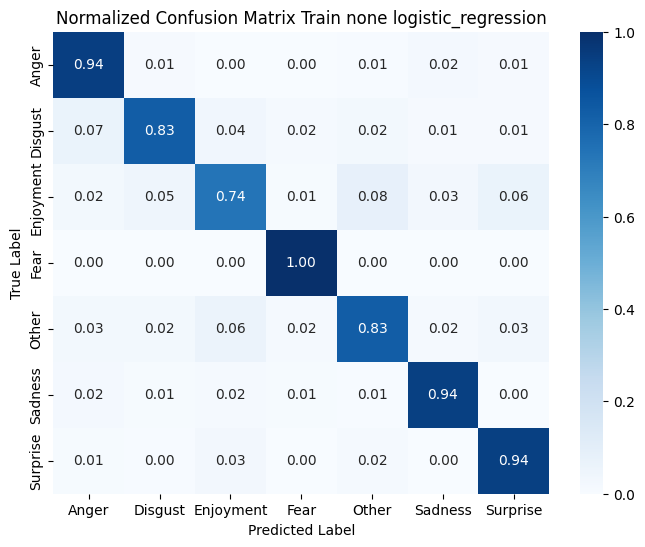

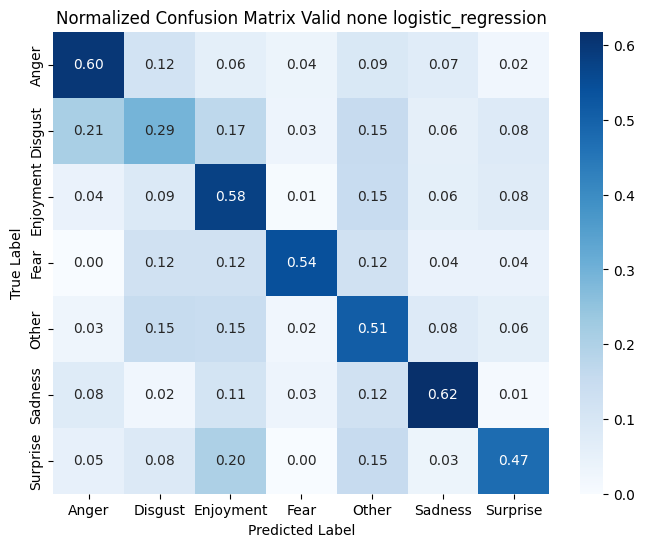

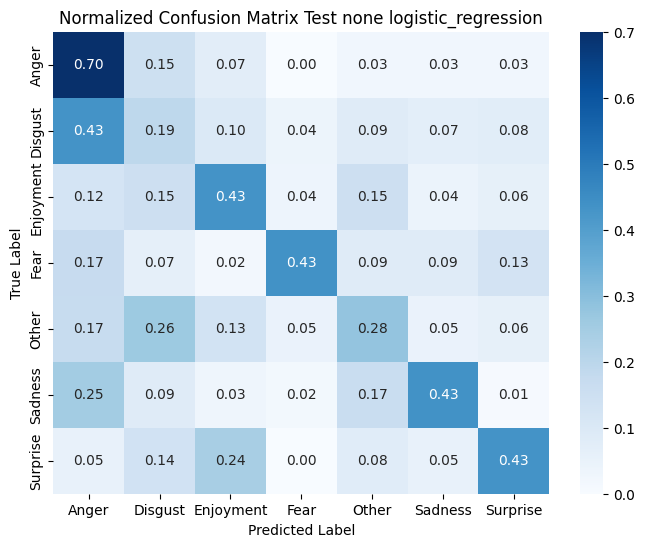

In [189]:
model_82, train_82, valid_82, test_82, pred_82 = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="logistic_regression",
    max_iter=1000
)

# Dự đoán từ pipeline_modeling
y_pred_train_82, y_pred_valid_82, y_pred_test_82 = pred_82

pipeline_evaluation(
    y_train_82, y_valid_82, y_test_82,
    y_pred_train_82, y_pred_valid_82, y_pred_test_82,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (3609, 5567) (số câu x số từ vựng)
Số từ vựng: 5567
TF-IDF - Non-zero values: 43157


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.7888611803823774
Recall: 0.7888611803823774
Precision: 0.8116695769184297
F1-score: 0.7899539515771135

--- valid --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.5260243632336655
Recall: 0.5260243632336655
Precision: 0.5511562296167888
F1-score: 0.5319003085314189

--- test --- 8:2 --- logistic_regression --- pca ---
Accuracy: 0.3706395348837209
Recall: 0.3706395348837209
Precision: 0.4474725974552855
F1-score: 0.38902464399457976


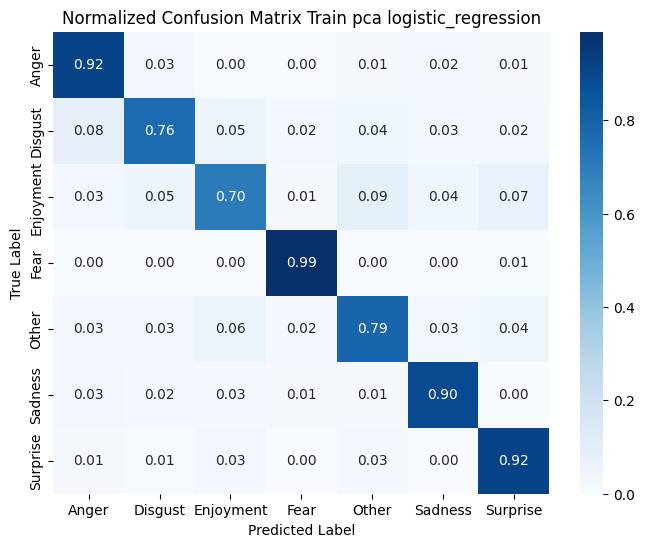

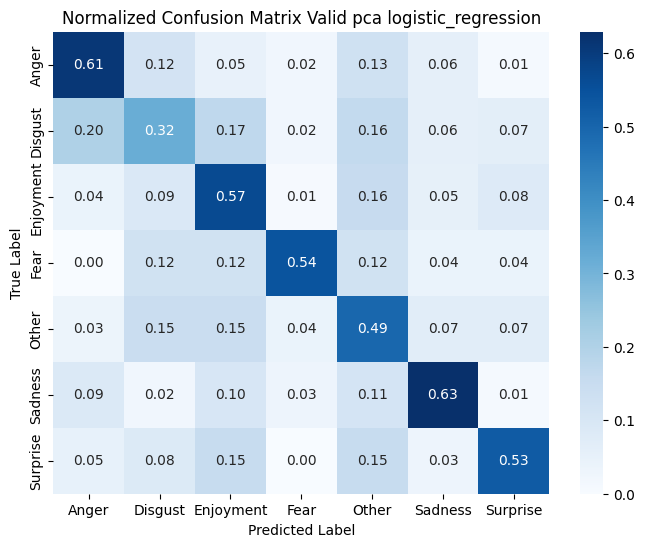

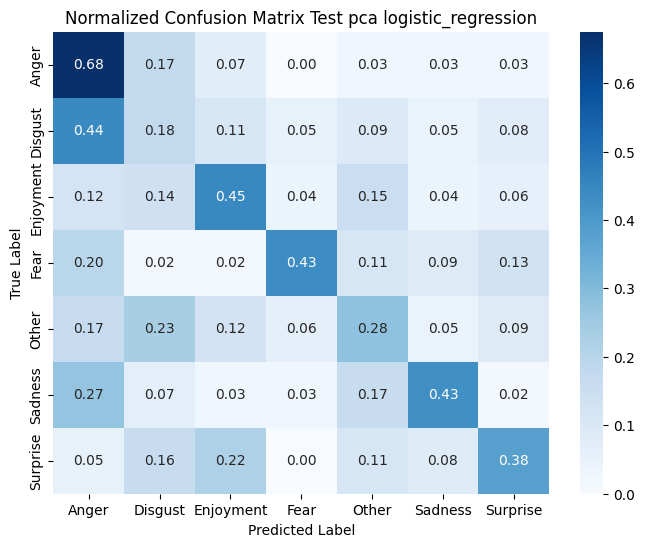

In [39]:
# Chuẩn bị dữ liệu với PCA
X_train_pca_82, X_valid_pca_82, X_test_pca_82, y_train_pca_82, y_valid_pca_82, y_test_pca_82, tfidf_vec_pca_82, disc_model_pca_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="pca"
)

# Chạy mô hình Logistic Regression trên dữ liệu PCA
model_pca_82, train_pca_82, valid_pca_82, test_pca_82, pred_pca_82 = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_pca_82, y_valid_pca_82, y_test_pca_82 = train_pca_82[1], valid_pca_82[1], test_pca_82[1]
y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82 = pred_pca_82

pipeline_evaluation(
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    y_pred_train_pca_82, y_pred_valid_pca_82, y_pred_test_pca_82,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (3609, 5567) (số câu x số từ vựng)
Số từ vựng: 5567
TF-IDF - Non-zero values: 43157


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.9925187032418953
Recall: 0.9925187032418953
Precision: 0.9927521683737478
F1-score: 0.9925700194160588

--- valid --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.3399778516057586
Recall: 0.3399778516057586
Precision: 0.36650802578940167
F1-score: 0.342623146549387

--- test --- 8:2 --- logistic_regression --- lda ---
Accuracy: 0.23546511627906977
Recall: 0.23546511627906977
Precision: 0.28458295212076823
F1-score: 0.23235321069819845


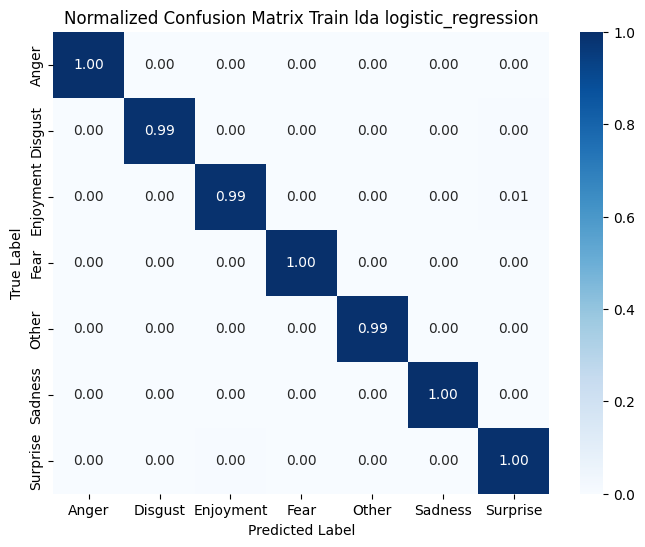

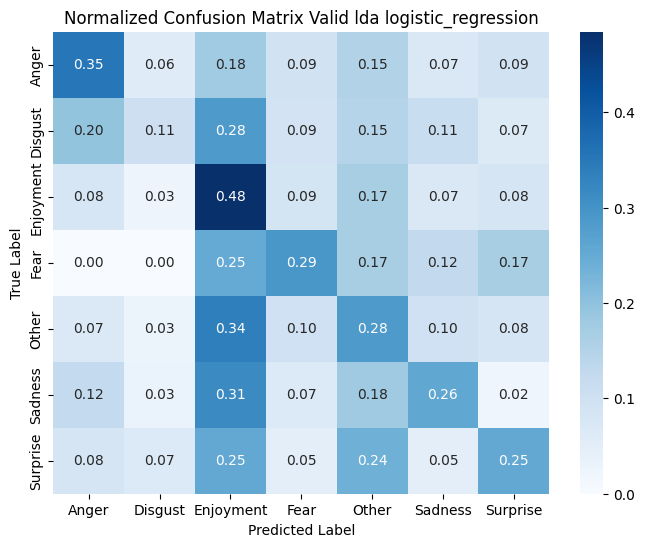

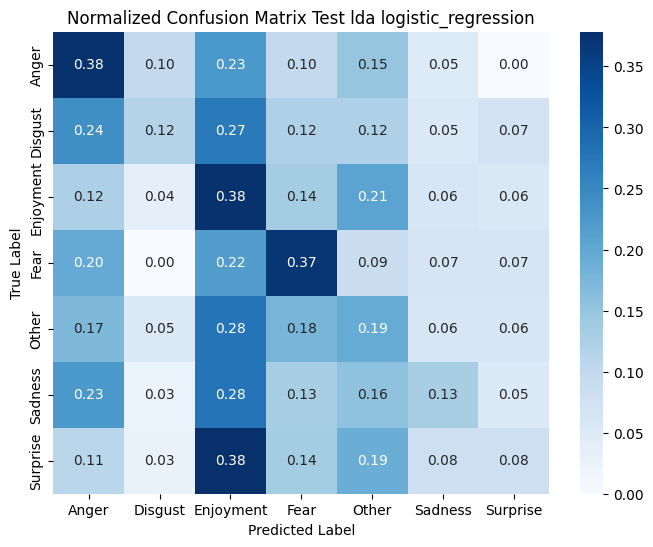

In [40]:
# Chuẩn bị dữ liệu với LDA
X_train_lda_82, X_valid_lda_82, X_test_lda_82, y_train_lda_82, y_valid_lda_82, y_test_lda_82, tfidf_vec_lda_82, disc_model_lda_82 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=8,
    valid_size=2,
    discriminant="lda"
)

# Chạy mô hình Logistic Regression trên dữ liệu LDA
model_lda_82, train_lda_82, valid_lda_82, test_lda_82, pred_lda_82 = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="logistic_regression",
    max_iter=1000
)

y_train_lda_82, y_valid_lda_82, y_test_lda_82 = train_lda_82[1], valid_lda_82[1], test_lda_82[1]
y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82 = pred_lda_82

pipeline_evaluation(
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    y_pred_train_lda_82, y_pred_valid_lda_82, y_pred_test_lda_82,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn --- none ---
Accuracy: 0.4937655860349127
Recall: 0.4937655860349127
Precision: 0.5628450233710124
F1-score: 0.4133200981234533

--- valid --- 8:2 --- knn --- none ---
Accuracy: 0.4673311184939092
Recall: 0.4673311184939092
Precision: 0.47551252009100614
F1-score: 0.38453618424709324

--- test --- 8:2 --- knn --- none ---
Accuracy: 0.31540697674418605
Recall: 0.31540697674418605
Precision: 0.45205507105943155
F1-score: 0.21549153450120082


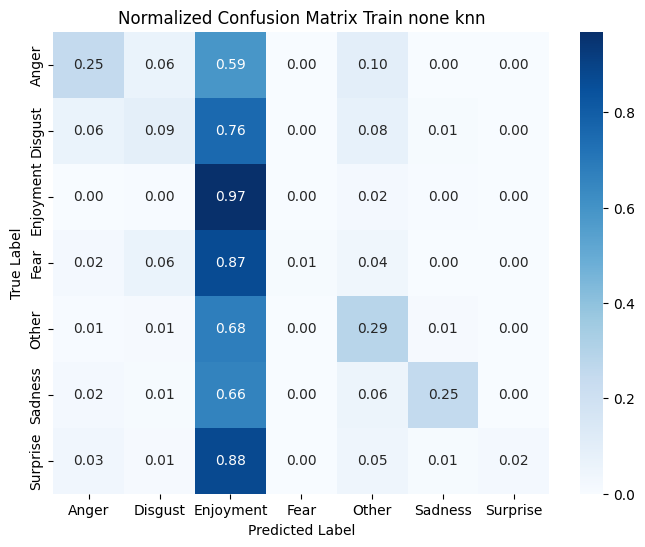

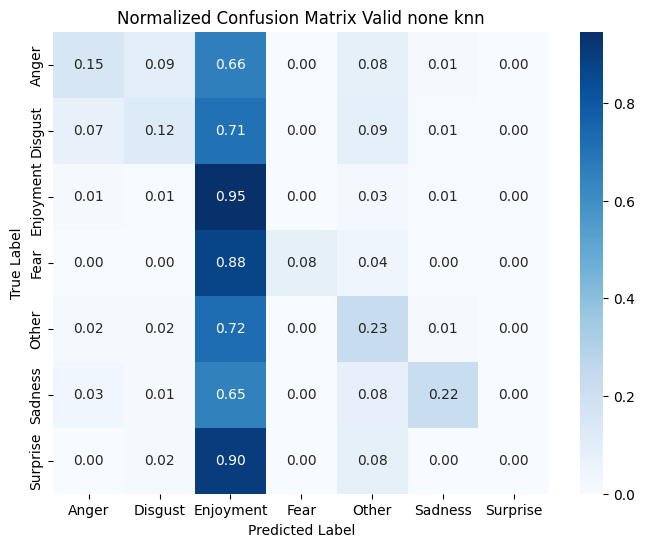

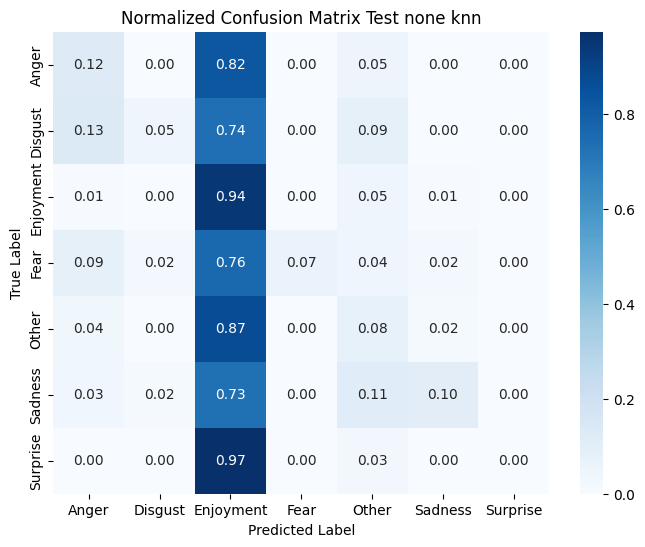

In [41]:
# Chạy KNN - cosine - None
model_82_knn, train_82_knn, valid_82_knn, test_82_knn, pred_82_knn = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn"
)

y_train_82_knn, y_valid_82_knn, y_test_82_knn = train_82_knn[1], valid_82_knn[1], test_82_knn[1]
y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn = pred_82_knn

pipeline_evaluation(
    y_train_82_knn, y_valid_82_knn, y_test_82_knn,
    y_pred_train_82_knn, y_pred_valid_82_knn, y_pred_test_82_knn,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.4732612912164034
Recall: 0.4732612912164034
Precision: 0.550026573557396
F1-score: 0.3807821401254821

--- valid --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.4584717607973422
Recall: 0.4584717607973422
Precision: 0.5111573452306116
F1-score: 0.36304223348723724

--- test --- 8:2 --- knn_euclidean --- none ---
Accuracy: 0.30523255813953487
Recall: 0.30523255813953487
Precision: 0.4667055868794411
F1-score: 0.19098317707108814


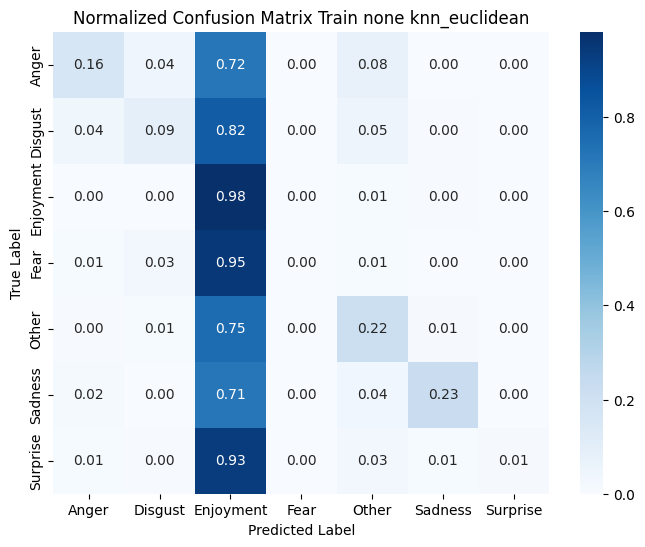

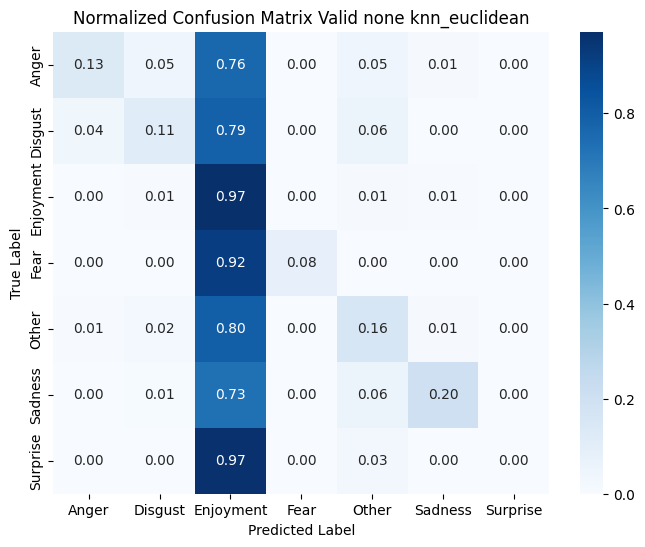

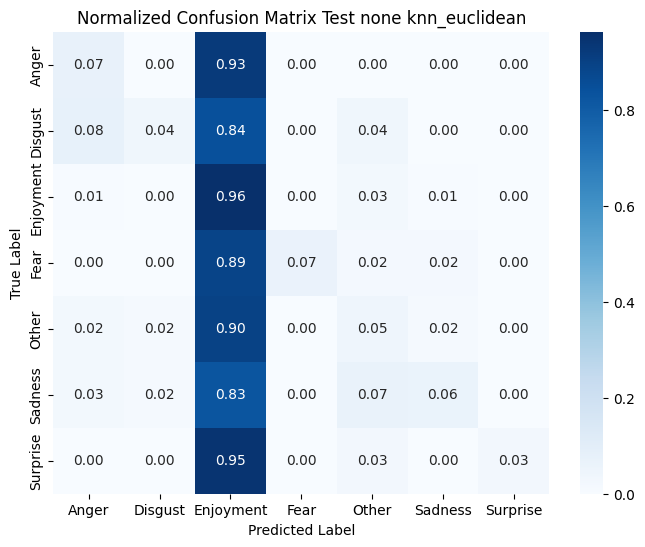

In [42]:
# KNN - euclidean - None
model_82_knn_euclidean, train_82_knn_euclidean, valid_82_knn_euclidean, test_82_knn_euclidean, pred_82_knn_euclidean = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="knn",
    metric="euclidean"
)

y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean = train_82_knn_euclidean[1], valid_82_knn_euclidean[1], test_82_knn_euclidean[1]
y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean = pred_82_knn_euclidean

pipeline_evaluation(
    y_train_82_knn_euclidean, y_valid_82_knn_euclidean, y_test_82_knn_euclidean,
    y_pred_train_82_knn_euclidean, y_pred_valid_82_knn_euclidean, y_pred_test_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- knn --- pca ---
Accuracy: 0.49348850096979774
Recall: 0.49348850096979774
Precision: 0.5466723608588676
F1-score: 0.4119911717594478

--- valid --- 8:2 --- knn --- pca ---
Accuracy: 0.46511627906976744
Recall: 0.46511627906976744
Precision: 0.4777226268188905
F1-score: 0.3843464469877788

--- test --- 8:2 --- knn --- pca ---
Accuracy: 0.3241279069767442
Recall: 0.3241279069767442
Precision: 0.500264446353817
F1-score: 0.2331570889610595


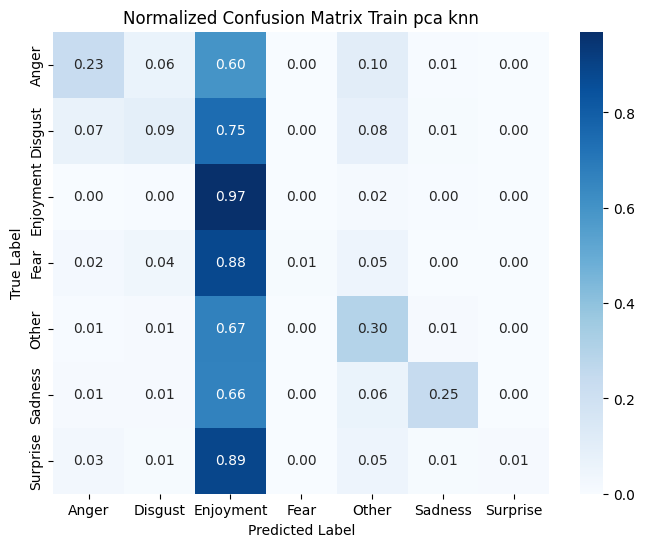

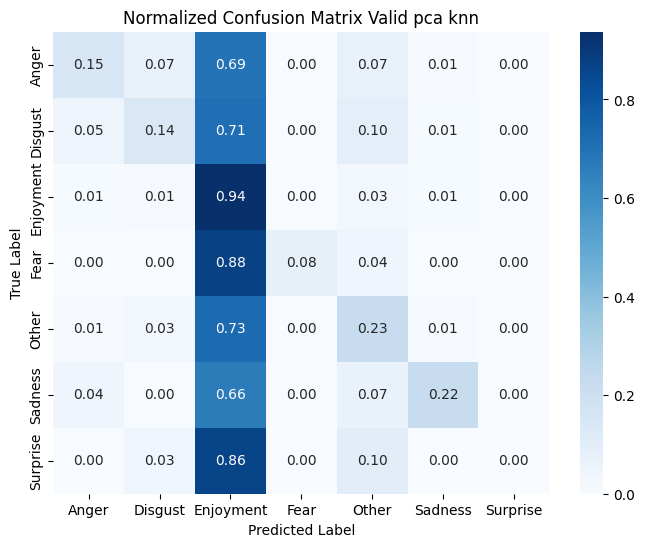

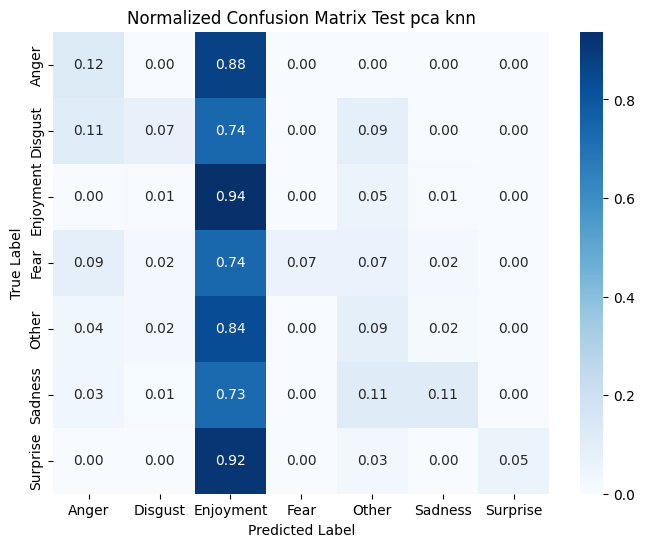

In [43]:
model_pca_82_knn, train_pca_82_knn, valid_pca_82_knn, test_pca_82_knn, pred_pca_82_knn = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    max_iter=1000
)

y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn = train_pca_82_knn[1], valid_pca_82_knn[1], test_pca_82_knn[1]
y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn = pred_pca_82_knn

pipeline_evaluation(
    y_train_pca_82_knn, y_valid_pca_82_knn, y_test_pca_82_knn,
    y_pred_train_pca_82_knn, y_pred_valid_pca_82_knn, y_pred_test_pca_82_knn,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

--- train --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.48434469382100304
Recall: 0.48434469382100304
Precision: 0.562634101904743
F1-score: 0.39755145313836826

--- valid --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.45957918050941304
Recall: 0.45957918050941304
Precision: 0.5018252807956498
F1-score: 0.3706029513467035

--- test --- 8:2 --- knn_euclidean --- pca ---
Accuracy: 0.30523255813953487
Recall: 0.30523255813953487
Precision: 0.42491173339298244
F1-score: 0.18979871541140667


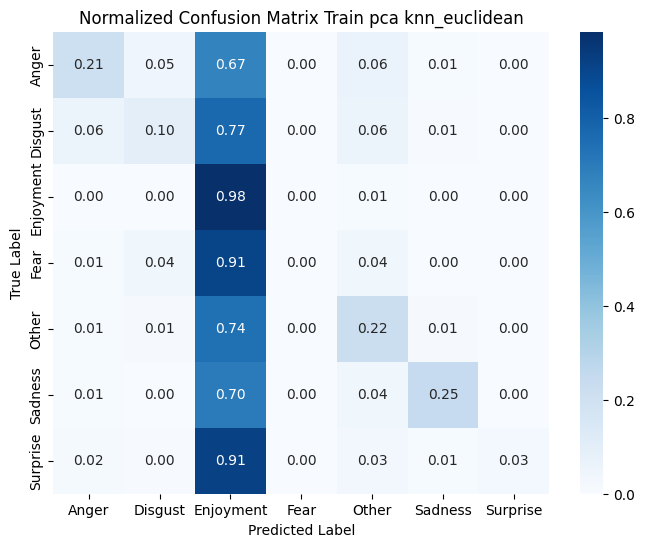

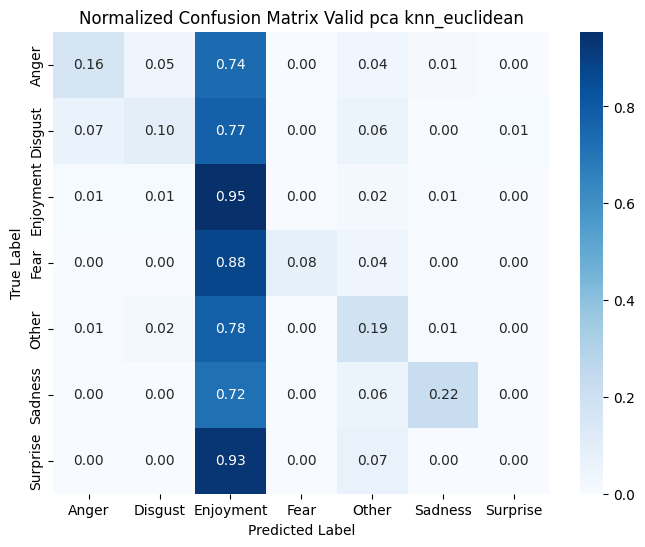

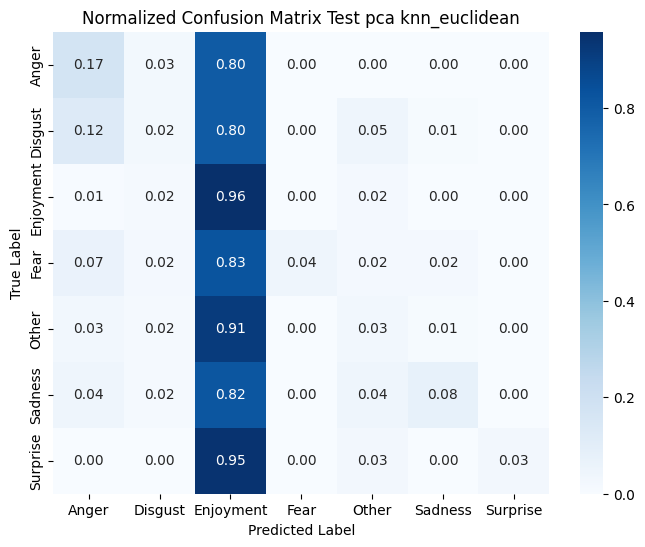

In [44]:
# KNN - euclidean - PCA
model_pca_82_knn_euclidean, train_pca_82_knn_euclidean, valid_pca_82_knn_euclidean, test_pca_82_knn_euclidean, pred_pca_82_knn_euclidean = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean = train_pca_82_knn_euclidean[1], valid_pca_82_knn_euclidean[1], test_pca_82_knn_euclidean[1]
y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean = pred_pca_82_knn_euclidean

pipeline_evaluation(
    y_train_pca_82_knn_euclidean, y_valid_pca_82_knn_euclidean, y_test_pca_82_knn_euclidean,
    y_pred_train_pca_82_knn_euclidean, y_pred_valid_pca_82_knn_euclidean, y_pred_test_pca_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.9939041285674702
Recall: 0.9939041285674702
Precision: 0.9939289831921448
F1-score: 0.993897881670261

--- valid --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.31450719822812845
Recall: 0.31450719822812845
Precision: 0.34693732296937857
F1-score: 0.32416792541582684

--- test --- 8:2 --- knn_euclidean --- lda ---
Accuracy: 0.2688953488372093
Recall: 0.2688953488372093
Precision: 0.30804184712815413
F1-score: 0.2765808875085975


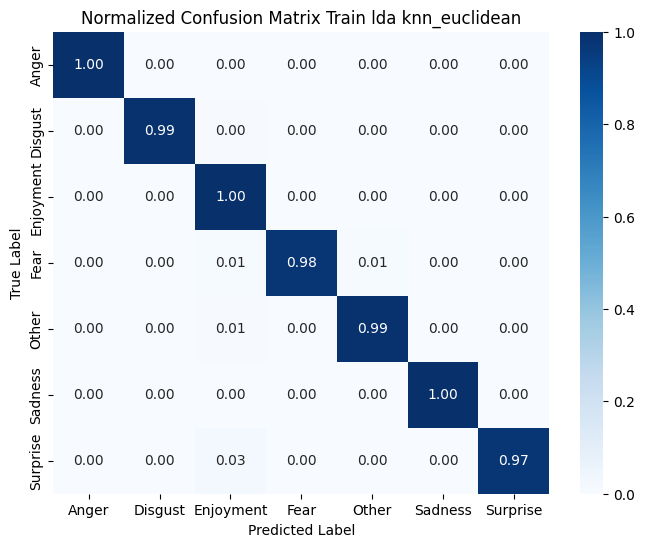

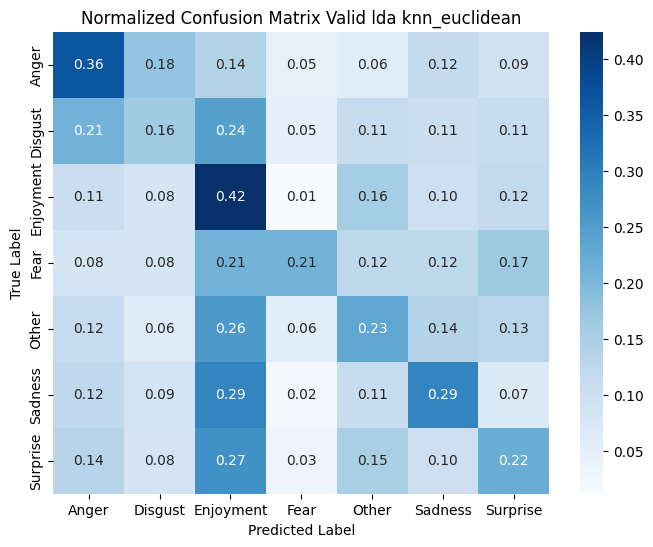

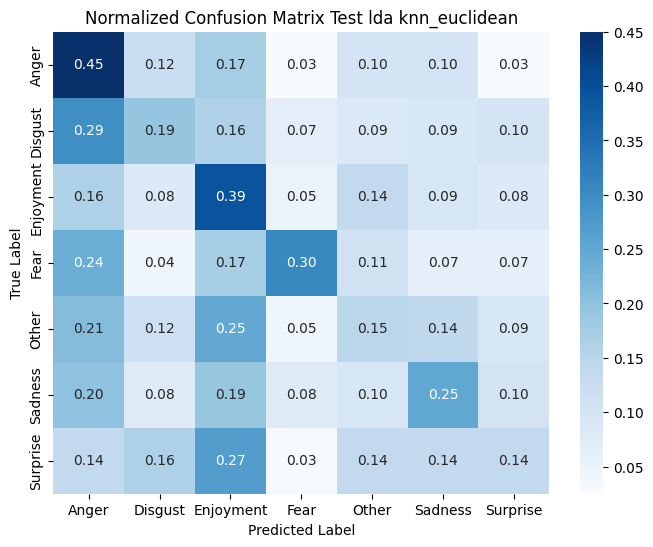

In [45]:
# KNN - euclidean - LDA
model_lda_82_knn_euclidean, train_lda_82_knn_euclidean, valid_lda_82_knn_euclidean, test_lda_82_knn_euclidean, pred_lda_82_knn_euclidean = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean = train_lda_82_knn_euclidean[1], valid_lda_82_knn_euclidean[1], test_lda_82_knn_euclidean[1]
y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean = pred_lda_82_knn_euclidean

pipeline_evaluation(
    y_train_lda_82_knn_euclidean, y_valid_lda_82_knn_euclidean, y_test_lda_82_knn_euclidean,
    y_pred_train_lda_82_knn_euclidean, y_pred_valid_lda_82_knn_euclidean, y_pred_test_lda_82_knn_euclidean,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 8:2 --- knn --- lda ---
Accuracy: 0.9911332779163203
Recall: 0.9911332779163203
Precision: 0.991363579007379
F1-score: 0.9911829914250179

--- valid --- 8:2 --- knn --- lda ---
Accuracy: 0.29346622369878184
Recall: 0.29346622369878184
Precision: 0.3513677140212064
F1-score: 0.30726806191686984

--- test --- 8:2 --- knn --- lda ---
Accuracy: 0.23837209302325582
Recall: 0.23837209302325582
Precision: 0.2871380902867655
F1-score: 0.24485105312240085


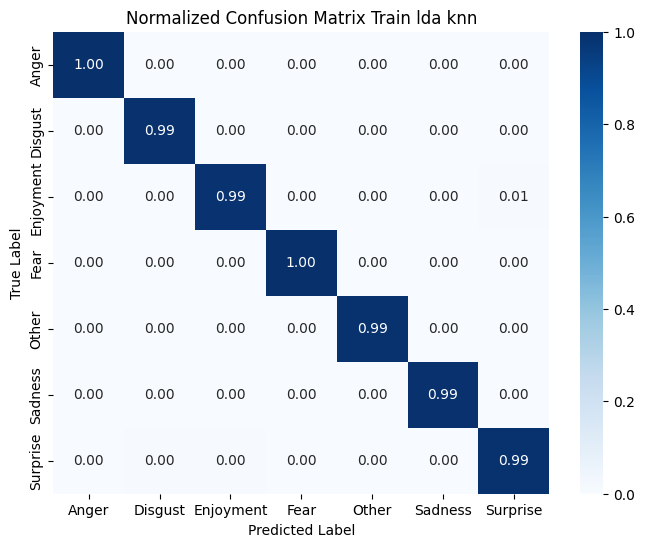

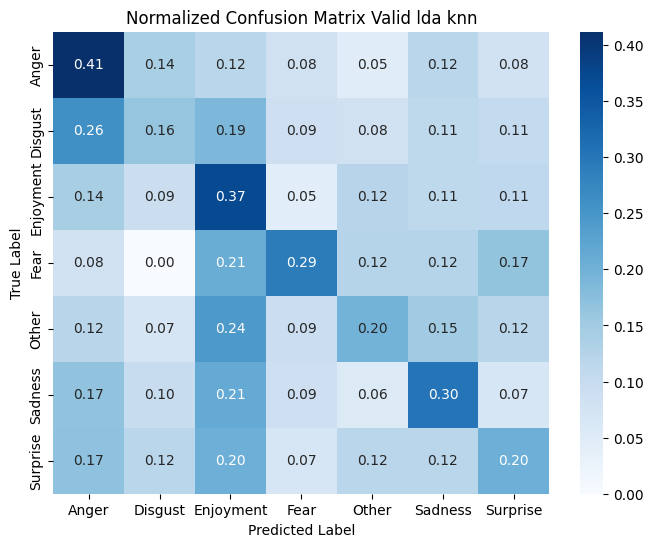

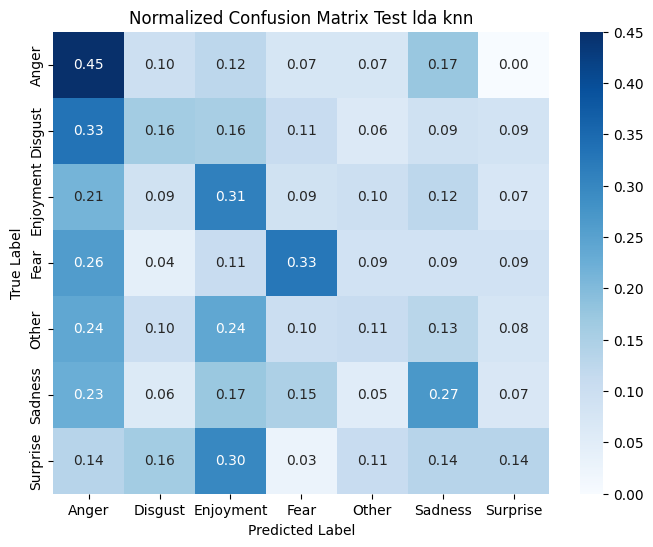

In [46]:
model_lda_82_knn, train_lda_82_knn, valid_lda_82_knn, test_lda_82_knn, pred_lda_82_knn = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="knn",
    max_iter=1000
)

y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn = train_lda_82_knn[1], valid_lda_82_knn[1], test_lda_82_knn[1]
y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn = pred_lda_82_knn

pipeline_evaluation(
    y_train_lda_82_knn, y_valid_lda_82_knn, y_test_lda_82_knn,
    y_pred_train_lda_82_knn, y_pred_valid_lda_82_knn, y_pred_test_lda_82_knn,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu không giảm chiều

--- train --- 8:2 --- svm_linear --- none ---
Accuracy: 0.941535051260737
Recall: 0.941535051260737
Precision: 0.9435465618117945
F1-score: 0.9417317867993857

--- valid --- 8:2 --- svm_linear --- none ---
Accuracy: 0.5481727574750831
Recall: 0.5481727574750831
Precision: 0.5499711921869835
F1-score: 0.5476368895210814

--- test --- 8:2 --- svm_linear --- none ---
Accuracy: 0.38808139534883723
Recall: 0.38808139534883723
Precision: 0.4266167185505259
F1-score: 0.392519772672662


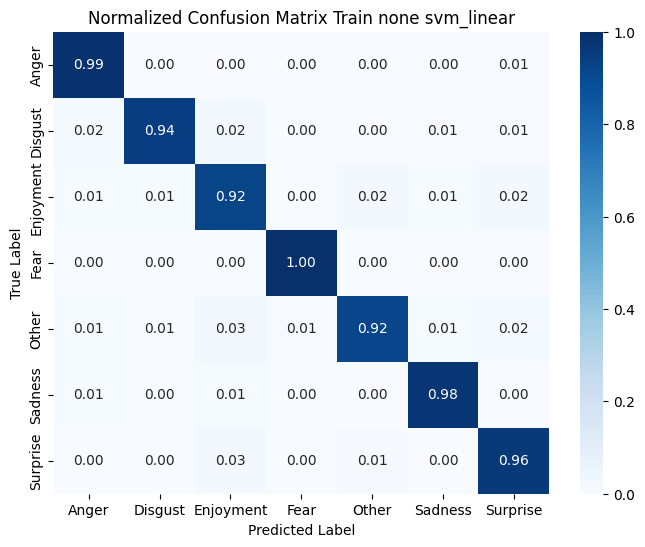

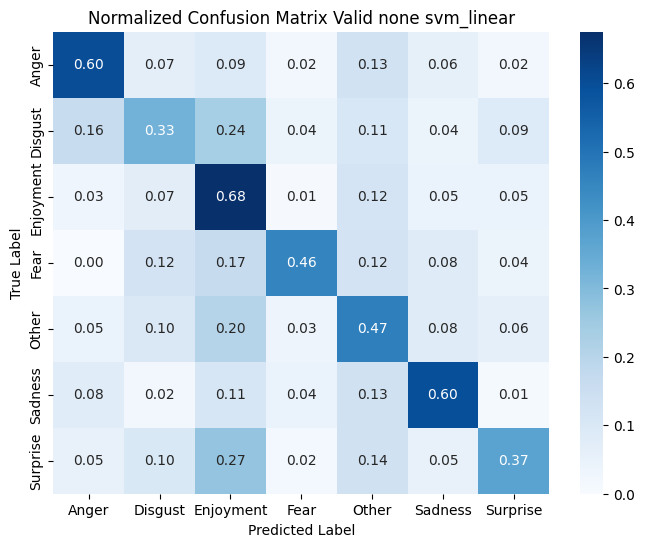

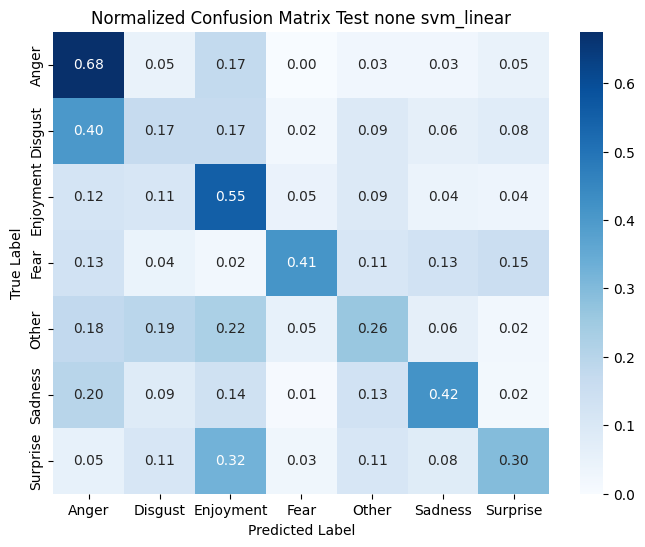

In [47]:
# SVM - linear - None (8:2)
model_82_svm_linear, train_82_svm_linear, valid_82_svm_linear, test_82_svm_linear, pred_82_svm_linear = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear = train_82_svm_linear[1], valid_82_svm_linear[1], test_82_svm_linear[1]
y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear = pred_82_svm_linear

pipeline_evaluation(
    y_train_82_svm_linear, y_valid_82_svm_linear, y_test_82_svm_linear,
    y_pred_train_82_svm_linear, y_pred_valid_82_svm_linear, y_pred_test_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_poly --- none ---
Accuracy: 0.7930174563591023
Recall: 0.7930174563591023
Precision: 0.8645225228602139
F1-score: 0.7818635825259673

--- valid --- 8:2 --- svm_poly --- none ---
Accuracy: 0.3576965669988926
Recall: 0.3576965669988926
Precision: 0.548404830283641
F1-score: 0.3253129561305263

--- test --- 8:2 --- svm_poly --- none ---
Accuracy: 0.24709302325581395
Recall: 0.24709302325581395
Precision: 0.46078578480070104
F1-score: 0.19718383535225403


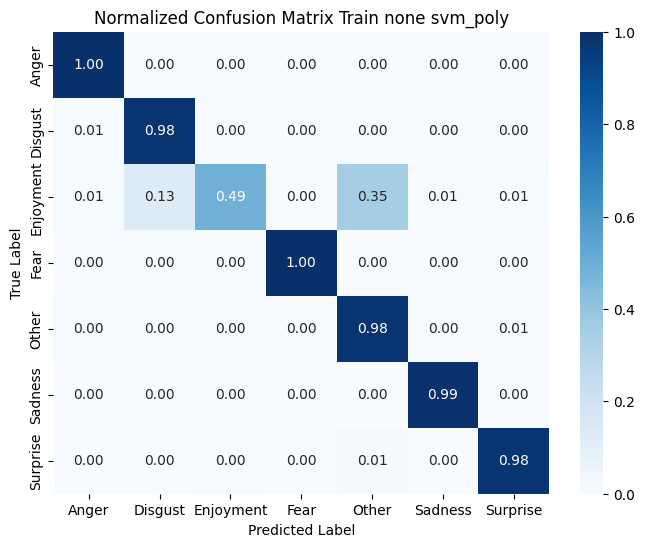

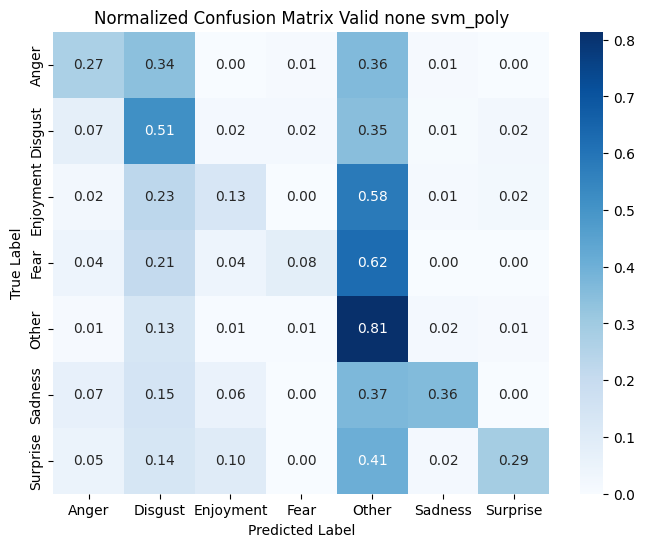

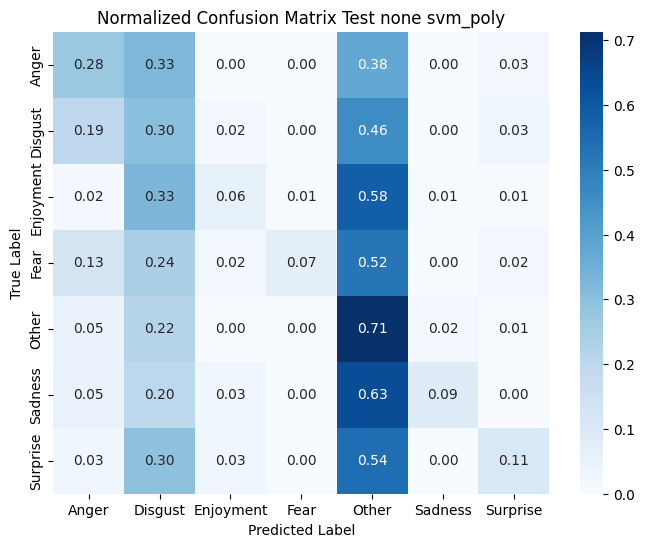

In [48]:
# SVM - poly - None (8:2)
model_82_svm_poly, train_82_svm_poly, valid_82_svm_poly, test_82_svm_poly, pred_82_svm_poly = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly = train_82_svm_poly[1], valid_82_svm_poly[1], test_82_svm_poly[1]
y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly = pred_82_svm_poly

pipeline_evaluation(
    y_train_82_svm_poly, y_valid_82_svm_poly, y_test_82_svm_poly,
    y_pred_train_82_svm_poly, y_pred_valid_82_svm_poly, y_pred_test_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.7381546134663342
Recall: 0.7381546134663342
Precision: 0.8365018497860081
F1-score: 0.7103508726016841

--- valid --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.40310077519379844
Recall: 0.40310077519379844
Precision: 0.5461531255907878
F1-score: 0.3826937556891231

--- test --- 8:2 --- svm_rbf --- none ---
Accuracy: 0.2921511627906977
Recall: 0.2921511627906977
Precision: 0.4840701220182257
F1-score: 0.28804582650815863


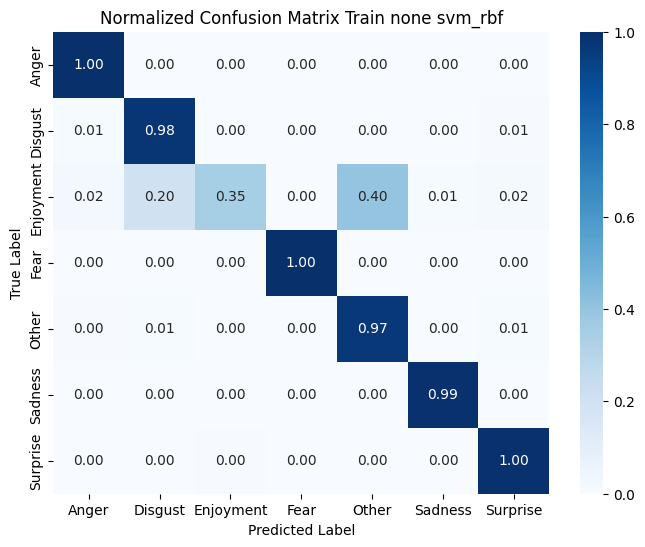

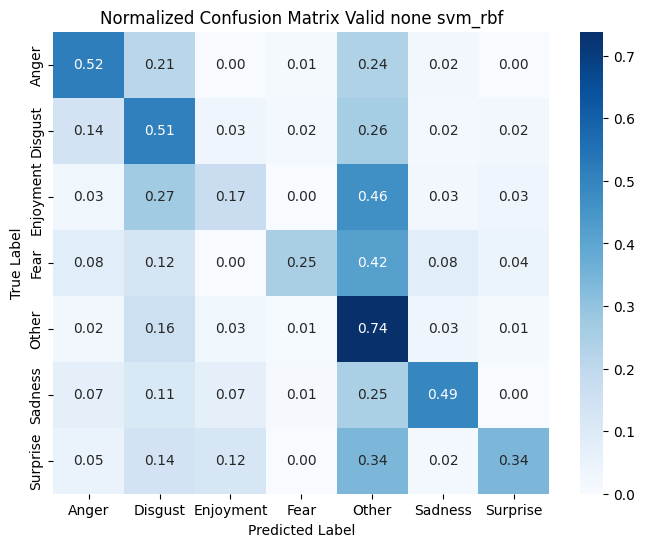

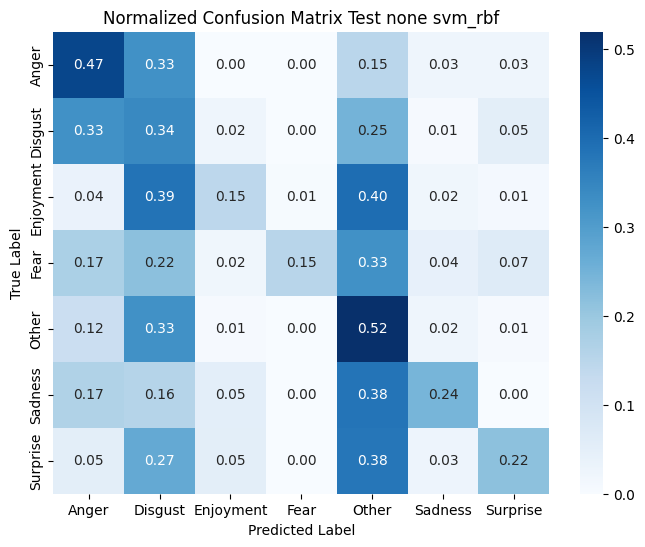

In [49]:
# SVM - rbf - None (8:2)
model_82_svm_rbf, train_82_svm_rbf, valid_82_svm_rbf, test_82_svm_rbf, pred_82_svm_rbf = pipeline_modeling(
    X_train_82, X_valid_82, X_test_82,
    y_train_82, y_valid_82, y_test_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf = train_82_svm_rbf[1], valid_82_svm_rbf[1], test_82_svm_rbf[1]
y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf = pred_82_svm_rbf

pipeline_evaluation(
    y_train_82_svm_rbf, y_valid_82_svm_rbf, y_test_82_svm_rbf,
    y_pred_train_82_svm_rbf, y_pred_valid_82_svm_rbf, y_pred_test_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.885286783042394
Recall: 0.885286783042394
Precision: 0.889857320529596
F1-score: 0.8854554114111685

--- valid --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.53156146179402
Recall: 0.53156146179402
Precision: 0.5377552254029866
F1-score: 0.532705987721258

--- test --- 8:2 --- svm_linear --- pca ---
Accuracy: 0.3808139534883721
Recall: 0.3808139534883721
Precision: 0.4210797595364274
F1-score: 0.38854071131083295


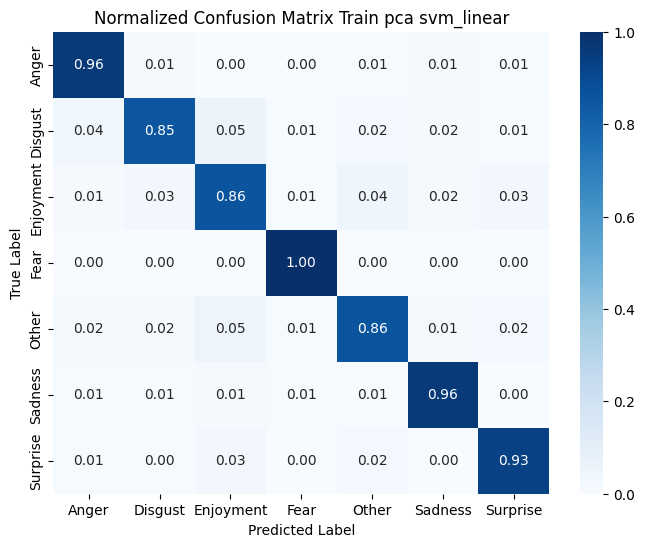

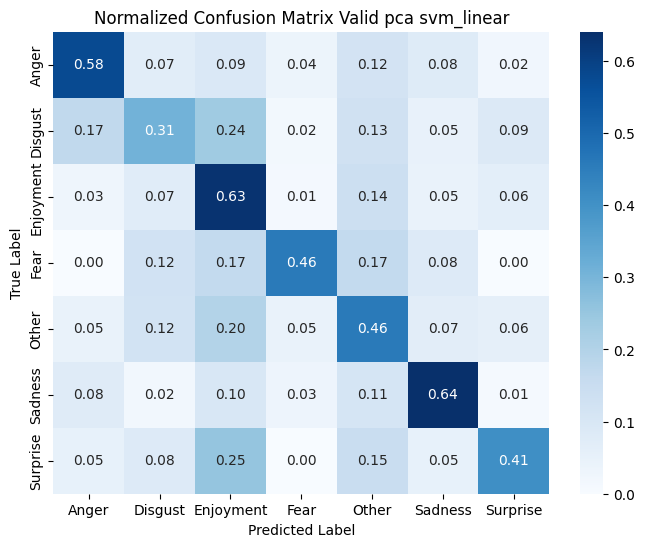

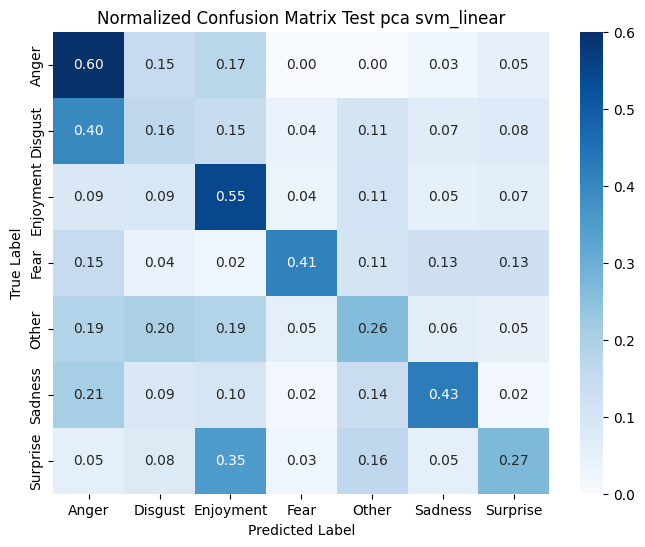

In [50]:
# SVM - linear - PCA (8:2)
model_pca_82_svm_linear, train_pca_82_svm_linear, valid_pca_82_svm_linear, test_pca_82_svm_linear, pred_pca_82_svm_linear = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear = train_pca_82_svm_linear[1], valid_pca_82_svm_linear[1], test_pca_82_svm_linear[1]
y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear = pred_pca_82_svm_linear

pipeline_evaluation(
    y_train_pca_82_svm_linear, y_valid_pca_82_svm_linear, y_test_pca_82_svm_linear,
    y_pred_train_pca_82_svm_linear, y_pred_valid_pca_82_svm_linear, y_pred_test_pca_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.7921862011637573
Recall: 0.7921862011637573
Precision: 0.8586692540874581
F1-score: 0.7804919537702684

--- valid --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.37320044296788485
Recall: 0.37320044296788485
Precision: 0.5595816783416465
F1-score: 0.3497435011622606

--- test --- 8:2 --- svm_poly --- pca ---
Accuracy: 0.251453488372093
Recall: 0.251453488372093
Precision: 0.453239803262213
F1-score: 0.2037530507240926


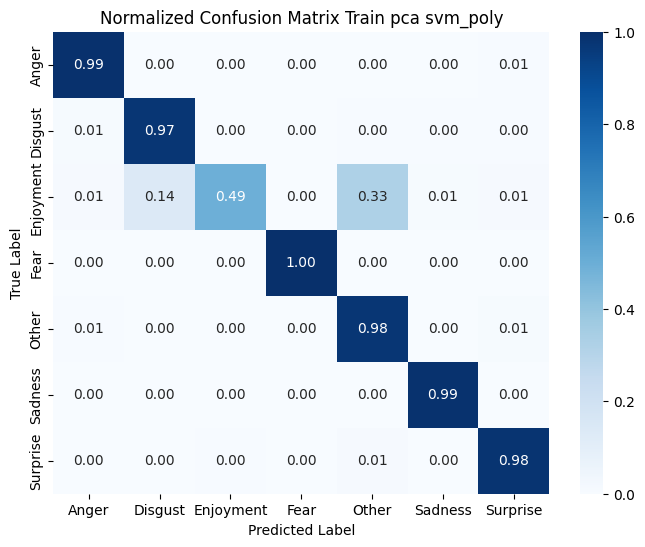

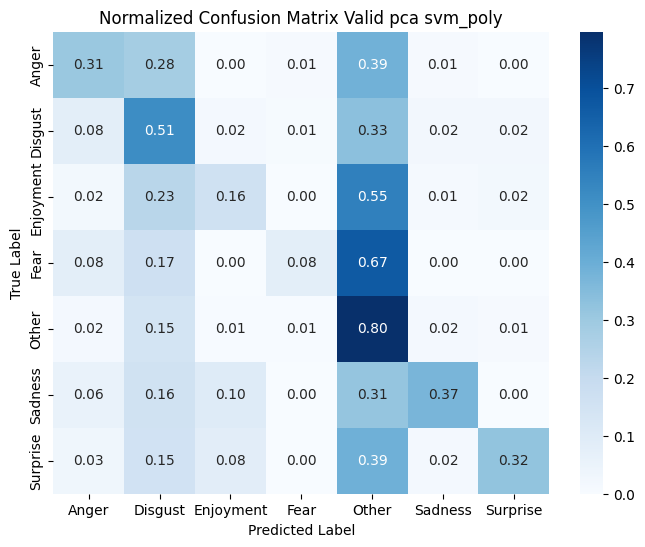

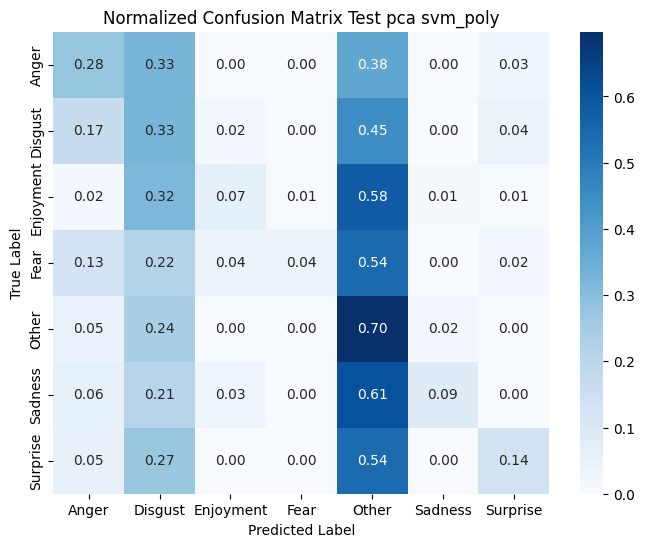

In [51]:
# SVM - poly - PCA (8:2)
model_pca_82_svm_poly, train_pca_82_svm_poly, valid_pca_82_svm_poly, test_pca_82_svm_poly, pred_pca_82_svm_poly = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly = train_pca_82_svm_poly[1], valid_pca_82_svm_poly[1], test_pca_82_svm_poly[1]
y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly = pred_pca_82_svm_poly

pipeline_evaluation(
    y_train_pca_82_svm_poly, y_valid_pca_82_svm_poly, y_test_pca_82_svm_poly,
    y_pred_train_pca_82_svm_poly, y_pred_valid_pca_82_svm_poly, y_pred_test_pca_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.7489609310058188
Recall: 0.7489609310058188
Precision: 0.8317100812702795
F1-score: 0.7262572271190114

--- valid --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.42967884828349945
Recall: 0.42967884828349945
Precision: 0.5403389965098578
F1-score: 0.4343548282166624

--- test --- 8:2 --- svm_rbf --- pca ---
Accuracy: 0.3168604651162791
Recall: 0.3168604651162791
Precision: 0.4865779191563196
F1-score: 0.331788042203411


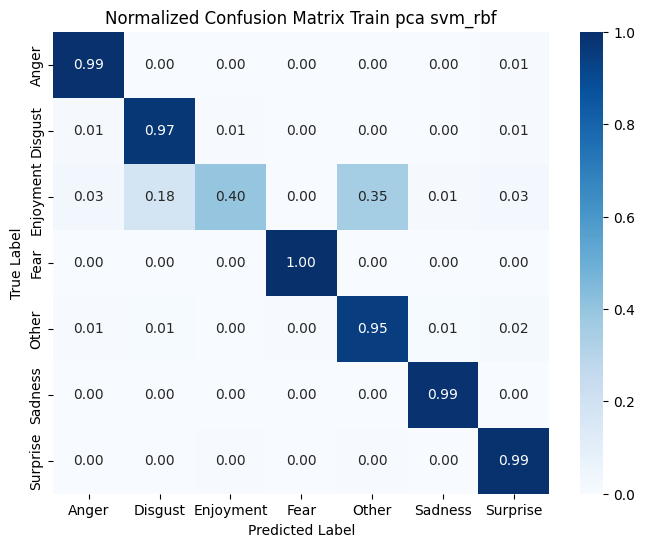

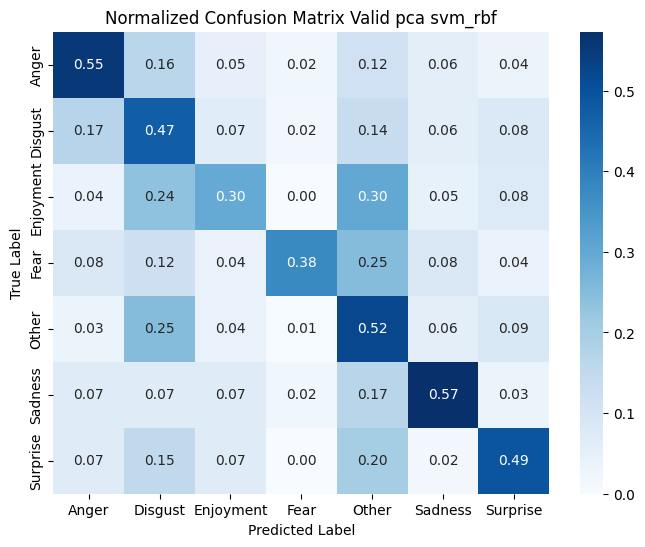

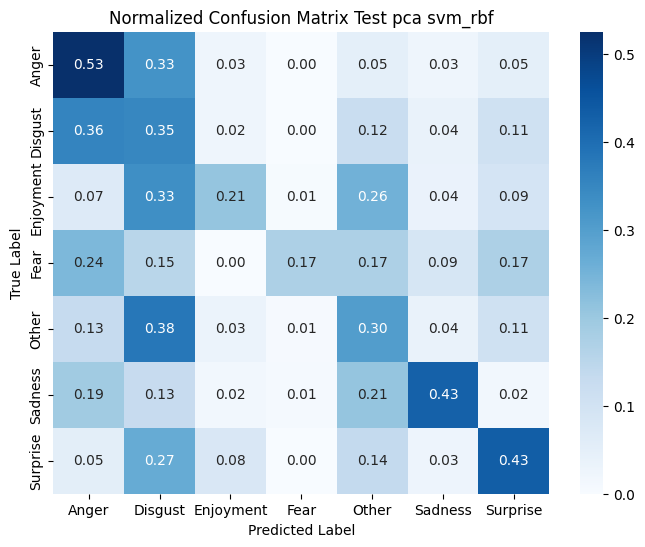

In [52]:
# SVM - rbf - PCA (8:2)
model_pca_82_svm_rbf, train_pca_82_svm_rbf, valid_pca_82_svm_rbf, test_pca_82_svm_rbf, pred_pca_82_svm_rbf = pipeline_modeling(
    X_train_pca_82, X_valid_pca_82, X_test_pca_82,
    y_train_pca_82, y_valid_pca_82, y_test_pca_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf = train_pca_82_svm_rbf[1], valid_pca_82_svm_rbf[1], test_pca_82_svm_rbf[1]
y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf = pred_pca_82_svm_rbf

pipeline_evaluation(
    y_train_pca_82_svm_rbf, y_valid_pca_82_svm_rbf, y_test_pca_82_svm_rbf,
    y_pred_train_pca_82_svm_rbf, y_pred_valid_pca_82_svm_rbf, y_pred_test_pca_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.9925187032418953
Recall: 0.9925187032418953
Precision: 0.992766783292365
F1-score: 0.9925752297279133

--- valid --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.3388704318936877
Recall: 0.3388704318936877
Precision: 0.3554585142439762
F1-score: 0.34178462876373034

--- test --- 8:2 --- svm_linear --- lda ---
Accuracy: 0.25726744186046513
Recall: 0.25726744186046513
Precision: 0.29020254059261846
F1-score: 0.2512695754032167


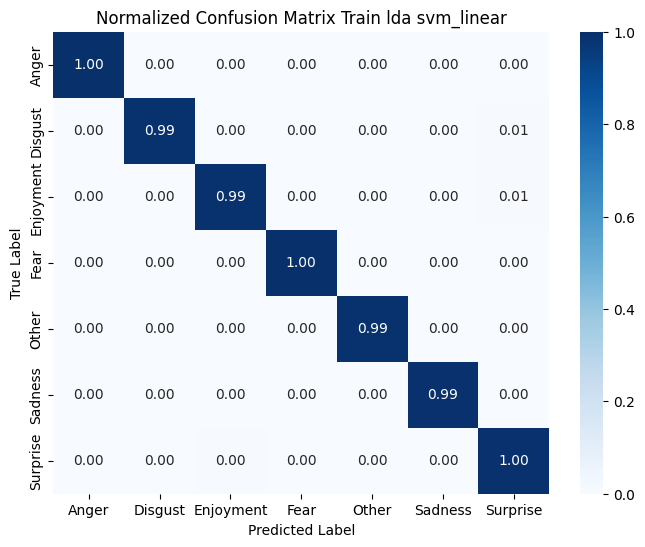

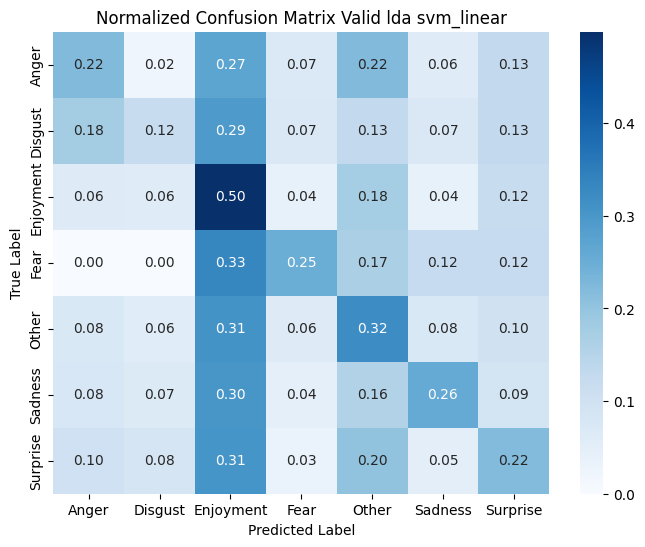

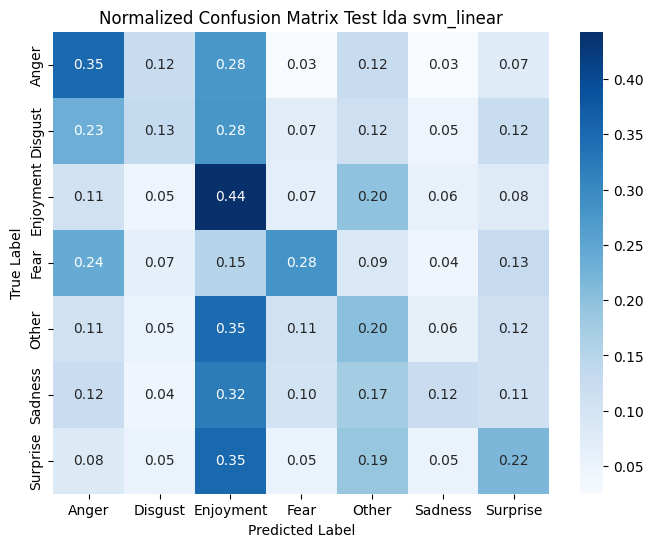

In [53]:
# SVM - linear - LDA (8:2)
model_lda_82_svm_linear, train_lda_82_svm_linear, valid_lda_82_svm_linear, test_lda_82_svm_linear, pred_lda_82_svm_linear = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear = train_lda_82_svm_linear[1], valid_lda_82_svm_linear[1], test_lda_82_svm_linear[1]
y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear = pred_lda_82_svm_linear

pipeline_evaluation(
    y_train_lda_82_svm_linear, y_valid_lda_82_svm_linear, y_test_lda_82_svm_linear,
    y_pred_train_lda_82_svm_linear, y_pred_valid_lda_82_svm_linear, y_pred_test_lda_82_svm_linear,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.9914103629814353
Recall: 0.9914103629814353
Precision: 0.9914928071588875
F1-score: 0.991411391950853

--- valid --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.2248062015503876
Recall: 0.2248062015503876
Precision: 0.35677306995819147
F1-score: 0.23699943674042814

--- test --- 8:2 --- svm_poly --- lda ---
Accuracy: 0.15988372093023256
Recall: 0.15988372093023256
Precision: 0.2756381648263626
F1-score: 0.16802555667195404


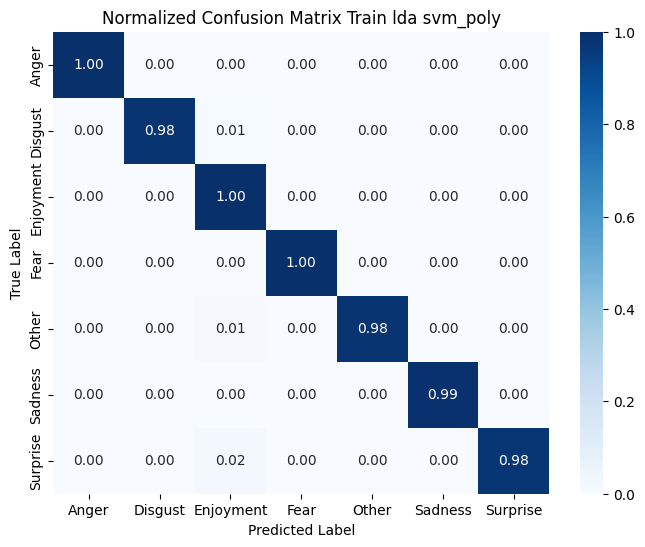

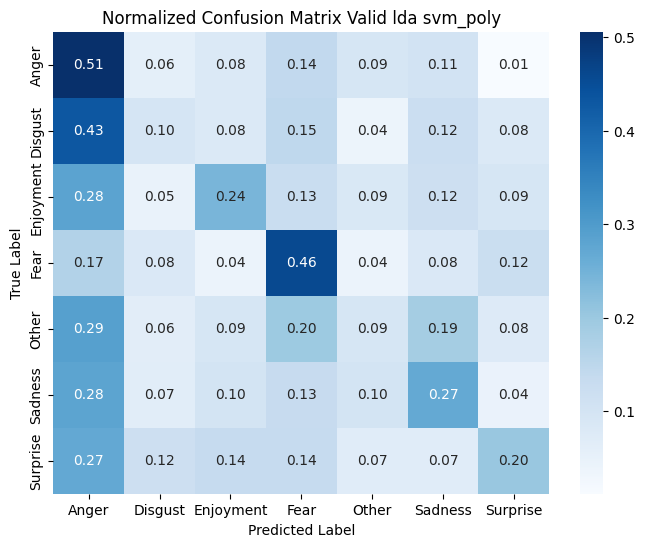

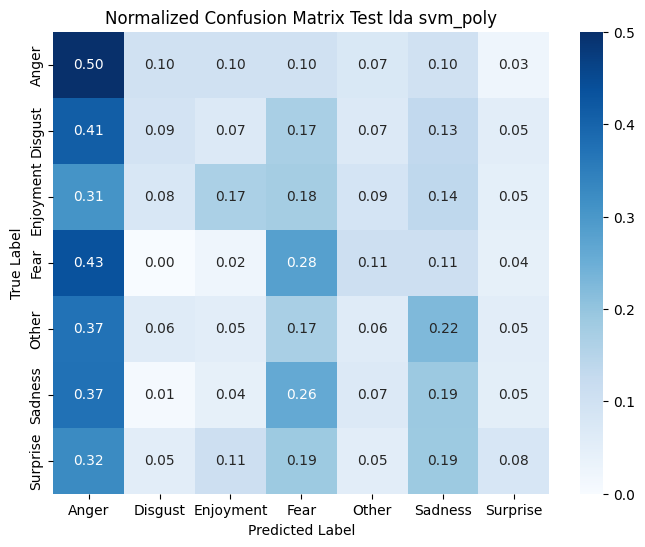

In [54]:
# SVM - poly - LDA (8:2)
model_lda_82_svm_poly, train_lda_82_svm_poly, valid_lda_82_svm_poly, test_lda_82_svm_poly, pred_lda_82_svm_poly = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly = train_lda_82_svm_poly[1], valid_lda_82_svm_poly[1], test_lda_82_svm_poly[1]
y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly = pred_lda_82_svm_poly

pipeline_evaluation(
    y_train_lda_82_svm_poly, y_valid_lda_82_svm_poly, y_test_lda_82_svm_poly,
    y_pred_train_lda_82_svm_poly, y_pred_valid_lda_82_svm_poly, y_pred_test_lda_82_svm_poly,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.9936270435023552
Recall: 0.9936270435023552
Precision: 0.9938725633562235
F1-score: 0.9936804676721431

--- valid --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.3909191583610188
Recall: 0.3909191583610188
Precision: 0.30698104805936693
F1-score: 0.2281951151675164

--- test --- 8:2 --- svm_rbf --- lda ---
Accuracy: 0.2761627906976744
Recall: 0.2761627906976744
Precision: 0.07740621286708538
F1-score: 0.12091962557344012


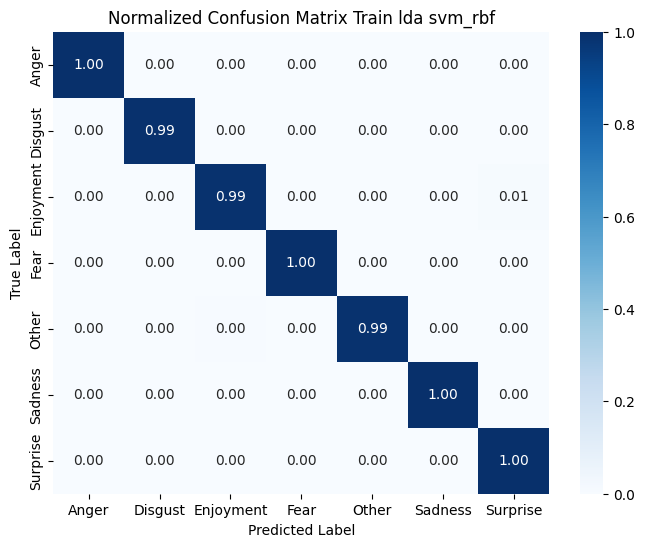

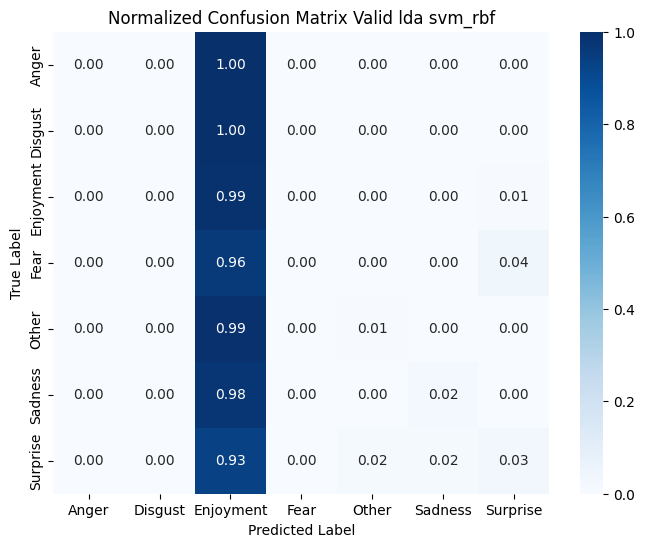

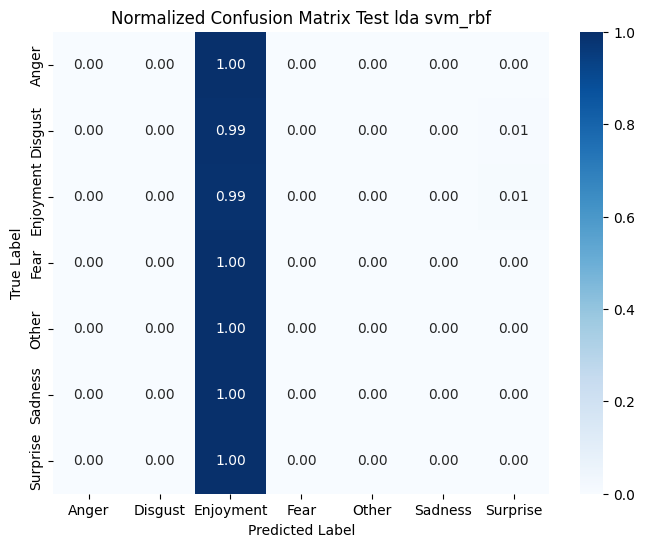

In [55]:
# SVM - rbf - LDA (8:2)
model_lda_82_svm_rbf, train_lda_82_svm_rbf, valid_lda_82_svm_rbf, test_lda_82_svm_rbf, pred_lda_82_svm_rbf = pipeline_modeling(
    X_train_lda_82, X_valid_lda_82, X_test_lda_82,
    y_train_lda_82, y_valid_lda_82, y_test_lda_82,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf = train_lda_82_svm_rbf[1], valid_lda_82_svm_rbf[1], test_lda_82_svm_rbf[1]
y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf = pred_lda_82_svm_rbf

pipeline_evaluation(
    y_train_lda_82_svm_rbf, y_valid_lda_82_svm_rbf, y_test_lda_82_svm_rbf,
    y_pred_train_lda_82_svm_rbf, y_pred_valid_lda_82_svm_rbf, y_pred_test_lda_82_svm_rbf,
    train_size=8, valid_size=2,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 7:3

## Logistic Regression

### Bộ dữ liệu không giảm chiều

In [56]:
X_train_73, X_valid_73, X_test_73, y_train_73, y_valid_73, y_test_73, tfidf_vec_73, disc_model_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="none"
)

TF-IDF hoàn thành!
Shape: (3158, 4893) (số câu x số từ vựng)
Số từ vựng: 4893
TF-IDF - Non-zero values: 36795


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.8293223559214693
Recall: 0.8293223559214693
Precision: 0.844748891549559
F1-score: 0.8292673385200028

--- valid --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.5243722304283605
Recall: 0.5243722304283605
Precision: 0.548064065506793
F1-score: 0.5311124308730918

--- test --- 7:3 --- logistic_regression --- none ---
Accuracy: 0.36773255813953487
Recall: 0.36773255813953487
Precision: 0.443252261216161
F1-score: 0.3869690876047848


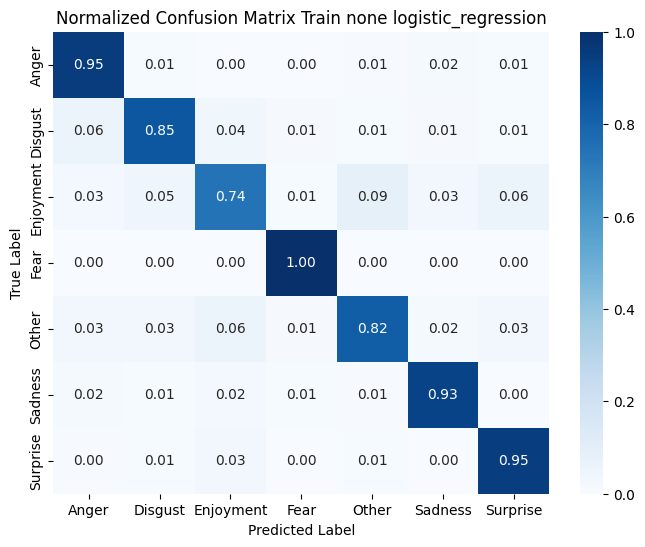

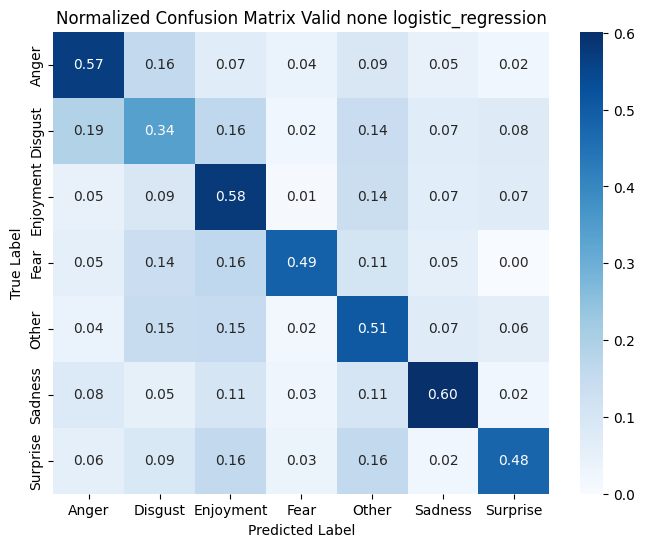

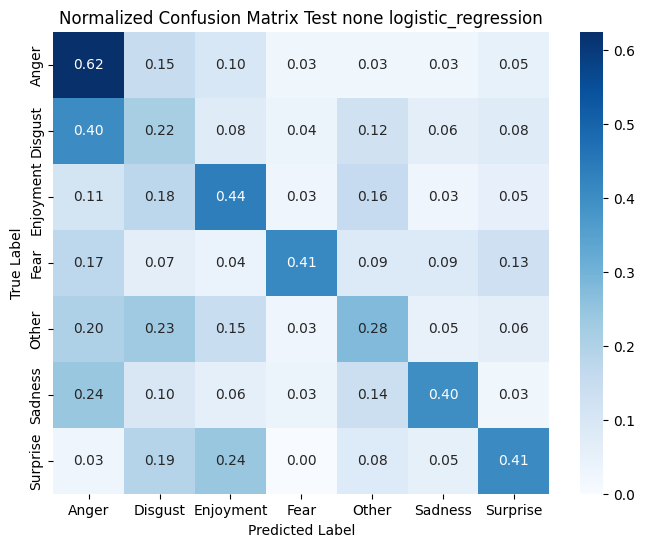

In [57]:
model_73, train_73, valid_73, test_73, pred_73 = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_73, y_pred_valid_73, y_pred_test_73 = pred_73

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73, y_pred_valid_73, y_pred_test_73,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (3158, 4893) (số câu x số từ vựng)
Số từ vựng: 4893
TF-IDF - Non-zero values: 36795


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.7891070297656745
Recall: 0.7891070297656745
Precision: 0.8101354532100162
F1-score: 0.7896208056658679

--- valid --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.5206794682422452
Recall: 0.5206794682422452
Precision: 0.5449246263814266
F1-score: 0.5272859803806966

--- test --- 7:3 --- logistic_regression --- pca ---
Accuracy: 0.373546511627907
Recall: 0.373546511627907
Precision: 0.4589660538376712
F1-score: 0.39575337718892173


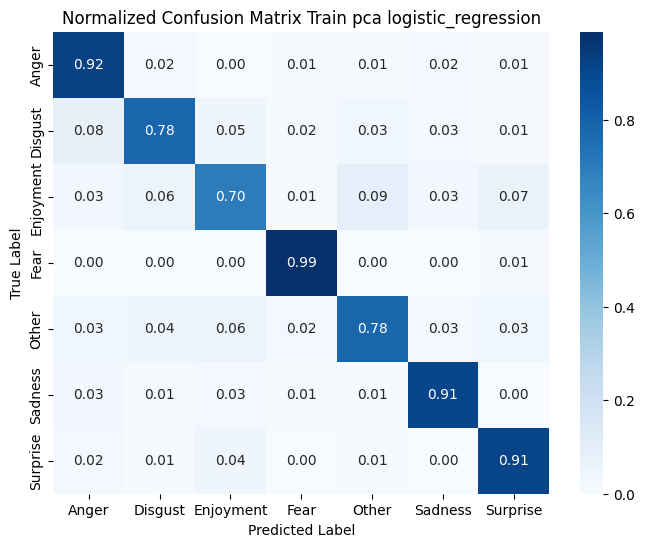

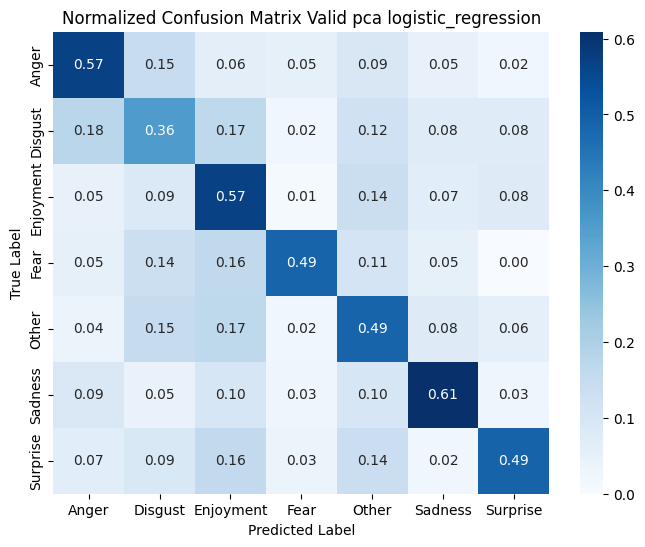

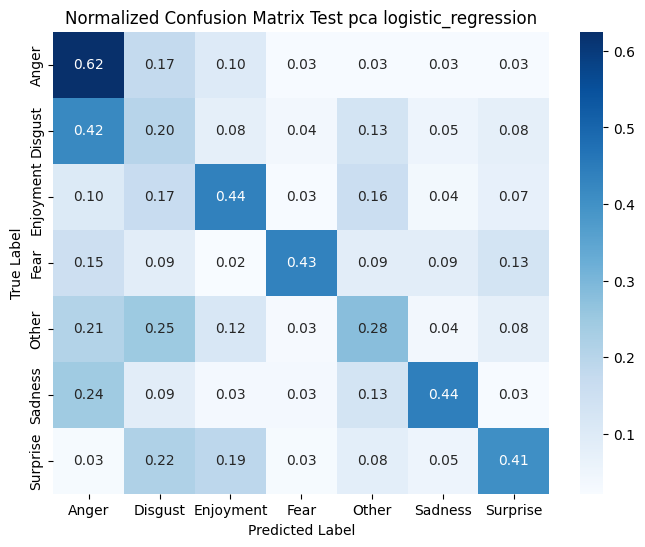

In [58]:
X_train_pca_73, X_valid_pca_73, X_test_pca_73, y_train_pca_73, y_valid_pca_73, y_test_pca_73, tfidf_vec_pca_73, disc_model_pca_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="pca"
)

model_pca_73, train_pca_73, valid_pca_73, test_pca_73, pred_pca_73 = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73 = pred_pca_73

pipeline_evaluation(
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    y_pred_train_pca_73, y_pred_valid_pca_73, y_pred_test_pca_73,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (3158, 4893) (số câu x số từ vựng)
Số từ vựng: 4893
TF-IDF - Non-zero values: 36795


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.9949335022165928
Recall: 0.9949335022165928
Precision: 0.9951103605188469
F1-score: 0.994972139001513

--- valid --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.35450516986706054
Recall: 0.35450516986706054
Precision: 0.3868222731692101
F1-score: 0.3624826840427807

--- test --- 7:3 --- logistic_regression --- lda ---
Accuracy: 0.25726744186046513
Recall: 0.25726744186046513
Precision: 0.28114555792769325
F1-score: 0.25475418960995805


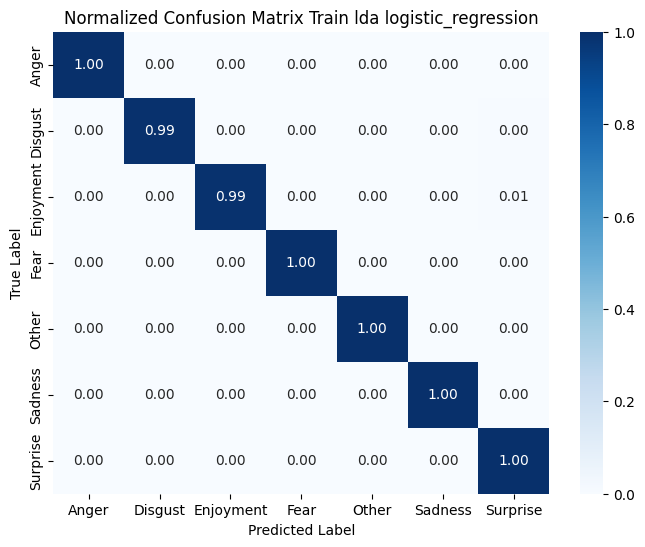

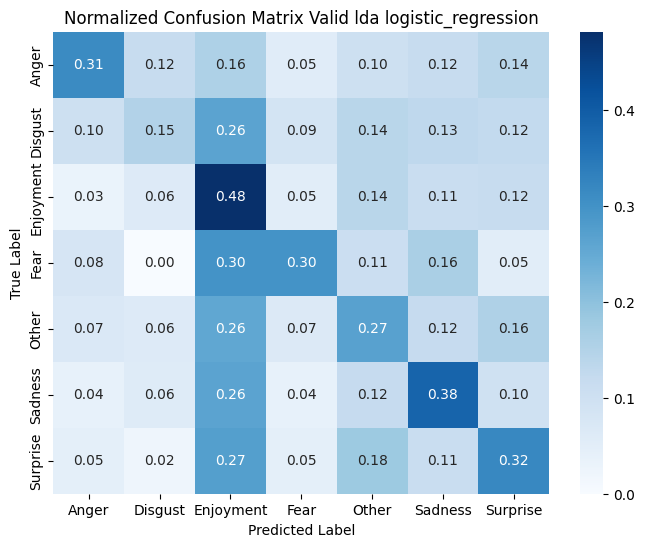

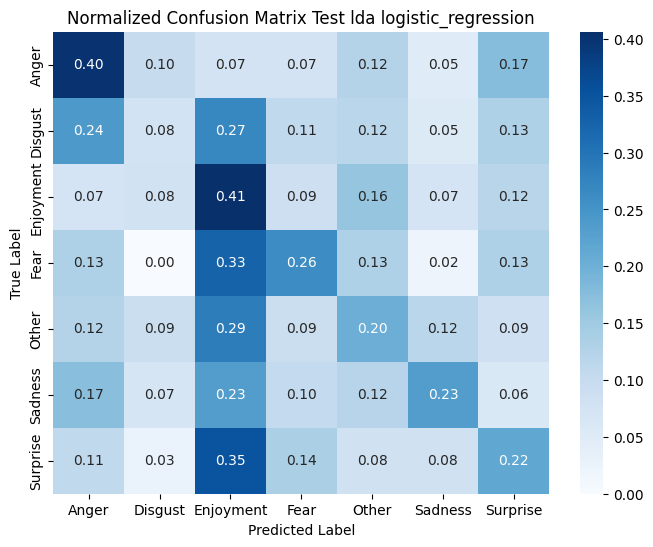

In [59]:
X_train_lda_73, X_valid_lda_73, X_test_lda_73, y_train_lda_73, y_valid_lda_73, y_test_lda_73, tfidf_vec_lda_73, disc_model_lda_73 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=7,
    valid_size=3,
    discriminant="lda"
)

model_lda_73, train_lda_73, valid_lda_73, test_lda_73, pred_lda_73 = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73 = pred_lda_73

pipeline_evaluation(
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    y_pred_train_lda_73, y_pred_valid_lda_73, y_pred_test_lda_73,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.467384420519316
Recall: 0.467384420519316
Precision: 0.5518744032653051
F1-score: 0.36850263992215987

--- valid --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.44977843426883307
Recall: 0.44977843426883307
Precision: 0.5239600496979346
F1-score: 0.3475658282940648

--- test --- 7:3 --- knn_euclidean --- none ---
Accuracy: 0.29505813953488375
Recall: 0.29505813953488375
Precision: 0.4259625185089931
F1-score: 0.1714030373156498


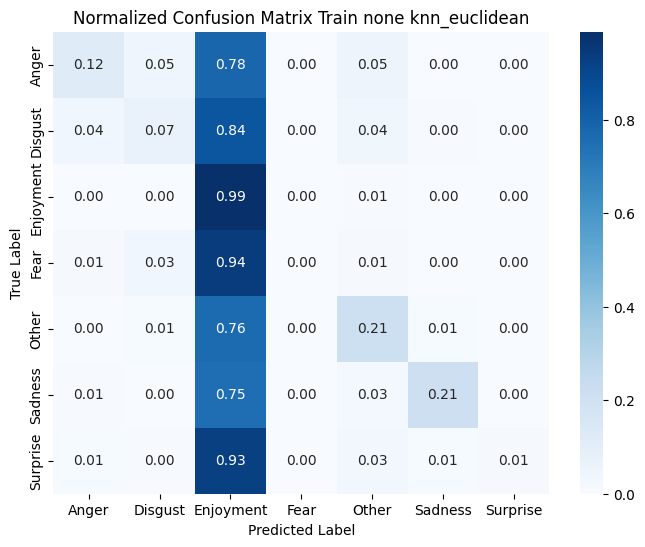

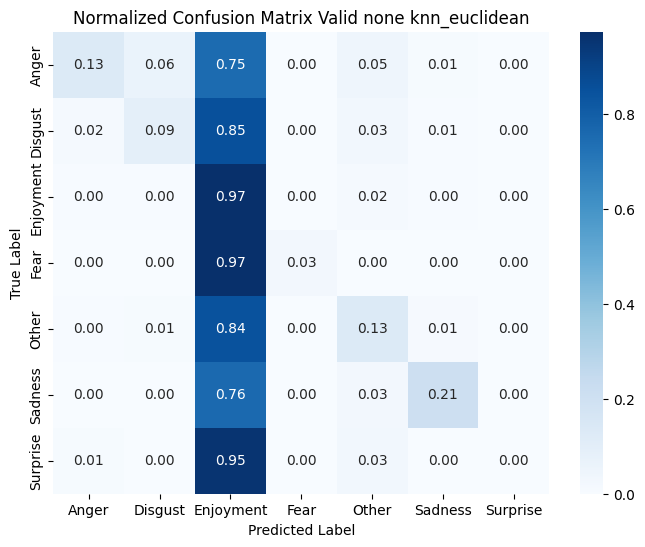

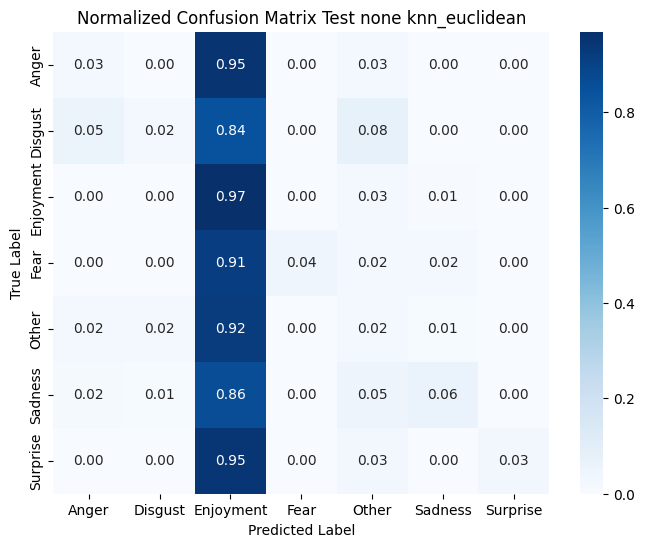

In [60]:
# KNN - euclidean - None (7:3)
model_73_knn_euclidean, train_73_knn_euclidean, valid_73_knn_euclidean, test_73_knn_euclidean, pred_73_knn_euclidean = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn",
    metric="euclidean"
)

y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean = pred_73_knn_euclidean

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn_euclidean, y_pred_valid_73_knn_euclidean, y_pred_test_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn --- none ---
Accuracy: 0.4901836605446485
Recall: 0.4901836605446485
Precision: 0.5288613188083684
F1-score: 0.4045427888659694

--- valid --- 7:3 --- knn --- none ---
Accuracy: 0.4667651403249631
Recall: 0.4667651403249631
Precision: 0.4975495821427896
F1-score: 0.3828274490185908

--- test --- 7:3 --- knn --- none ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.3939939001899563
F1-score: 0.19108636951174754


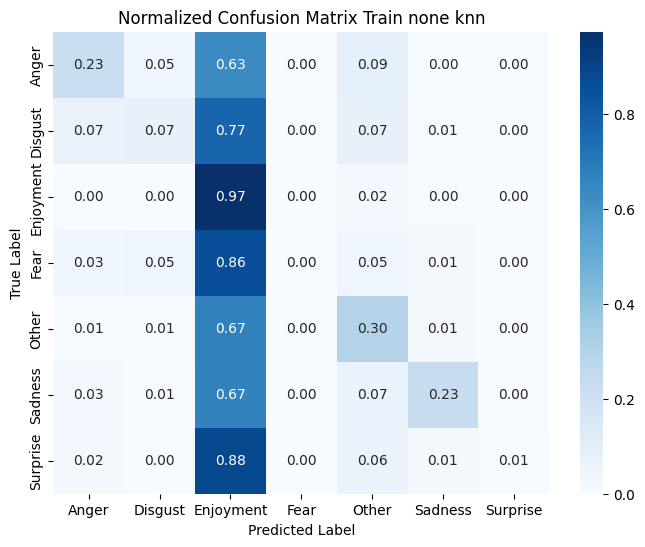

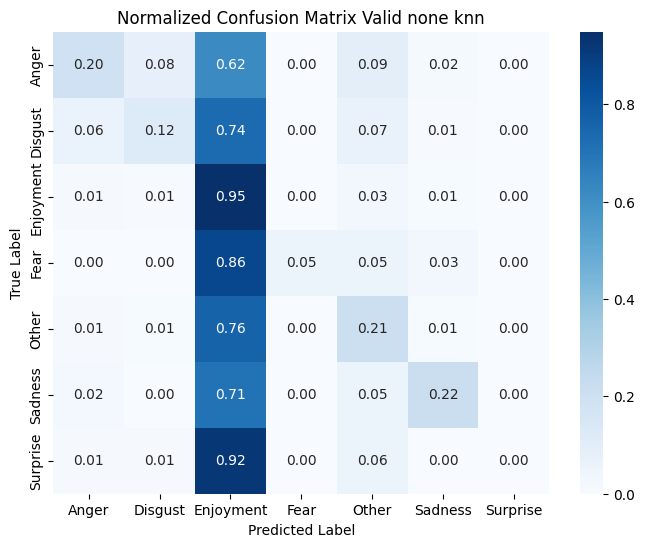

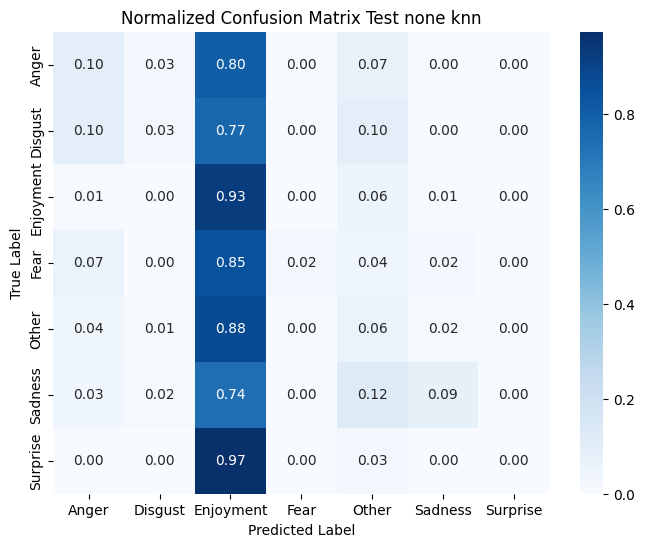

In [61]:
# KNN - cosine - none
model_73_knn, train_73_knn, valid_73_knn, test_73_knn, pred_73_knn = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="knn"
)

y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn = pred_73_knn

pipeline_evaluation(
    y_train_73, y_valid_73, y_test_73,
    y_pred_train_73_knn, y_pred_valid_73_knn, y_pred_test_73_knn,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.473717542748575
Recall: 0.473717542748575
Precision: 0.5647251393522934
F1-score: 0.37921190160882395

--- valid --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.4608567208271787
Recall: 0.4608567208271787
Precision: 0.4977388139041301
F1-score: 0.36824858824320844

--- test --- 7:3 --- knn_euclidean --- pca ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.35491288492706646
F1-score: 0.17575166113888543


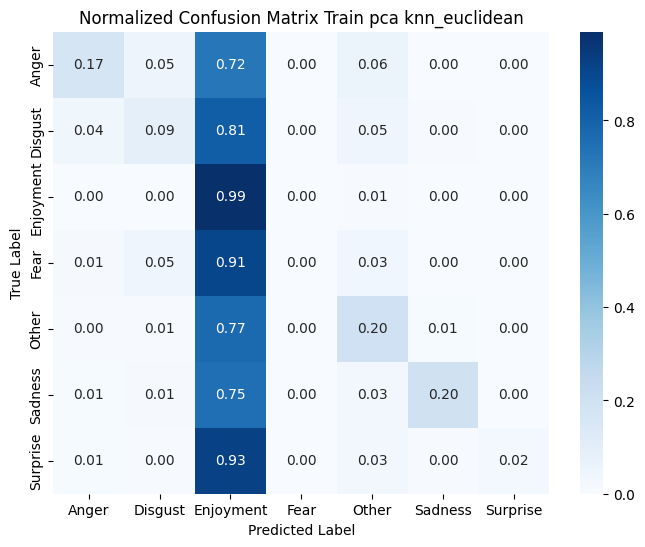

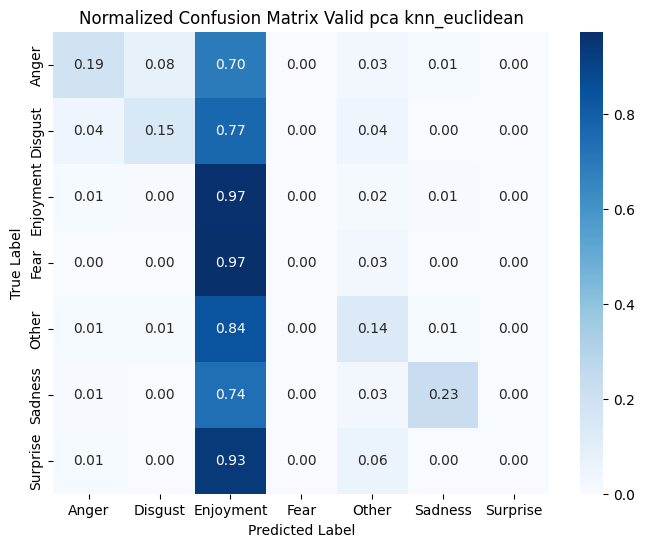

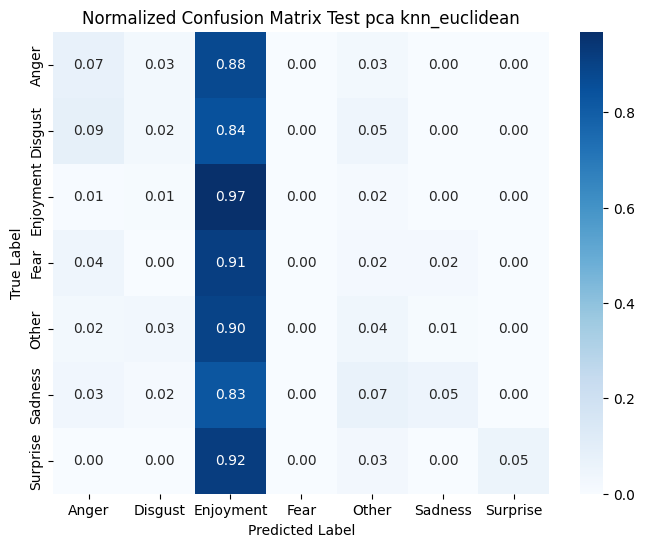

In [62]:
# KNN - euclidean - PCA (7:3)
model_pca_73_knn_euclidean, train_pca_73_knn_euclidean, valid_pca_73_knn_euclidean, test_pca_73_knn_euclidean, pred_pca_73_knn_euclidean = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean = train_pca_73_knn_euclidean[1], valid_pca_73_knn_euclidean[1], test_pca_73_knn_euclidean[1]
y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean = pred_pca_73_knn_euclidean

pipeline_evaluation(
    y_train_pca_73_knn_euclidean, y_valid_pca_73_knn_euclidean, y_test_pca_73_knn_euclidean,
    y_pred_train_pca_73_knn_euclidean, y_pred_valid_pca_73_knn_euclidean, y_pred_test_pca_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 7:3 --- knn --- pca ---
Accuracy: 0.48986700443318554
Recall: 0.48986700443318554
Precision: 0.5226686970289475
F1-score: 0.4045238925250087

--- valid --- 7:3 --- knn --- pca ---
Accuracy: 0.46971935007385524
Recall: 0.46971935007385524
Precision: 0.4937996323125041
F1-score: 0.3859246685858178

--- test --- 7:3 --- knn --- pca ---
Accuracy: 0.3066860465116279
Recall: 0.3066860465116279
Precision: 0.4150620825070599
F1-score: 0.20113745532071026


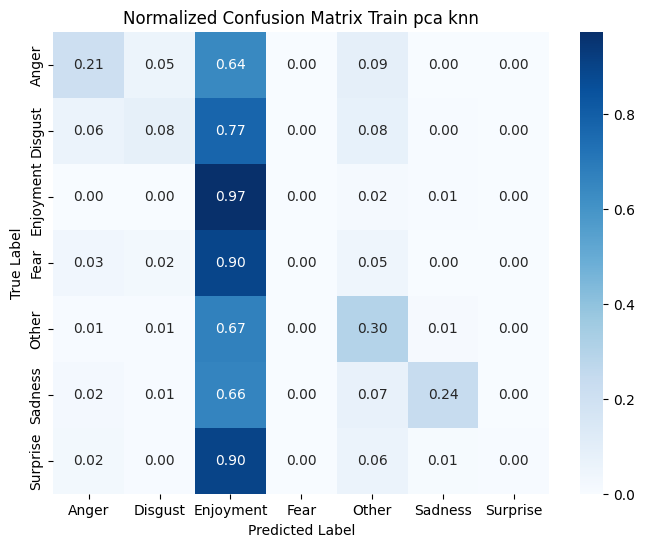

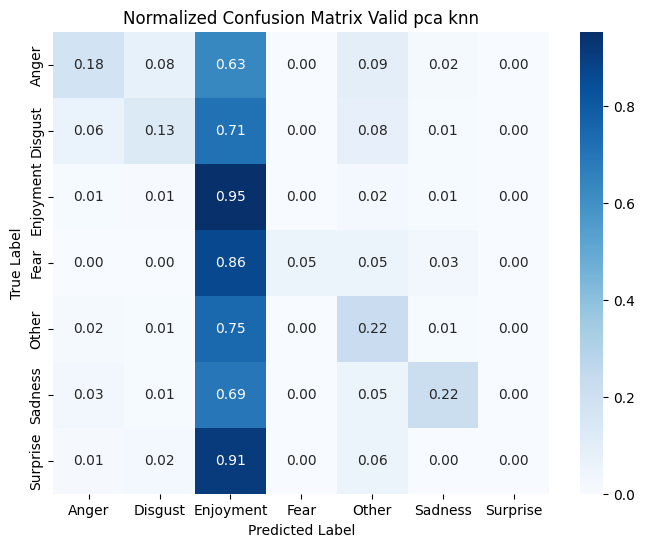

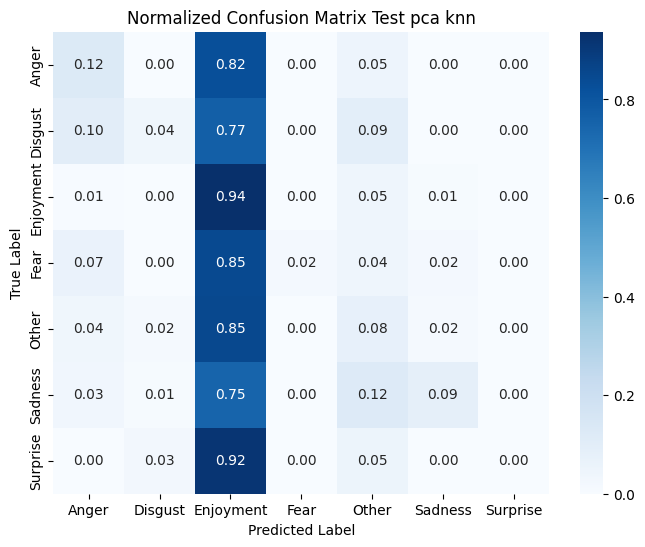

In [63]:
model_pca_73_knn, train_pca_73_knn, valid_pca_73_knn, test_pca_73_knn, pred_pca_73_knn = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="knn",
    max_iter=1000
)

y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn = train_pca_73_knn[1], valid_pca_73_knn[1], test_pca_73_knn[1]
y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn = pred_pca_73_knn

pipeline_evaluation(
    y_train_pca_73_knn, y_valid_pca_73_knn, y_test_pca_73_knn,
    y_pred_train_pca_73_knn, y_pred_valid_pca_73_knn, y_pred_test_pca_73_knn,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.9943001899936669
Recall: 0.9943001899936669
Precision: 0.9943327310018478
F1-score: 0.9942992175128781

--- valid --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.34859675036927623
Recall: 0.34859675036927623
Precision: 0.38065514841159614
F1-score: 0.35741752228757645

--- test --- 7:3 --- knn_euclidean --- lda ---
Accuracy: 0.251453488372093
Recall: 0.251453488372093
Precision: 0.2691137934347356
F1-score: 0.24872948063326064


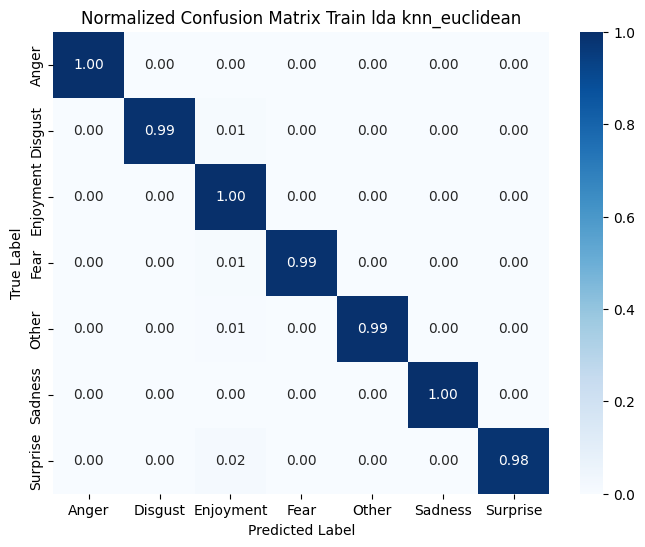

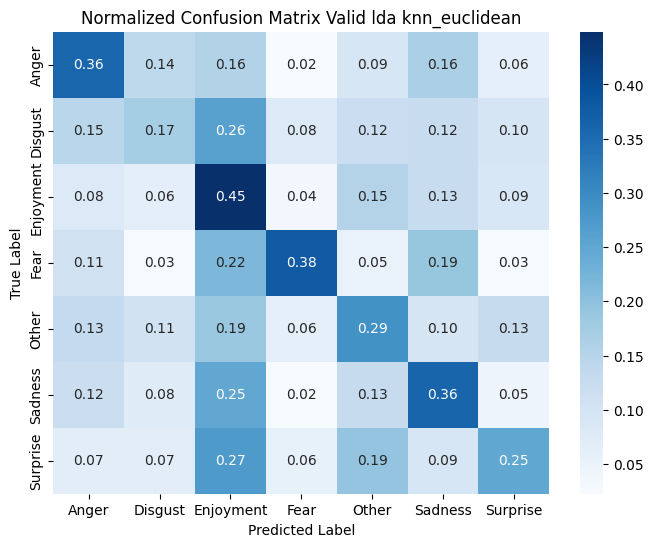

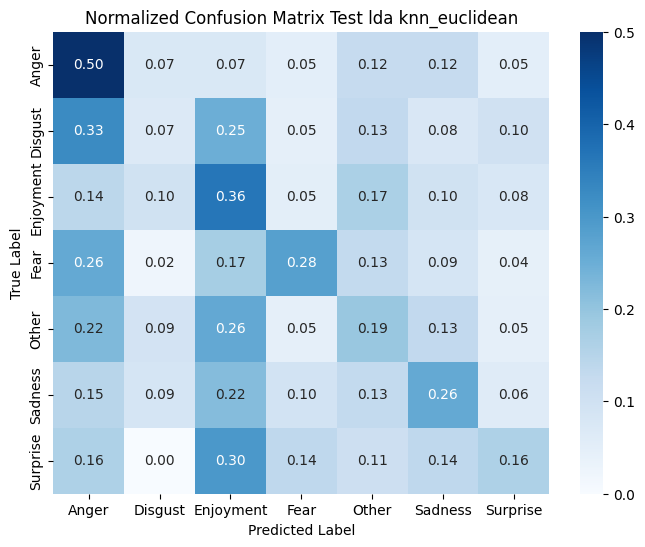

In [64]:
# KNN - euclidean - LDA (7:3)
model_lda_73_knn_euclidean, train_lda_73_knn_euclidean, valid_lda_73_knn_euclidean, test_lda_73_knn_euclidean, pred_lda_73_knn_euclidean = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean = train_lda_73_knn_euclidean[1], valid_lda_73_knn_euclidean[1], test_lda_73_knn_euclidean[1]
y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean = pred_lda_73_knn_euclidean

pipeline_evaluation(
    y_train_lda_73_knn_euclidean, y_valid_lda_73_knn_euclidean, y_test_lda_73_knn_euclidean,
    y_pred_train_lda_73_knn_euclidean, y_pred_valid_lda_73_knn_euclidean, y_pred_test_lda_73_knn_euclidean,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 7:3 --- knn --- lda ---
Accuracy: 0.9911336288790373
Recall: 0.9911336288790373
Precision: 0.9914305365378455
F1-score: 0.9911893643009804

--- valid --- 7:3 --- knn --- lda ---
Accuracy: 0.30945347119645494
Recall: 0.30945347119645494
Precision: 0.3791718375000792
F1-score: 0.3215275512075614

--- test --- 7:3 --- knn --- lda ---
Accuracy: 0.23837209302325582
Recall: 0.23837209302325582
Precision: 0.27986816444304086
F1-score: 0.2387688410379771


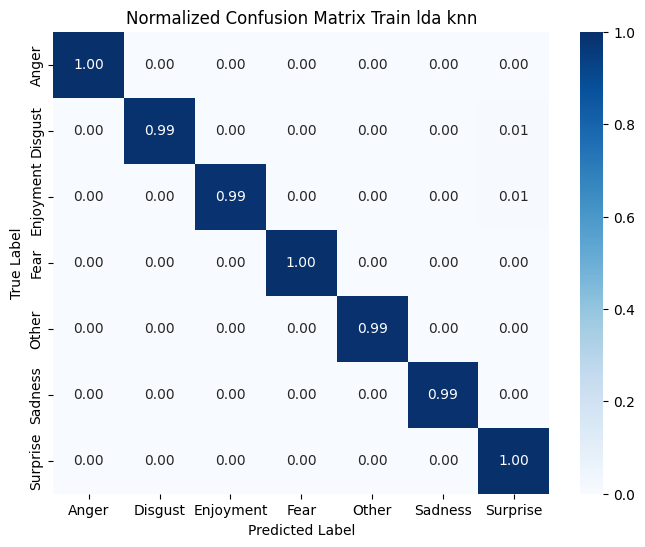

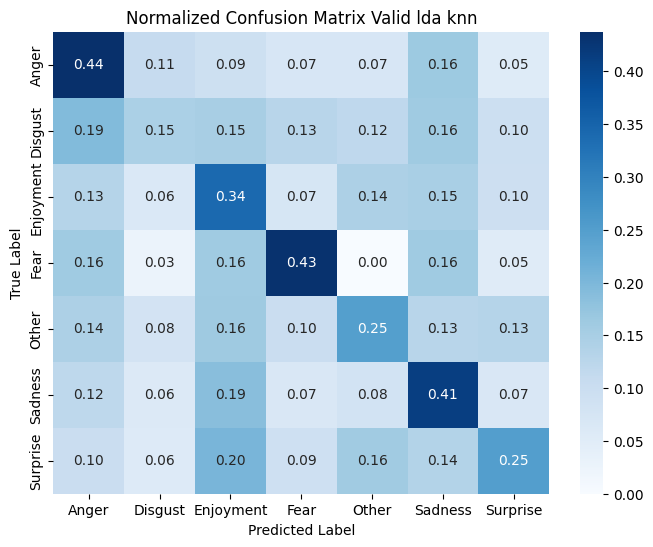

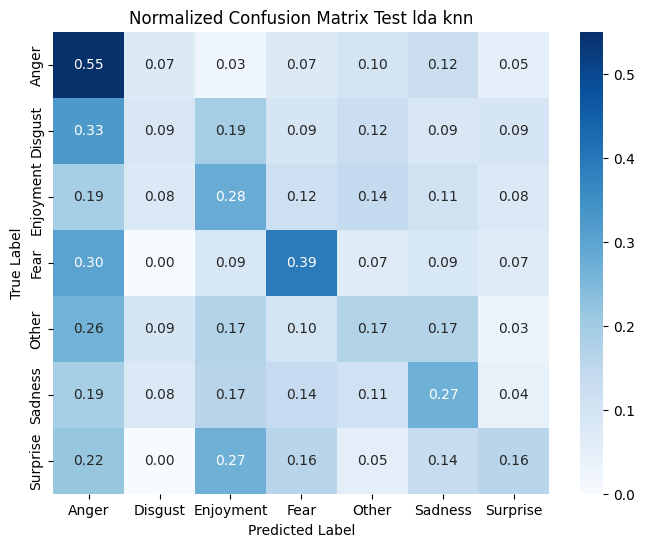

In [65]:

model_lda_73_knn, train_lda_73_knn, valid_lda_73_knn, test_lda_73_knn, pred_lda_73_knn = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="knn",
    max_iter=1000
)

y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn = train_lda_73_knn[1], valid_lda_73_knn[1], test_lda_73_knn[1]
y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn = pred_lda_73_knn

pipeline_evaluation(
    y_train_lda_73_knn, y_valid_lda_73_knn, y_test_lda_73_knn,
    y_pred_train_lda_73_knn, y_pred_valid_lda_73_knn, y_pred_test_lda_73_knn,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 7:3 --- svm_linear --- none ---
Accuracy: 0.9426852438252058
Recall: 0.9426852438252058
Precision: 0.9445377622215384
F1-score: 0.9428126319997232

--- valid --- 7:3 --- svm_linear --- none ---
Accuracy: 0.5420974889217134
Recall: 0.5420974889217134
Precision: 0.5414081532286147
F1-score: 0.5408698387049323

--- test --- 7:3 --- svm_linear --- none ---
Accuracy: 0.38953488372093026
Recall: 0.38953488372093026
Precision: 0.4292635388395605
F1-score: 0.39500957781667195


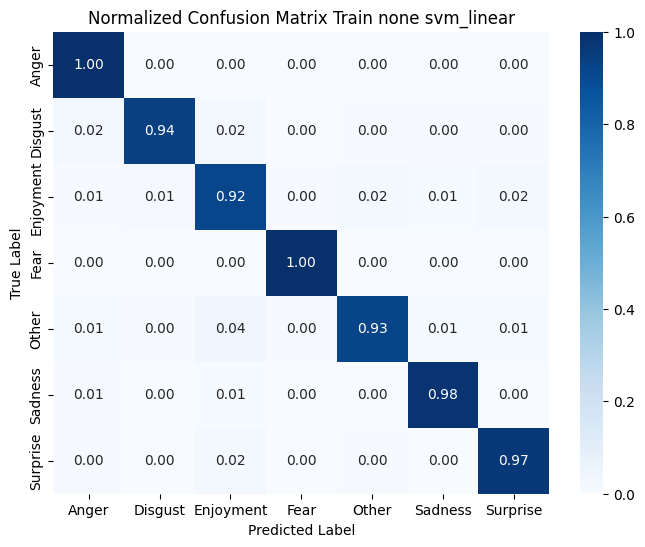

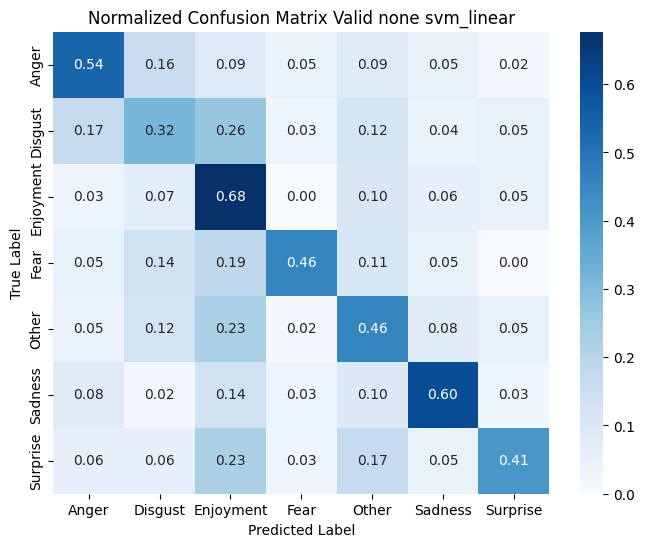

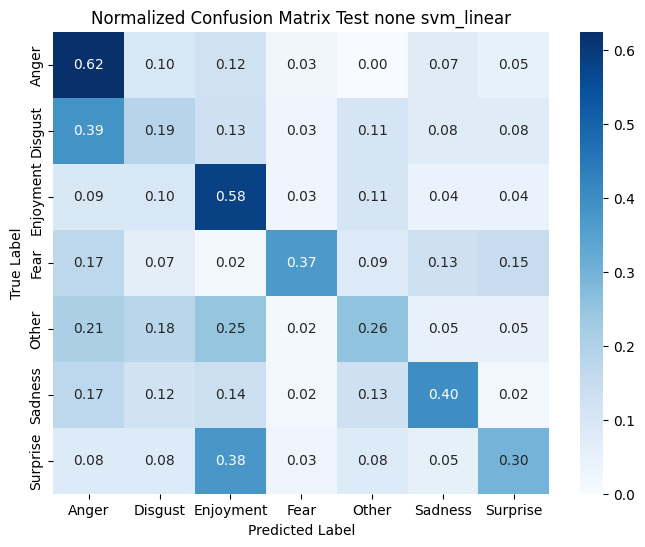

In [66]:
# SVM - linear - None (7:3)
model_73_svm_linear, train_73_svm_linear, valid_73_svm_linear, test_73_svm_linear, pred_73_svm_linear = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear = train_73_svm_linear[1], valid_73_svm_linear[1], test_73_svm_linear[1]
y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear = pred_73_svm_linear

pipeline_evaluation(
    y_train_73_svm_linear, y_valid_73_svm_linear, y_test_73_svm_linear,
    y_pred_train_73_svm_linear, y_pred_valid_73_svm_linear, y_pred_test_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- none ---
Accuracy: 0.9281190626979101
Recall: 0.9281190626979101
Precision: 0.9404124756007611
F1-score: 0.9288318857964735

--- valid --- 7:3 --- svm_poly --- none ---
Accuracy: 0.3951255539143279
Recall: 0.3951255539143279
Precision: 0.5466283167480744
F1-score: 0.3857000810986698

--- test --- 7:3 --- svm_poly --- none ---
Accuracy: 0.2703488372093023
Recall: 0.2703488372093023
Precision: 0.4655584698947117
F1-score: 0.23674207777381415


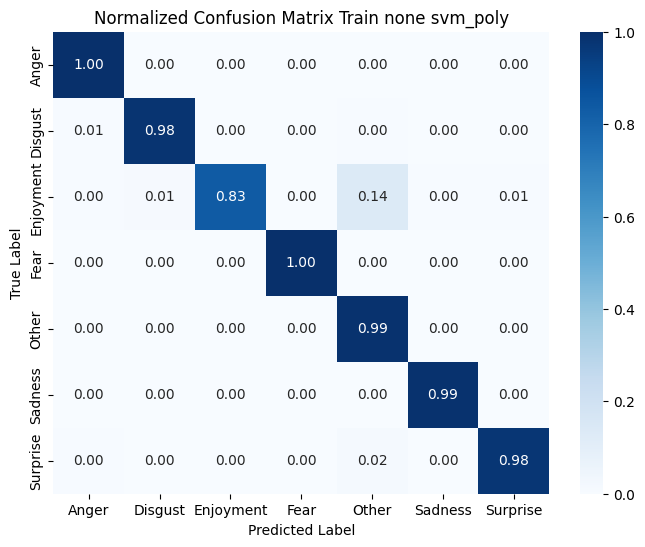

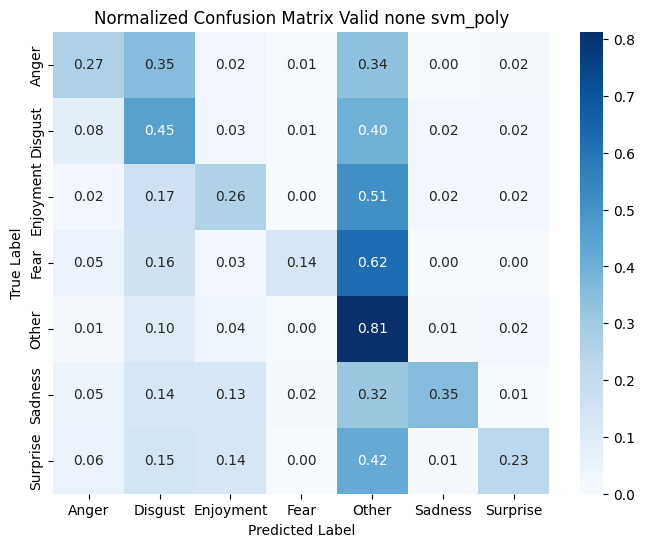

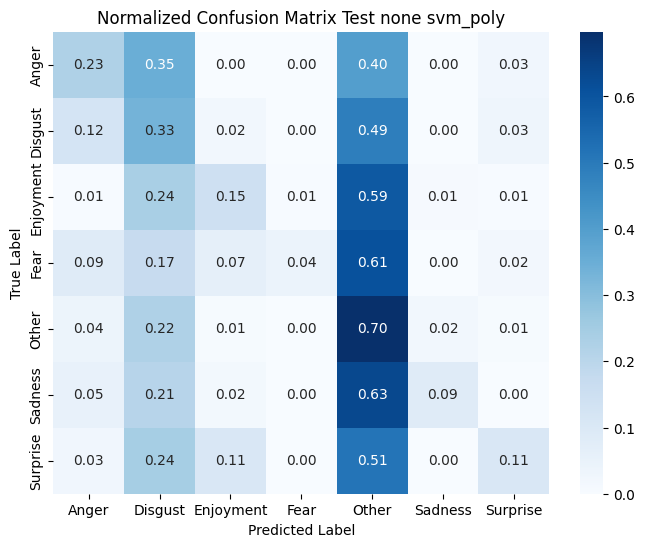

In [67]:
# SVM - poly - None (7:3)
model_73_svm_poly, train_73_svm_poly, valid_73_svm_poly, test_73_svm_poly, pred_73_svm_poly = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly = train_73_svm_poly[1], valid_73_svm_poly[1], test_73_svm_poly[1]
y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly = pred_73_svm_poly

pipeline_evaluation(
    y_train_73_svm_poly, y_valid_73_svm_poly, y_test_73_svm_poly,
    y_pred_train_73_svm_poly, y_pred_valid_73_svm_poly, y_pred_test_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.88948701709943
Recall: 0.88948701709943
Precision: 0.9121655213507119
F1-score: 0.8889925528104669

--- valid --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.45790251107828656
Recall: 0.45790251107828656
Precision: 0.5650834991302082
F1-score: 0.4606469042437939

--- test --- 7:3 --- svm_rbf --- none ---
Accuracy: 0.31976744186046513
Recall: 0.31976744186046513
Precision: 0.49377716727114707
F1-score: 0.32741562670448127


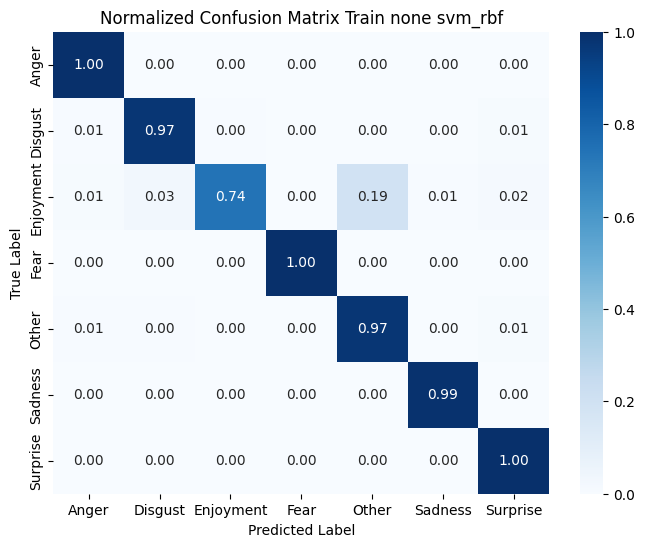

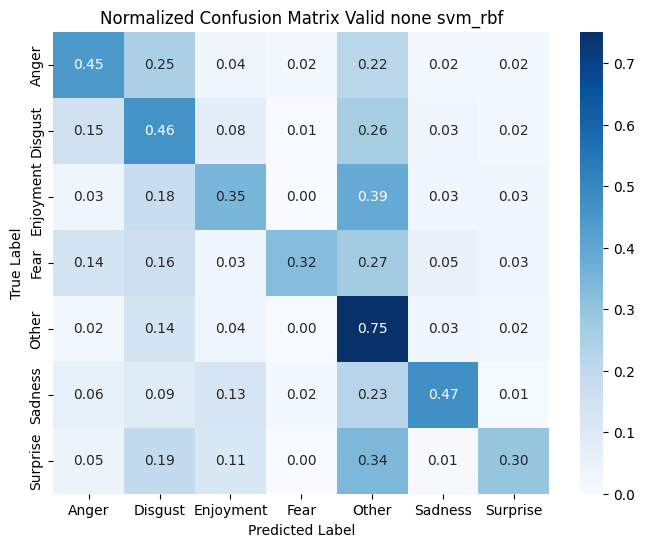

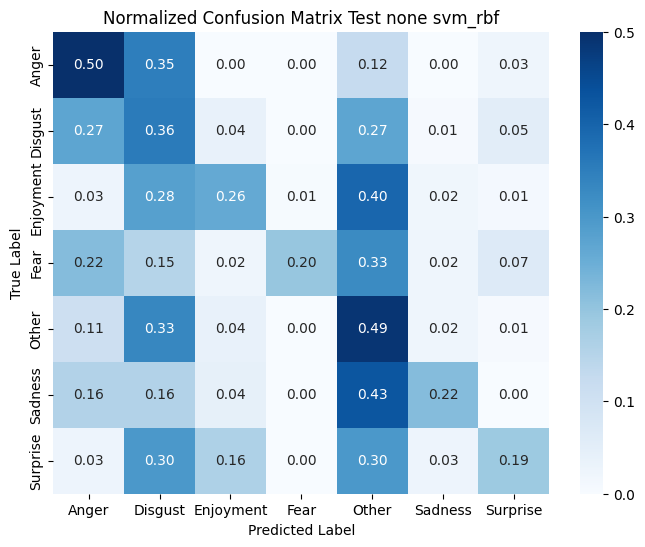

In [68]:
# SVM - rbf - None (7:3)
model_73_svm_rbf, train_73_svm_rbf, valid_73_svm_rbf, test_73_svm_rbf, pred_73_svm_rbf = pipeline_modeling(
    X_train_73, X_valid_73, X_test_73,
    y_train_73, y_valid_73, y_test_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf = train_73_svm_rbf[1], valid_73_svm_rbf[1], test_73_svm_rbf[1]
y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf = pred_73_svm_rbf

pipeline_evaluation(
    y_train_73_svm_rbf, y_valid_73_svm_rbf, y_test_73_svm_rbf,
    y_pred_train_73_svm_rbf, y_pred_valid_73_svm_rbf, y_pred_test_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu PCA

--- train --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.890120329322356
Recall: 0.890120329322356
Precision: 0.8942926773410225
F1-score: 0.8902868649288149

--- valid --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.5391432791728212
Recall: 0.5391432791728212
Precision: 0.5422864261576449
F1-score: 0.5392734981703539

--- test --- 7:3 --- svm_linear --- pca ---
Accuracy: 0.39098837209302323
Recall: 0.39098837209302323
Precision: 0.4284975484186809
F1-score: 0.3960589323796784


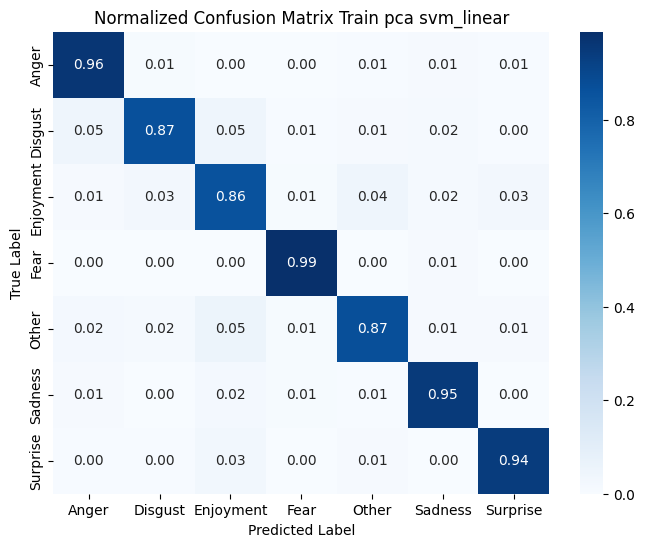

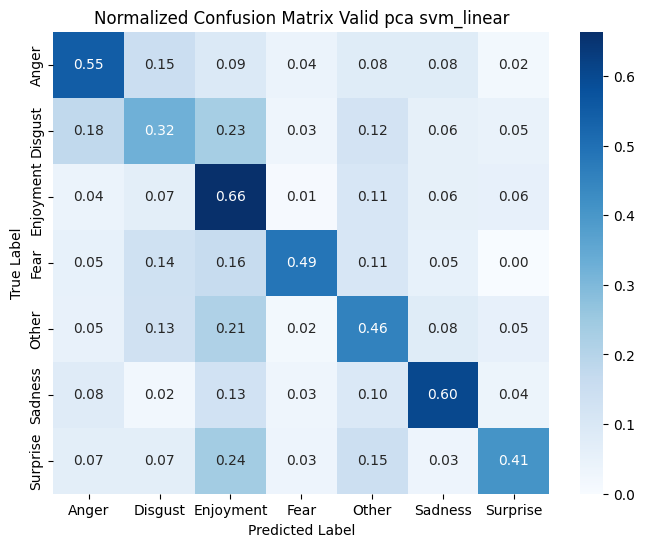

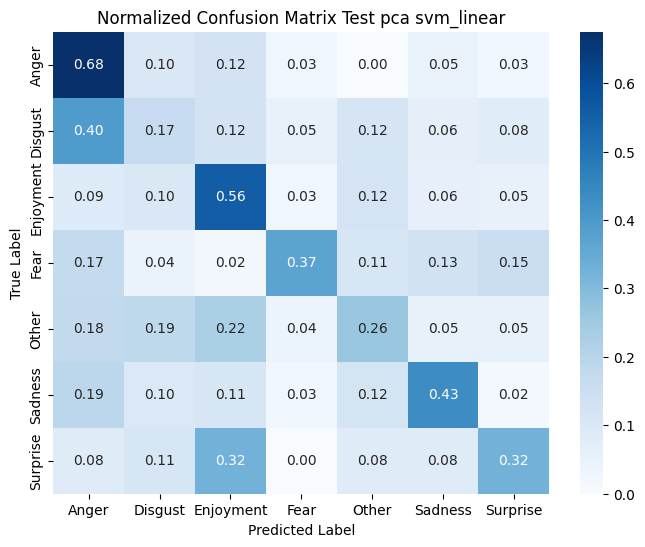

In [69]:
# SVM - linear - PCA (7:3)
model_pca_73_svm_linear, train_pca_73_svm_linear, valid_pca_73_svm_linear, test_pca_73_svm_linear, pred_pca_73_svm_linear = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear = train_pca_73_svm_linear[1], valid_pca_73_svm_linear[1], test_pca_73_svm_linear[1]
y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear = pred_pca_73_svm_linear

pipeline_evaluation(
    y_train_pca_73_svm_linear, y_valid_pca_73_svm_linear, y_test_pca_73_svm_linear,
    y_pred_train_pca_73_svm_linear, y_pred_valid_pca_73_svm_linear, y_pred_test_pca_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.9192526915769474
Recall: 0.9192526915769474
Precision: 0.9324196400663082
F1-score: 0.9198146526705467

--- valid --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.4121122599704579
Recall: 0.4121122599704579
Precision: 0.5664695727825059
F1-score: 0.40987444592232747

--- test --- 7:3 --- svm_poly --- pca ---
Accuracy: 0.2703488372093023
Recall: 0.2703488372093023
Precision: 0.46659079856363356
F1-score: 0.23703031393289


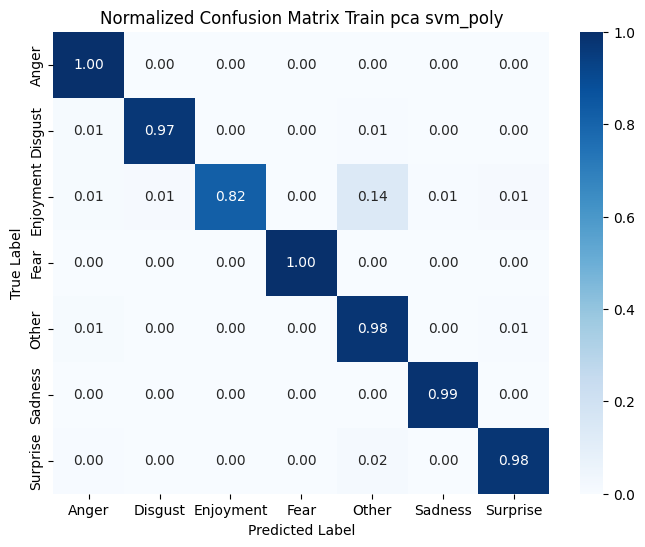

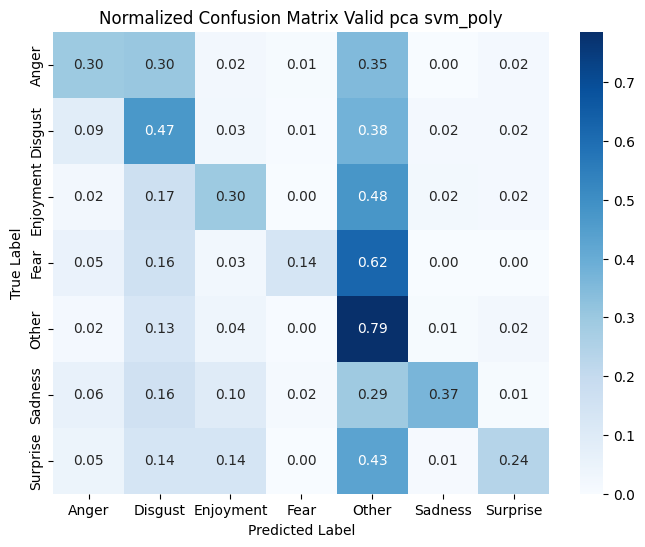

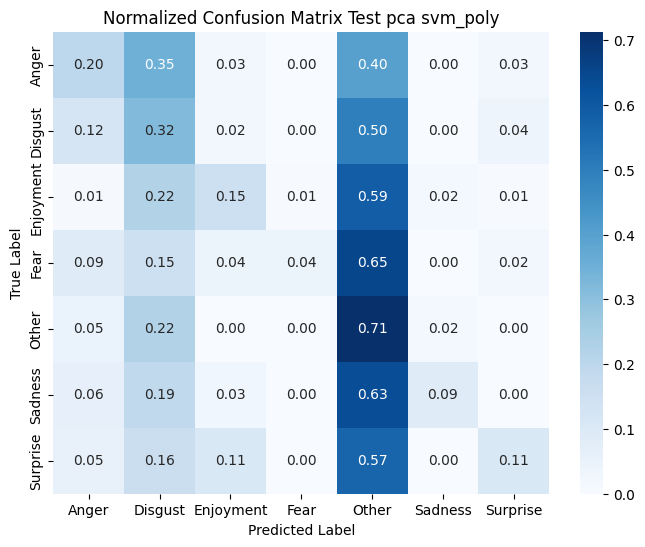

In [70]:
# SVM - poly - PCA (7:3)
model_pca_73_svm_poly, train_pca_73_svm_poly, valid_pca_73_svm_poly, test_pca_73_svm_poly, pred_pca_73_svm_poly = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly = train_pca_73_svm_poly[1], valid_pca_73_svm_poly[1], test_pca_73_svm_poly[1]
y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly = pred_pca_73_svm_poly

pipeline_evaluation(
    y_train_pca_73_svm_poly, y_valid_pca_73_svm_poly, y_test_pca_73_svm_poly,
    y_pred_train_pca_73_svm_poly, y_pred_valid_pca_73_svm_poly, y_pred_test_pca_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.856554781507283
Recall: 0.856554781507283
Precision: 0.8854742175228991
F1-score: 0.853553802268685

--- valid --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.45125553914327915
Recall: 0.45125553914327915
Precision: 0.5394101945850215
F1-score: 0.46584018744678485

--- test --- 7:3 --- svm_rbf --- pca ---
Accuracy: 0.32994186046511625
Recall: 0.32994186046511625
Precision: 0.4776529821969462
F1-score: 0.3500569067100439


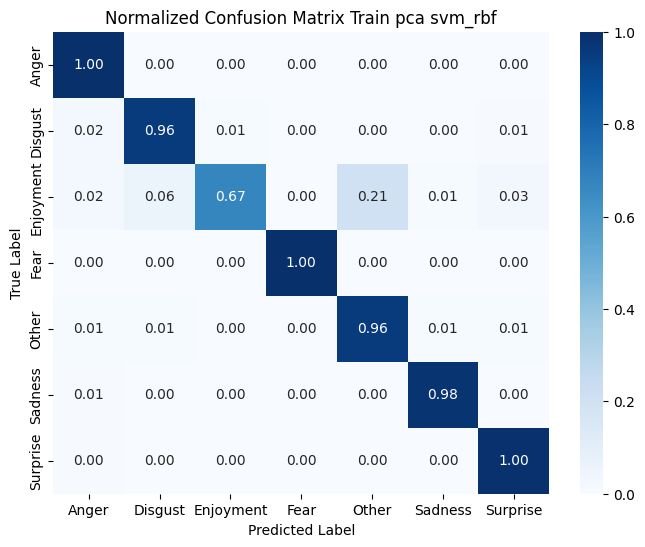

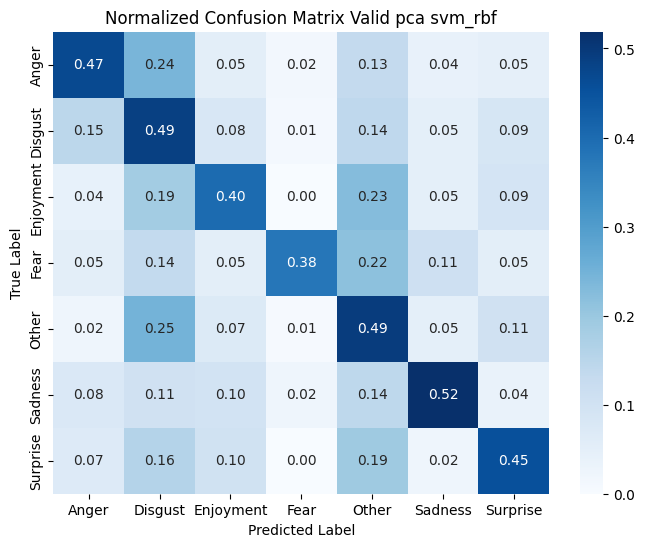

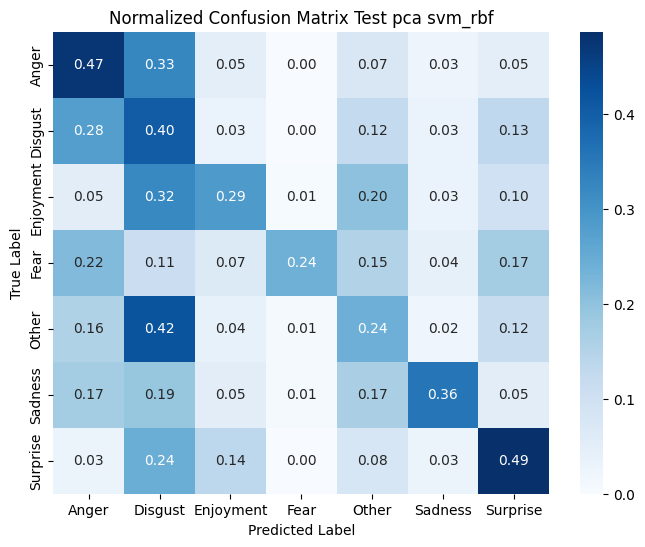

In [71]:
# SVM - rbf - PCA (7:3)
model_pca_73_svm_rbf, train_pca_73_svm_rbf, valid_pca_73_svm_rbf, test_pca_73_svm_rbf, pred_pca_73_svm_rbf = pipeline_modeling(
    X_train_pca_73, X_valid_pca_73, X_test_pca_73,
    y_train_pca_73, y_valid_pca_73, y_test_pca_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf = train_pca_73_svm_rbf[1], valid_pca_73_svm_rbf[1], test_pca_73_svm_rbf[1]
y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf = pred_pca_73_svm_rbf

pipeline_evaluation(
    y_train_pca_73_svm_rbf, y_valid_pca_73_svm_rbf, y_test_pca_73_svm_rbf,
    y_pred_train_pca_73_svm_rbf, y_pred_valid_pca_73_svm_rbf, y_pred_test_pca_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

## Bộ dữ liệu LDA

--- train --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.993666877770741
Recall: 0.993666877770741
Precision: 0.9938846272344682
F1-score: 0.9937133709459431

--- valid --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.36484490398818314
Recall: 0.36484490398818314
Precision: 0.3849427058224002
F1-score: 0.3676680710729691

--- test --- 7:3 --- svm_linear --- lda ---
Accuracy: 0.25726744186046513
Recall: 0.25726744186046513
Precision: 0.272436328279274
F1-score: 0.2456636015995387


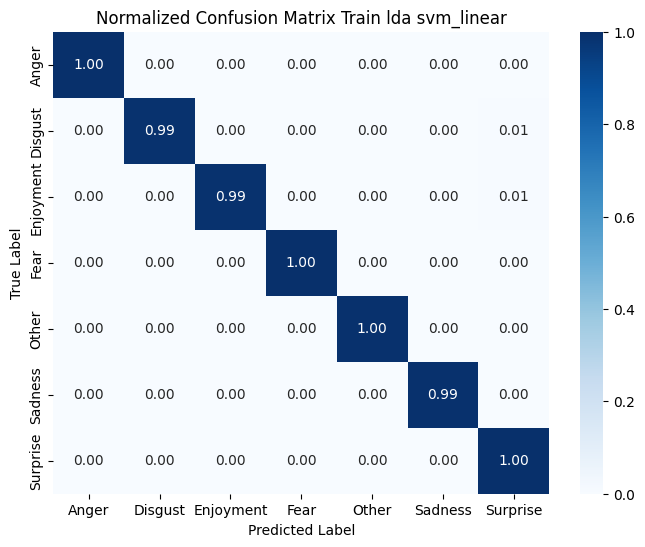

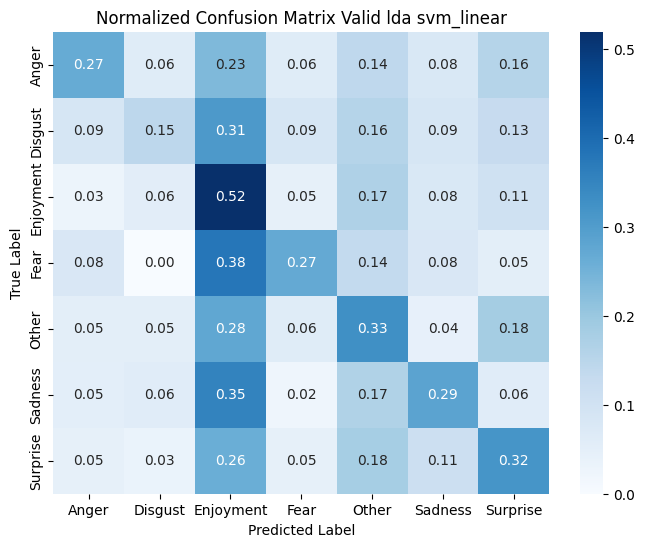

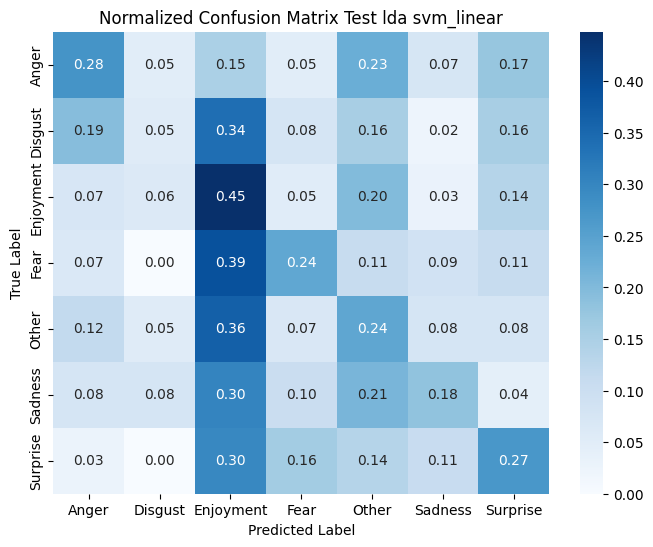

In [72]:
# SVM - linear - LDA (7:3)
model_lda_73_svm_linear, train_lda_73_svm_linear, valid_lda_73_svm_linear, test_lda_73_svm_linear, pred_lda_73_svm_linear = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear = train_lda_73_svm_linear[1], valid_lda_73_svm_linear[1], test_lda_73_svm_linear[1]
y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear = pred_lda_73_svm_linear

pipeline_evaluation(
    y_train_lda_73_svm_linear, y_valid_lda_73_svm_linear, y_test_lda_73_svm_linear,
    y_pred_train_lda_73_svm_linear, y_pred_valid_lda_73_svm_linear, y_pred_test_lda_73_svm_linear,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.9924002533248891
Recall: 0.9924002533248891
Precision: 0.9924888778585298
F1-score: 0.9923984599912071

--- valid --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.2429837518463811
Recall: 0.2429837518463811
Precision: 0.36801684033041904
F1-score: 0.26103328995238123

--- test --- 7:3 --- svm_poly --- lda ---
Accuracy: 0.17877906976744187
Recall: 0.17877906976744187
Precision: 0.23861779509621522
F1-score: 0.17700036341150013


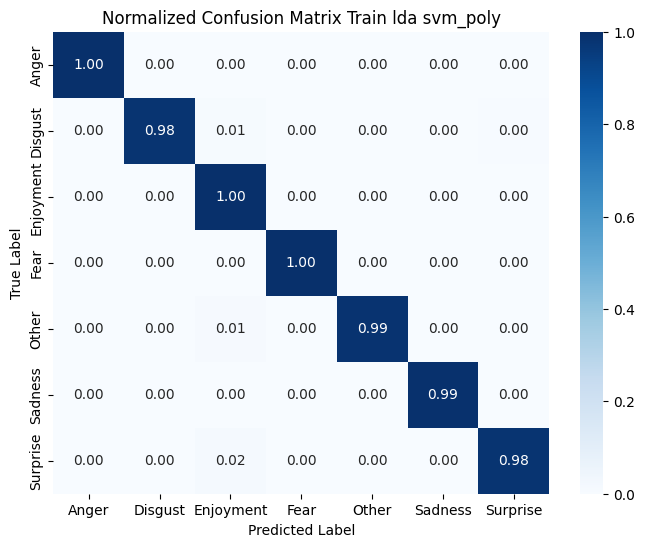

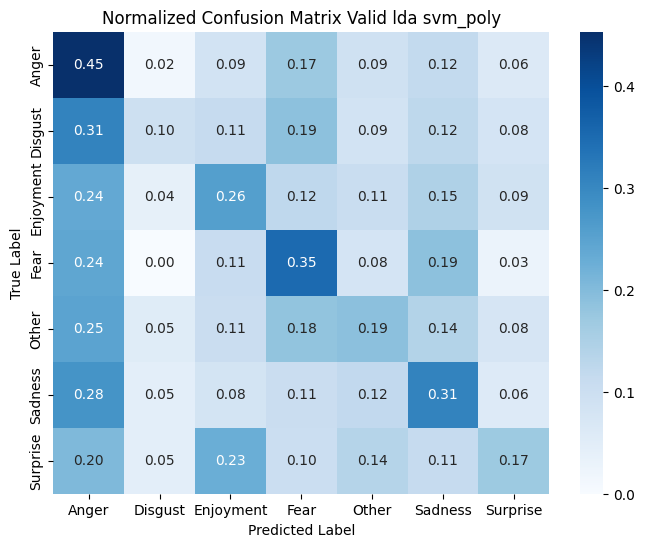

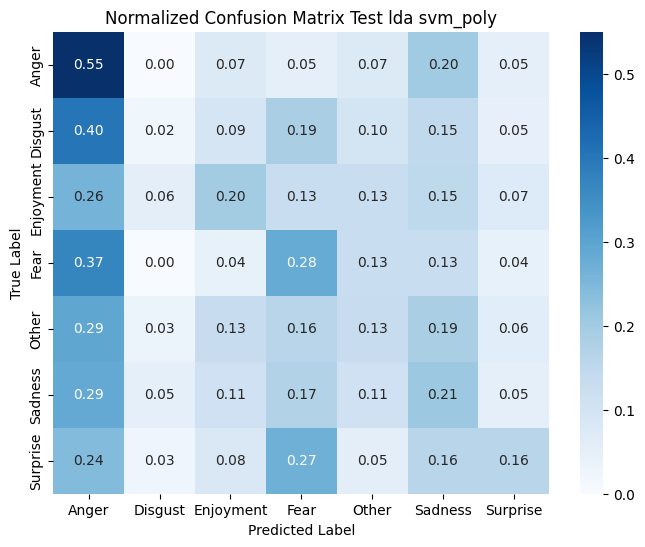

In [73]:
# SVM - poly - LDA (7:3)
model_lda_73_svm_poly, train_lda_73_svm_poly, valid_lda_73_svm_poly, test_lda_73_svm_poly, pred_lda_73_svm_poly = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly = train_lda_73_svm_poly[1], valid_lda_73_svm_poly[1], test_lda_73_svm_poly[1]
y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly = pred_lda_73_svm_poly

pipeline_evaluation(
    y_train_lda_73_svm_poly, y_valid_lda_73_svm_poly, y_test_lda_73_svm_poly,
    y_pred_train_lda_73_svm_poly, y_pred_valid_lda_73_svm_poly, y_pred_test_lda_73_svm_poly,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.9955668144395187
Recall: 0.9955668144395187
Precision: 0.9957109794165679
F1-score: 0.9955982498223223

--- valid --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.38995568685376664
Recall: 0.38995568685376664
Precision: 0.23294274565135917
F1-score: 0.225632152200657

--- test --- 7:3 --- svm_rbf --- lda ---
Accuracy: 0.27761627906976744
Recall: 0.27761627906976744
Precision: 0.07770018306325853
F1-score: 0.12141759813529691


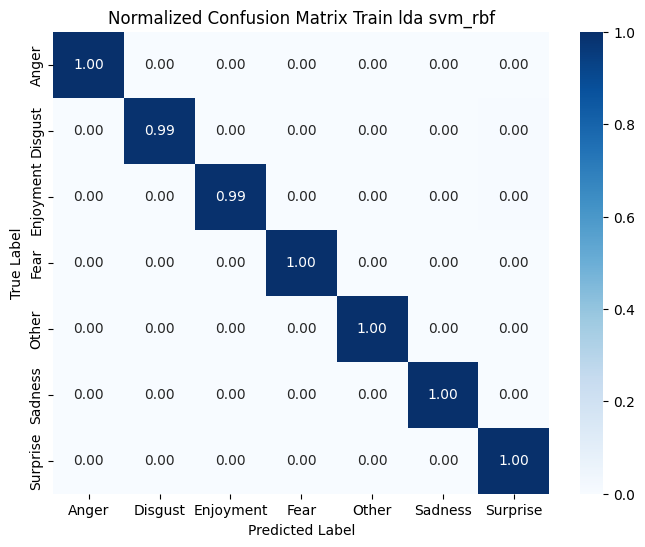

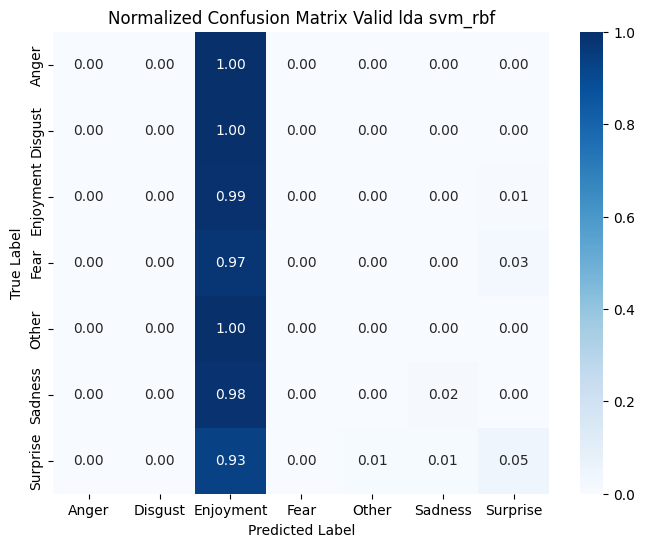

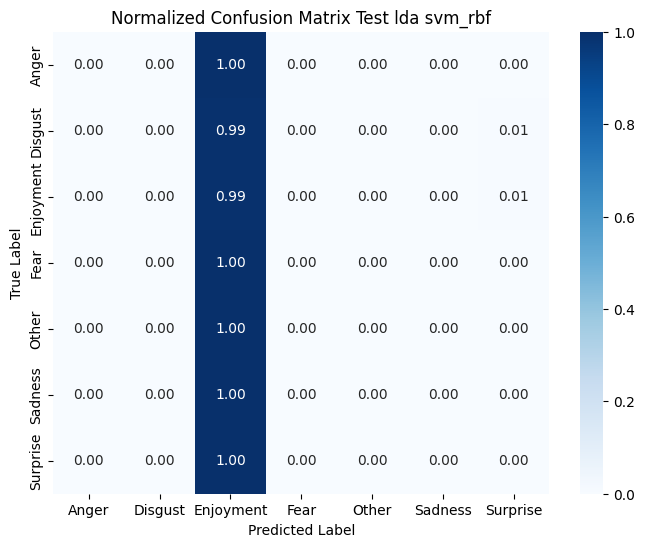

In [74]:
# SVM - rbf - LDA (7:3)
model_lda_73_svm_rbf, train_lda_73_svm_rbf, valid_lda_73_svm_rbf, test_lda_73_svm_rbf, pred_lda_73_svm_rbf = pipeline_modeling(
    X_train_lda_73, X_valid_lda_73, X_test_lda_73,
    y_train_lda_73, y_valid_lda_73, y_test_lda_73,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf = train_lda_73_svm_rbf[1], valid_lda_73_svm_rbf[1], test_lda_73_svm_rbf[1]
y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf = pred_lda_73_svm_rbf

pipeline_evaluation(
    y_train_lda_73_svm_rbf, y_valid_lda_73_svm_rbf, y_test_lda_73_svm_rbf,
    y_pred_train_lda_73_svm_rbf, y_pred_valid_lda_73_svm_rbf, y_pred_test_lda_73_svm_rbf,
    train_size=7, valid_size=3,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Train:Validation = 6:4

## Logistic Regression

### Bộ dữ liệu không giảm chiều

TF-IDF hoàn thành!
Shape: (2707, 4237) (số câu x số từ vựng)
Số từ vựng: 4237
TF-IDF - Non-zero values: 30674


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.8267454746952346
Recall: 0.8267454746952346
Precision: 0.8432693671822383
F1-score: 0.8261489204960984

--- valid --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.5301939058171745
Recall: 0.5301939058171745
Precision: 0.5542269505014413
F1-score: 0.5375223037526974

--- test --- 6:4 --- logistic_regression --- none ---
Accuracy: 0.37209302325581395
Recall: 0.37209302325581395
Precision: 0.4413603122907654
F1-score: 0.3886645085488873


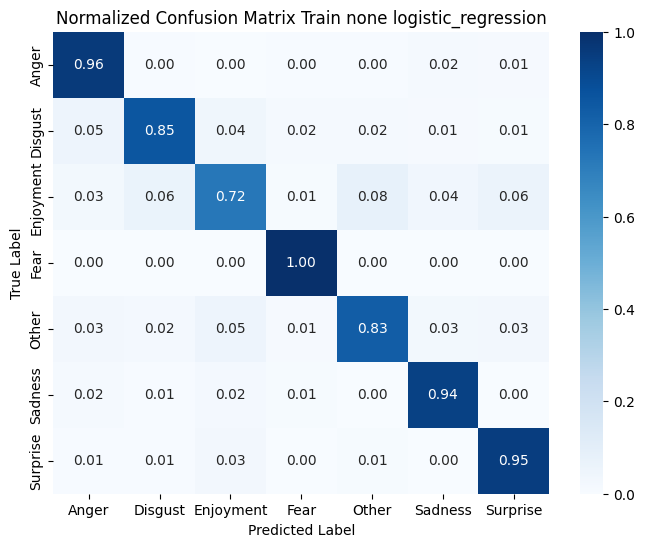

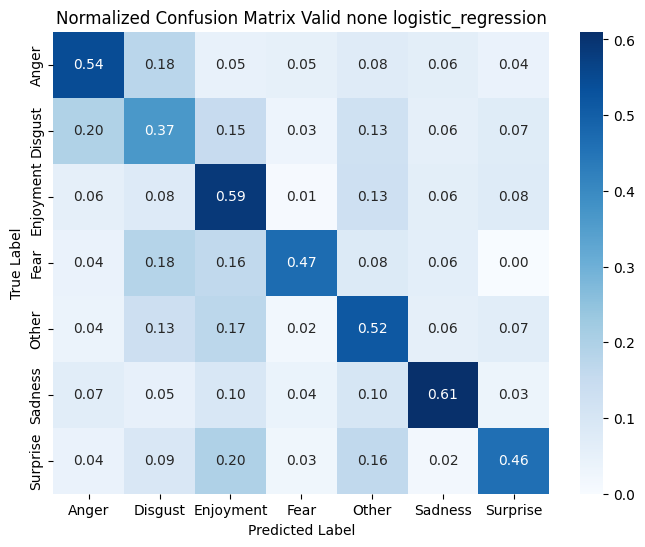

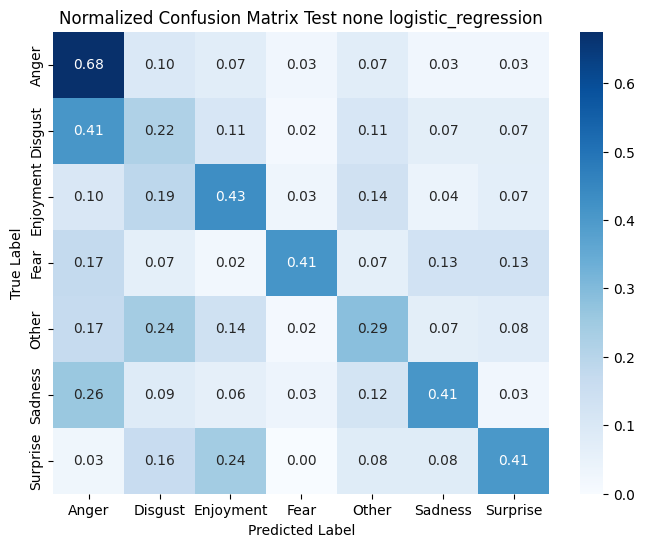

In [75]:
X_train_64, X_valid_64, X_test_64, y_train_64, y_valid_64, y_test_64, tfidf_vec_64, disc_model_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="none"
)

model_64, train_64, valid_64, test_64, pred_64 = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_64, y_pred_valid_64, y_pred_test_64 = pred_64
pipeline_evaluation(
    y_train_64, y_valid_64, y_test_64,
    y_pred_train_64, y_pred_valid_64, y_pred_test_64,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu PCA

TF-IDF hoàn thành!
Shape: (2707, 4237) (số câu x số từ vựng)
Số từ vựng: 4237
TF-IDF - Non-zero values: 30674


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.782415958625785
Recall: 0.782415958625785
Precision: 0.8049046562148428
F1-score: 0.7826702801839804

--- valid --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.5268698060941829
Recall: 0.5268698060941829
Precision: 0.5528603734939688
F1-score: 0.5344724964377415

--- test --- 6:4 --- logistic_regression --- pca ---
Accuracy: 0.373546511627907
Recall: 0.373546511627907
Precision: 0.4493782840638373
F1-score: 0.3925667905402457


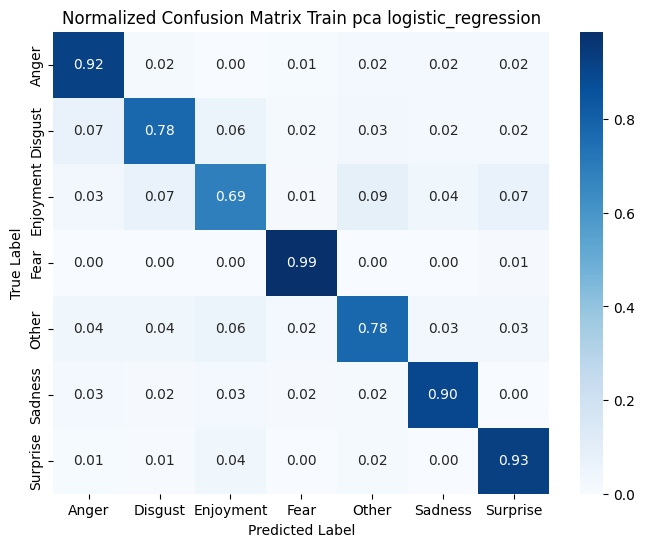

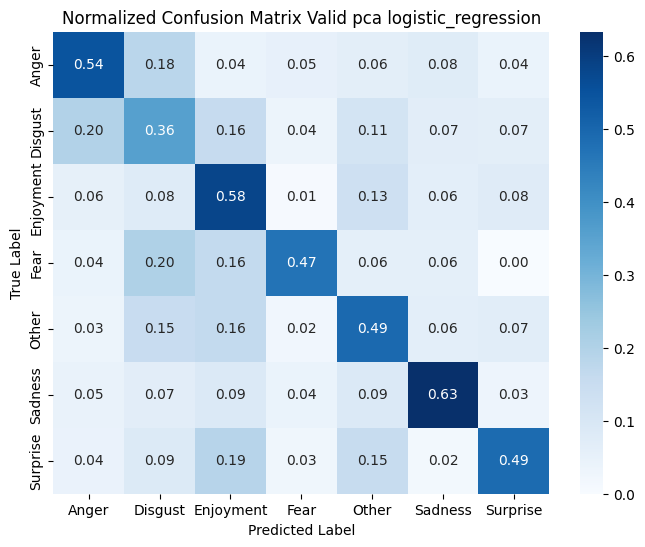

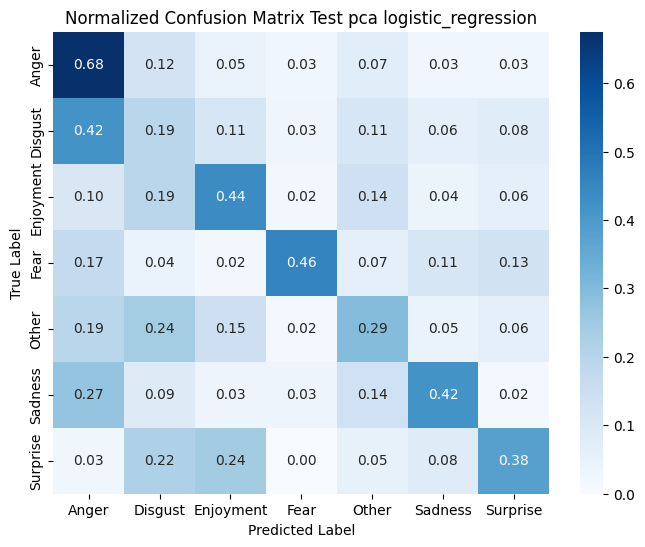

In [76]:
X_train_pca_64, X_valid_pca_64, X_test_pca_64, y_train_pca_64, y_valid_pca_64, y_test_pca_64, tfidf_vec_pca_64, disc_model_pca_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="pca"
)

model_pca_64, train_pca_64, valid_pca_64, test_pca_64, pred_pca_64 = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64 = pred_pca_64

pipeline_evaluation(
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    y_pred_train_pca_64, y_pred_valid_pca_64, y_pred_test_pca_64,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="logistic_regression",
    show_plot=True
)

### Bộ dữ liệu lda

TF-IDF hoàn thành!
Shape: (2707, 4237) (số câu x số từ vựng)
Số từ vựng: 4237
TF-IDF - Non-zero values: 30674


c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


--- train --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.995197635759143
Recall: 0.995197635759143
Precision: 0.9953935128526153
F1-score: 0.9952417974441183

--- valid --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.3346260387811634
Recall: 0.3346260387811634
Precision: 0.35871483892931194
F1-score: 0.34088288760647073

--- test --- 6:4 --- logistic_regression --- lda ---
Accuracy: 0.25726744186046513
Recall: 0.25726744186046513
Precision: 0.2679044498962973
F1-score: 0.25435875869069163


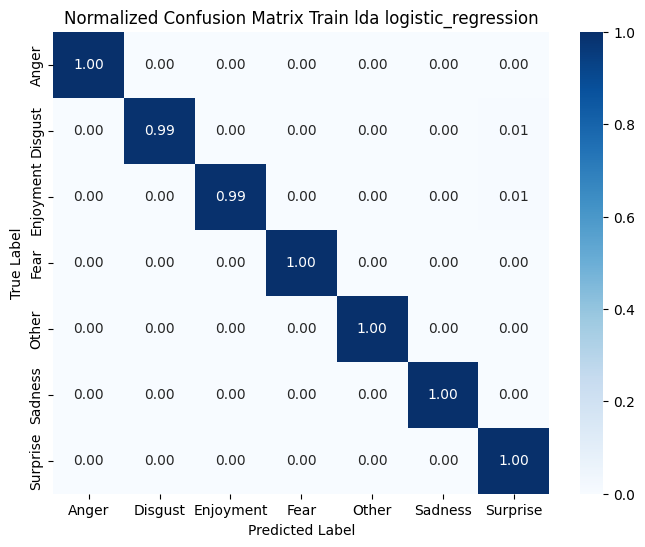

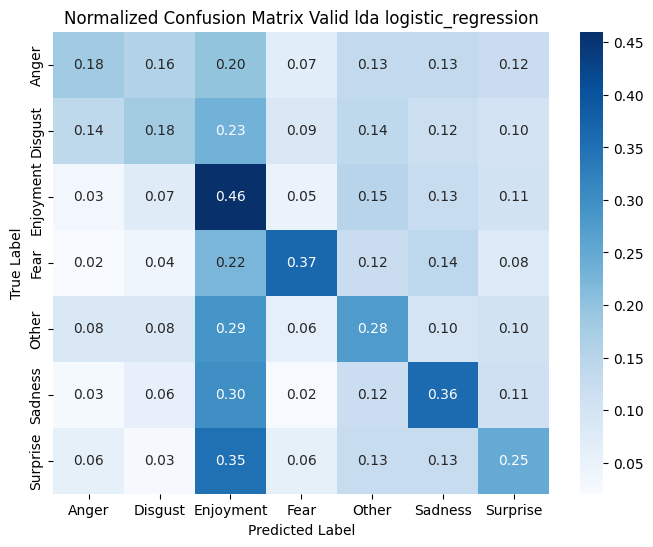

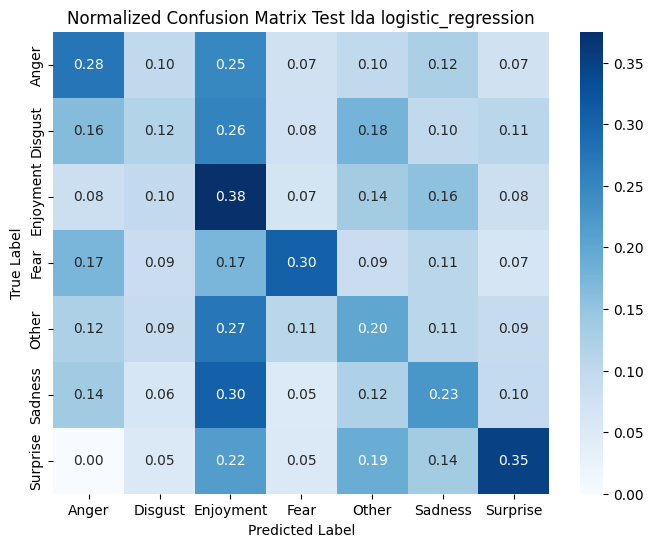

In [77]:
X_train_lda_64, X_valid_lda_64, X_test_lda_64, y_train_lda_64, y_valid_lda_64, y_test_lda_64, tfidf_vec_lda_64, disc_model_lda_64 = prepare_data_for_modeling(
    train_valid_processed_comments,
    test_processed_comments,
    train_size=6,
    valid_size=4,
    discriminant="lda"
)

model_lda_64, train_lda_64, valid_lda_64, test_lda_64, pred_lda_64 = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="logistic_regression",
    max_iter=1000
)

y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64 = pred_lda_64

pipeline_evaluation(
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    y_pred_train_lda_64, y_pred_valid_lda_64, y_pred_test_lda_64,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="logistic_regression",
    show_plot=True
)

## K-NN

### Bộ dữ liệu không giảm chiều

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.4569634281492427
Recall: 0.4569634281492427
Precision: 0.5773453714989712
F1-score: 0.35212148417141875

--- valid --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.44653739612188365
Recall: 0.44653739612188365
Precision: 0.5139047127149776
F1-score: 0.34097998645147254

--- test --- 6:4 --- knn_euclidean --- none ---
Accuracy: 0.2921511627906977
Recall: 0.2921511627906977
Precision: 0.33409893101545923
F1-score: 0.16037251512747616


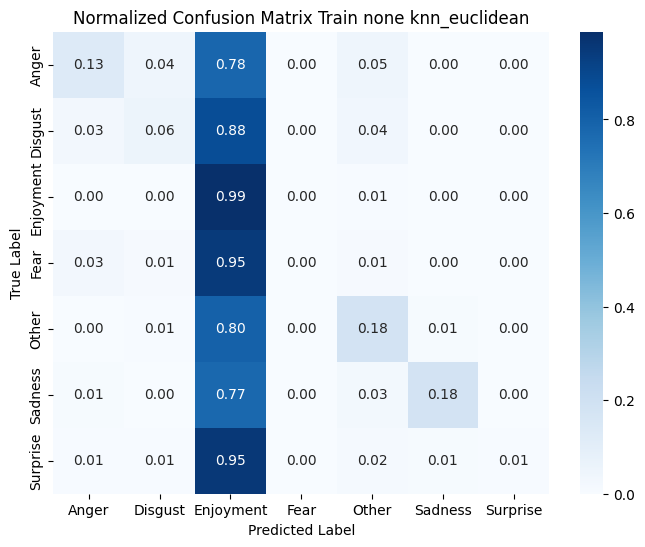

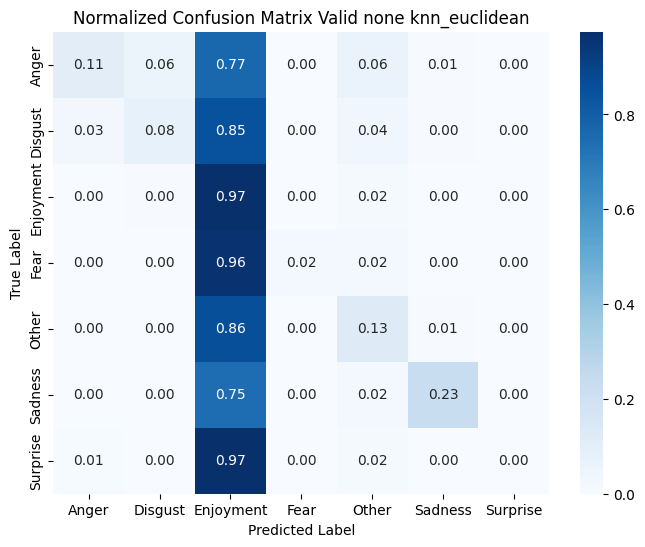

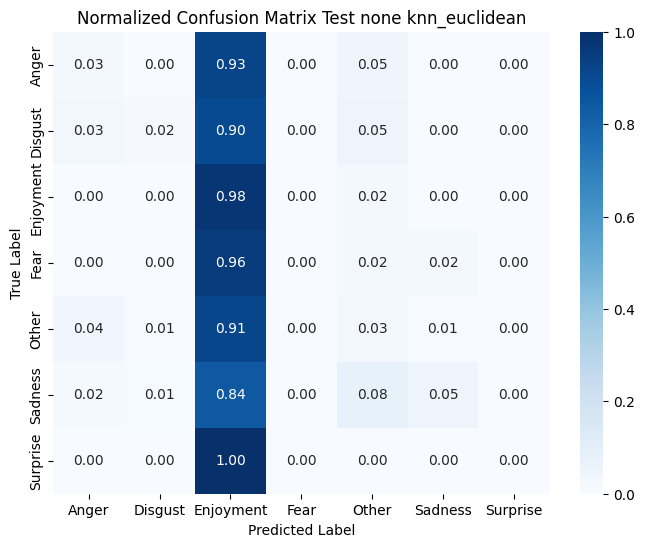

In [78]:
# KNN - euclidean - None (6:4)
model_64_knn_euclidean, train_64_knn_euclidean, valid_64_knn_euclidean, test_64_knn_euclidean, pred_64_knn_euclidean = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn",
    metric="euclidean"
)

y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean = train_64_knn_euclidean[1], valid_64_knn_euclidean[1], test_64_knn_euclidean[1]
y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean = pred_64_knn_euclidean

pipeline_evaluation(
    y_train_64_knn_euclidean, y_valid_64_knn_euclidean, y_test_64_knn_euclidean,
    y_pred_train_64_knn_euclidean, y_pred_valid_64_knn_euclidean, y_pred_test_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn --- none ---
Accuracy: 0.48097524935352787
Recall: 0.48097524935352787
Precision: 0.5493183760041118
F1-score: 0.3909116623520665

--- valid --- 6:4 --- knn --- none ---
Accuracy: 0.46814404432132967
Recall: 0.46814404432132967
Precision: 0.5080888332180566
F1-score: 0.38195546869268043

--- test --- 6:4 --- knn --- none ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.28775032522695254
F1-score: 0.1822221927307979


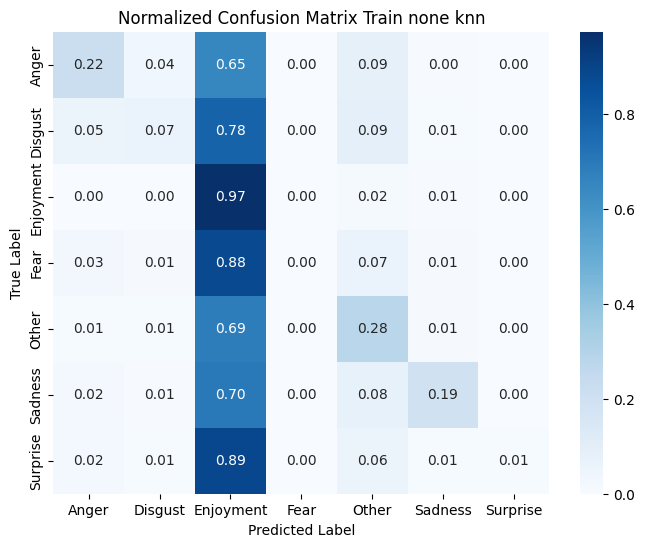

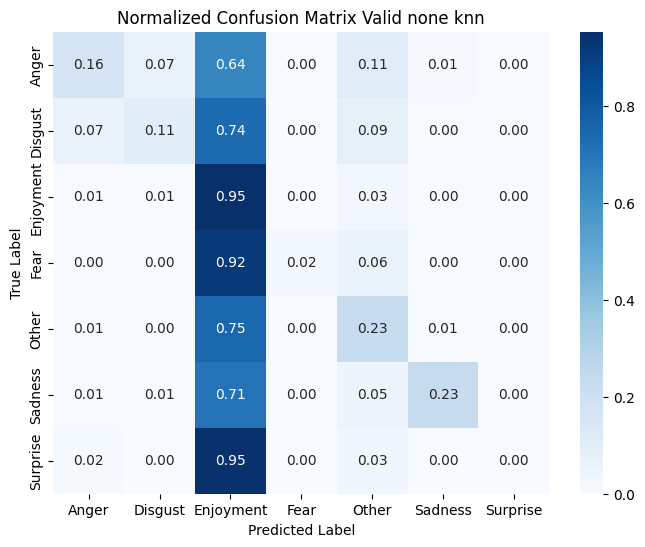

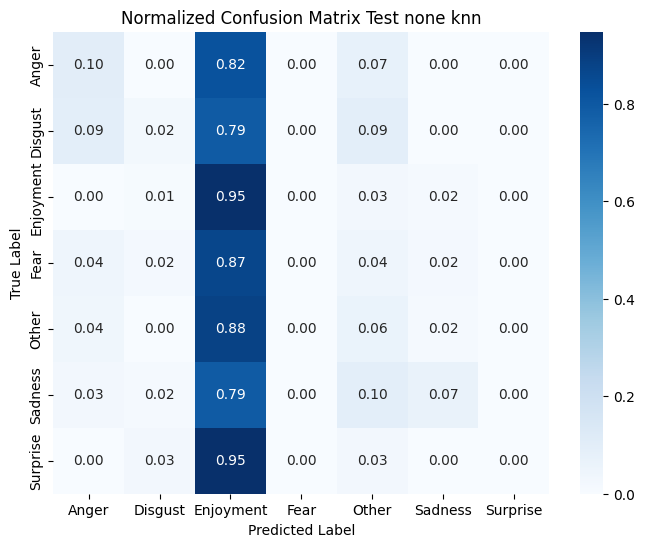

In [79]:
model_64_knn, train_64_knn, valid_64_knn, test_64_knn, pred_64_knn = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="knn"
)

y_train_64_knn, y_valid_64_knn, y_test_64_knn = train_64_knn[1], valid_64_knn[1], test_64_knn[1]
y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn = pred_64_knn

pipeline_evaluation(
    y_train_64_knn, y_valid_64_knn, y_test_64_knn,
    y_pred_train_64_knn, y_pred_valid_64_knn, y_pred_test_64_knn,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu PCA

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave

--- train --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.4643516808274843
Recall: 0.4643516808274843
Precision: 0.5741171975930824
F1-score: 0.3631667545905637

--- valid --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.4487534626038781
Recall: 0.4487534626038781
Precision: 0.47879724334449497
F1-score: 0.3455426007931943

--- test --- 6:4 --- knn_euclidean --- pca ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.33136053520062403
F1-score: 0.1680975790222243


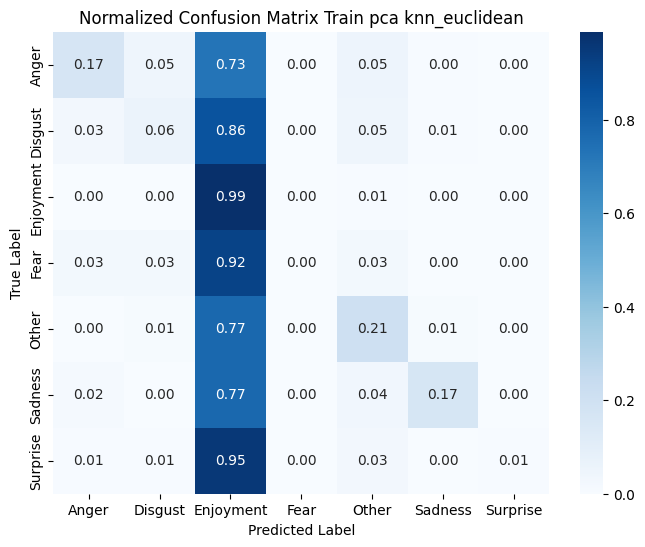

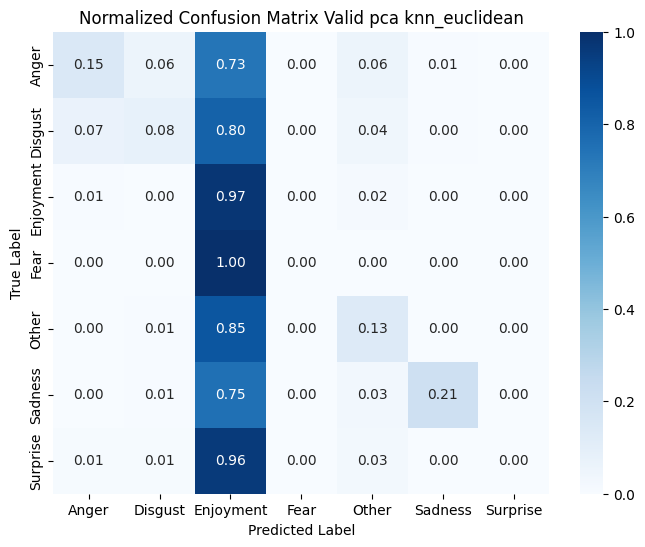

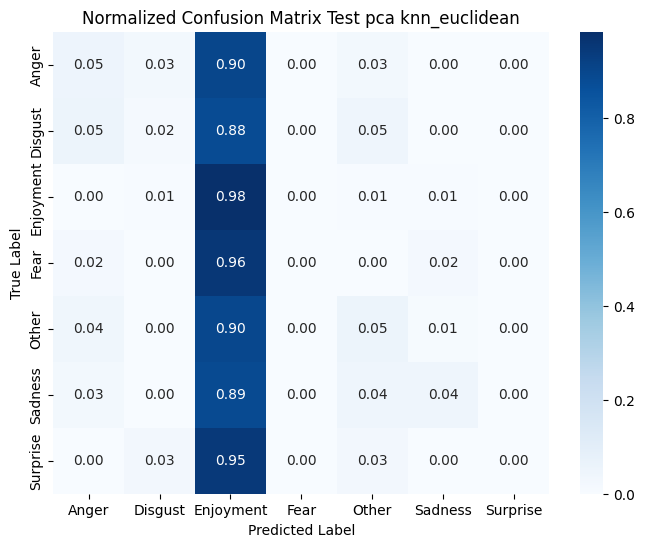

In [80]:
# KNN - euclidean - PCA (6:4)
model_pca_64_knn_euclidean, train_pca_64_knn_euclidean, valid_pca_64_knn_euclidean, test_pca_64_knn_euclidean, pred_pca_64_knn_euclidean = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    metric="euclidean"
)

y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean = train_pca_64_knn_euclidean[1], valid_pca_64_knn_euclidean[1], test_pca_64_knn_euclidean[1]
y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean = pred_pca_64_knn_euclidean

pipeline_evaluation(
    y_train_pca_64_knn_euclidean, y_valid_pca_64_knn_euclidean, y_test_pca_64_knn_euclidean,
    y_pred_train_pca_64_knn_euclidean, y_pred_valid_pca_64_knn_euclidean, y_pred_test_pca_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn_euclidean",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- knn --- pca ---
Accuracy: 0.47432582194311046
Recall: 0.47432582194311046
Precision: 0.5437396264108924
F1-score: 0.38107633540533786

--- valid --- 6:4 --- knn --- pca ---
Accuracy: 0.46426592797783933
Recall: 0.46426592797783933
Precision: 0.5100408686934551
F1-score: 0.3769682231202588

--- test --- 6:4 --- knn --- pca ---
Accuracy: 0.30377906976744184
Recall: 0.30377906976744184
Precision: 0.36988415791663226
F1-score: 0.18893223348793173


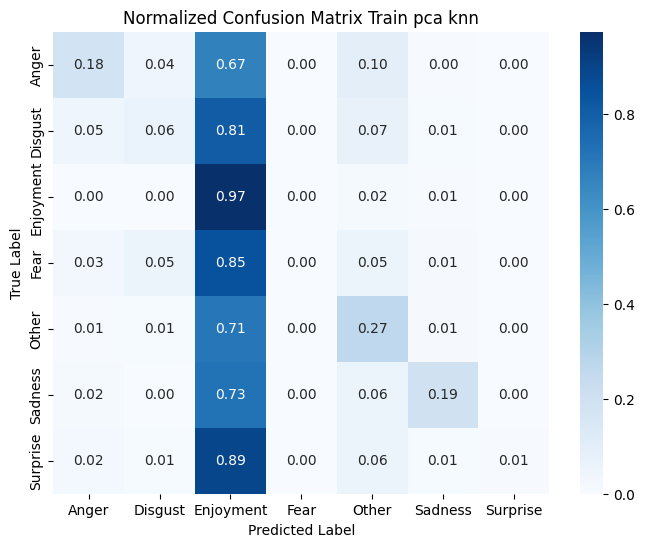

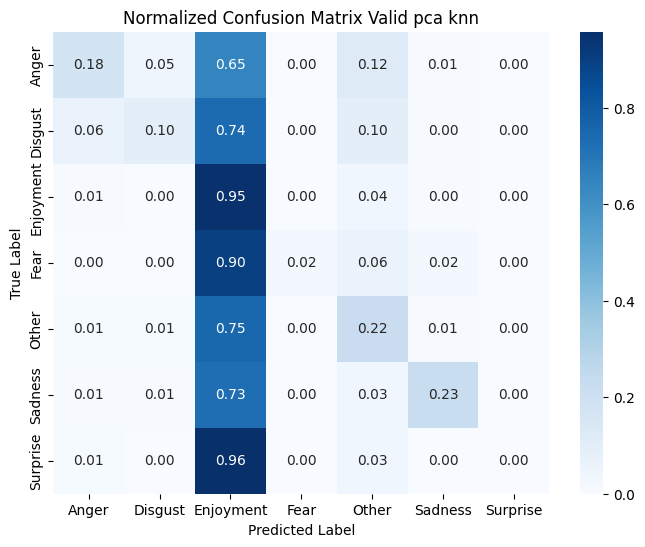

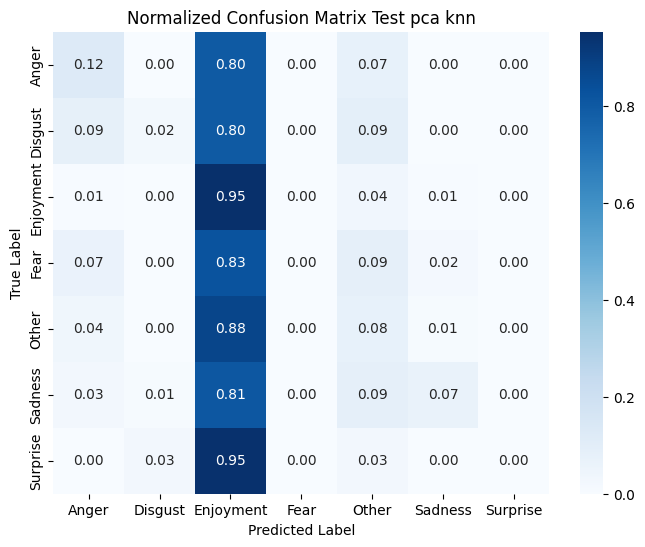

In [81]:

model_pca_64_knn, train_pca_64_knn, valid_pca_64_knn, test_pca_64_knn, pred_pca_64_knn = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="knn",
    max_iter=1000
)

y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn = train_pca_64_knn[1], valid_pca_64_knn[1], test_pca_64_knn[1]
y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn = pred_pca_64_knn

pipeline_evaluation(
    y_train_pca_64_knn, y_valid_pca_64_knn, y_test_pca_64_knn,
    y_pred_train_pca_64_knn, y_pred_valid_pca_64_knn, y_pred_test_pca_64_knn,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="knn",
    show_plot=True
)

### Bộ dữ liệu lda

--- train --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.9959364610269671
Recall: 0.9959364610269671
Precision: 0.9959619312729961
F1-score: 0.9959335816860867

--- valid --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.35844875346260385
Recall: 0.35844875346260385
Precision: 0.3825817681235336
F1-score: 0.363058248136921

--- test --- 6:4 --- knn_euclidean --- lda ---
Accuracy: 0.26744186046511625
Recall: 0.26744186046511625
Precision: 0.2917453808498437
F1-score: 0.26676629256575035


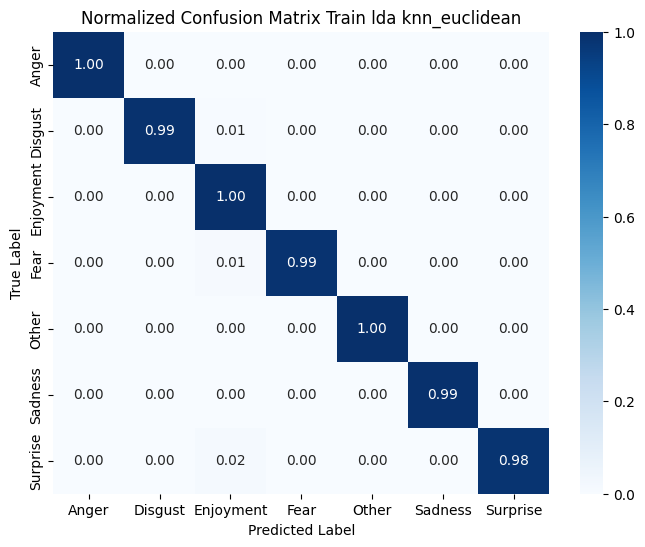

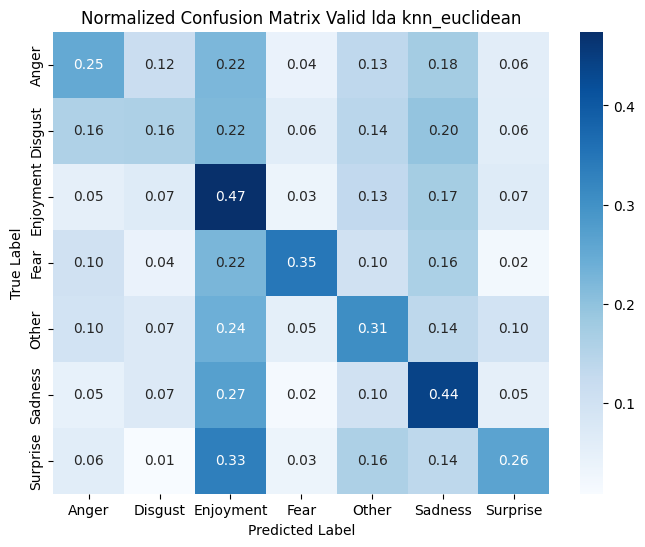

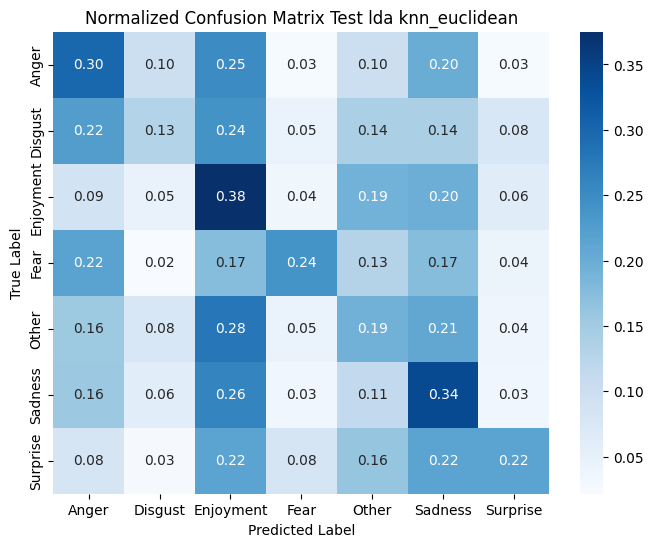

In [82]:
# KNN - euclidean - LDA (6:4)
model_lda_64_knn_euclidean, train_lda_64_knn_euclidean, valid_lda_64_knn_euclidean, test_lda_64_knn_euclidean, pred_lda_64_knn_euclidean = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    metric="euclidean"
)

y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean = train_lda_64_knn_euclidean[1], valid_lda_64_knn_euclidean[1], test_lda_64_knn_euclidean[1]
y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean = pred_lda_64_knn_euclidean

pipeline_evaluation(
    y_train_lda_64_knn_euclidean, y_valid_lda_64_knn_euclidean, y_test_lda_64_knn_euclidean,
    y_pred_train_lda_64_knn_euclidean, y_pred_valid_lda_64_knn_euclidean, y_pred_test_lda_64_knn_euclidean,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn_euclidean",
    show_plot=True
)

--- train --- 6:4 --- knn --- lda ---
Accuracy: 0.9915035094200222
Recall: 0.9915035094200222
Precision: 0.9918751600105309
F1-score: 0.9915804294808539

--- valid --- 6:4 --- knn --- lda ---
Accuracy: 0.31966759002770084
Recall: 0.31966759002770084
Precision: 0.3678651465706475
F1-score: 0.32802839681148693

--- test --- 6:4 --- knn --- lda ---
Accuracy: 0.2543604651162791
Recall: 0.2543604651162791
Precision: 0.28436976896943433
F1-score: 0.25142170343893677


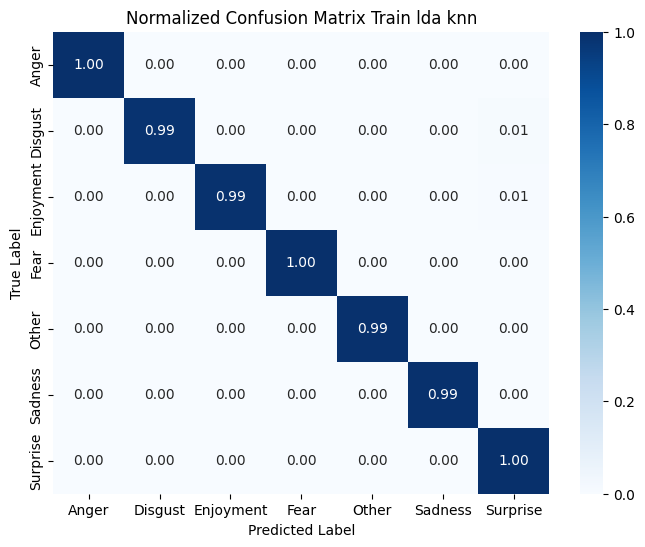

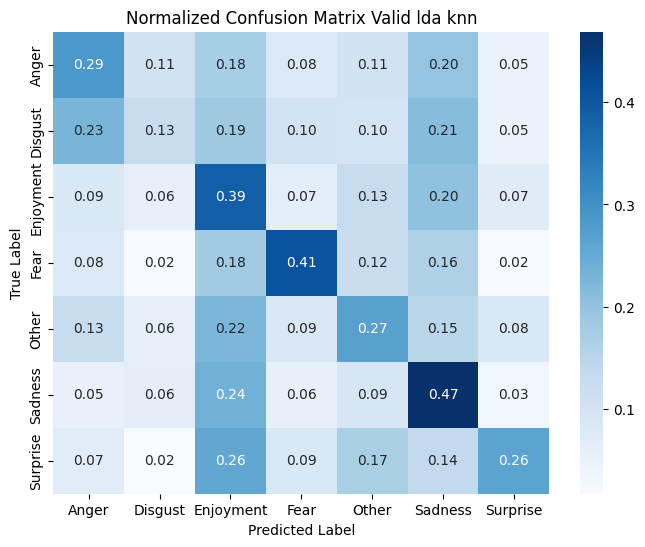

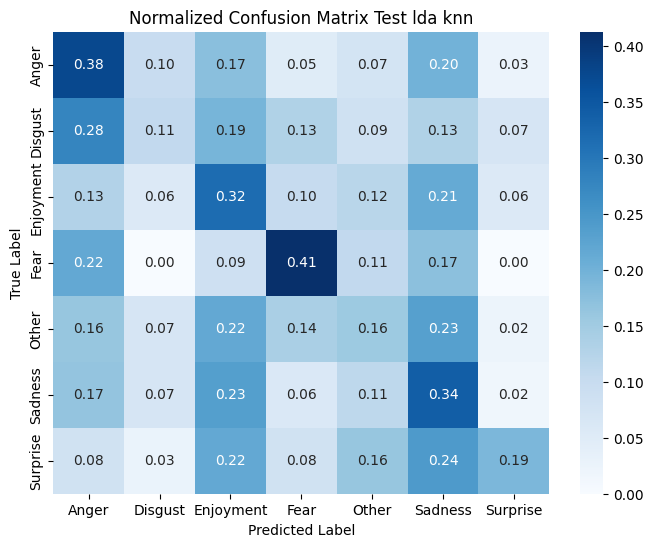

In [83]:

model_lda_64_knn, train_lda_64_knn, valid_lda_64_knn, test_lda_64_knn, pred_lda_64_knn = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="knn",
    max_iter=1000
)

y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn = train_lda_64_knn[1], valid_lda_64_knn[1], test_lda_64_knn[1]
y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn = pred_lda_64_knn

pipeline_evaluation(
    y_train_lda_64_knn, y_valid_lda_64_knn, y_test_lda_64_knn,
    y_pred_train_lda_64_knn, y_pred_valid_lda_64_knn, y_pred_test_lda_64_knn,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="knn",
    show_plot=True
)

## SVM

### Bộ dữ liệu gốc

--- train --- 6:4 --- svm_linear --- none ---
Accuracy: 0.9438492796453639
Recall: 0.9438492796453639
Precision: 0.9456977233625424
F1-score: 0.9440043911256903

--- valid --- 6:4 --- svm_linear --- none ---
Accuracy: 0.5412742382271468
Recall: 0.5412742382271468
Precision: 0.5455057047633807
F1-score: 0.5425007620522014

--- test --- 6:4 --- svm_linear --- none ---
Accuracy: 0.3706395348837209
Recall: 0.3706395348837209
Precision: 0.4089460413747604
F1-score: 0.3762264376516677


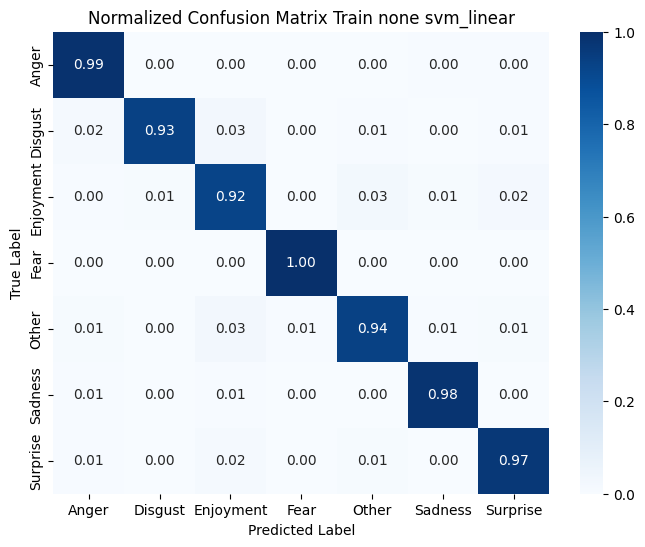

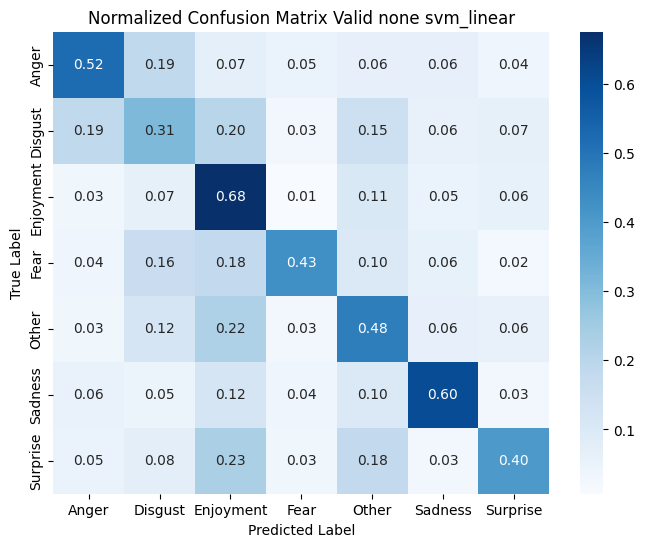

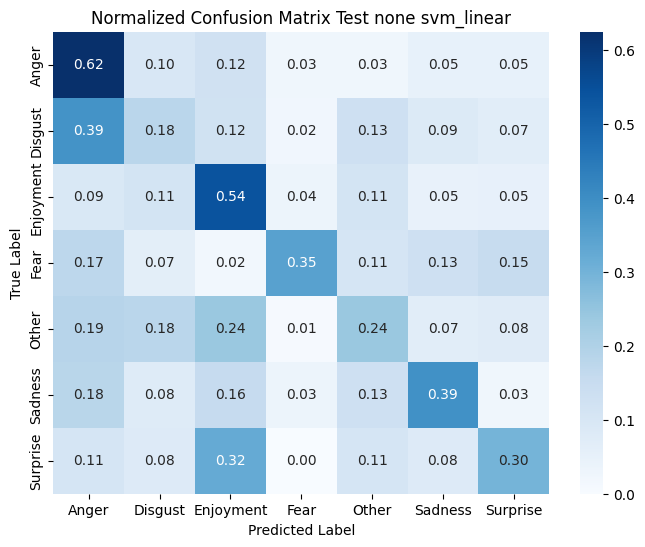

In [84]:
# SVM - linear - None (6:4)
model_64_svm_linear, train_64_svm_linear, valid_64_svm_linear, test_64_svm_linear, pred_64_svm_linear = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear = train_64_svm_linear[1], valid_64_svm_linear[1], test_64_svm_linear[1]
y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear = pred_64_svm_linear

pipeline_evaluation(
    y_train_64_svm_linear, y_valid_64_svm_linear, y_test_64_svm_linear,
    y_pred_train_64_svm_linear, y_pred_valid_64_svm_linear, y_pred_test_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- none ---
Accuracy: 0.9597340229035833
Recall: 0.9597340229035833
Precision: 0.9629020090867934
F1-score: 0.9600308749787644

--- valid --- 6:4 --- svm_poly --- none ---
Accuracy: 0.4520775623268698
Recall: 0.4520775623268698
Precision: 0.5449729792580624
F1-score: 0.4505539296436884

--- test --- 6:4 --- svm_poly --- none ---
Accuracy: 0.29796511627906974
Recall: 0.29796511627906974
Precision: 0.4403251950830984
F1-score: 0.27459998561800286


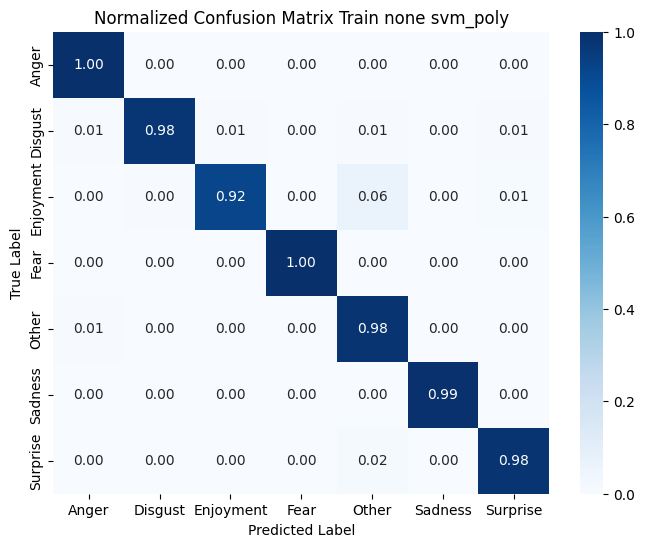

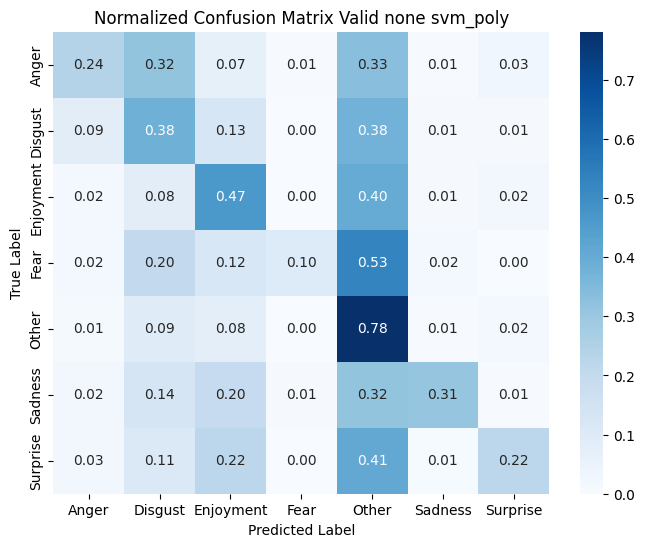

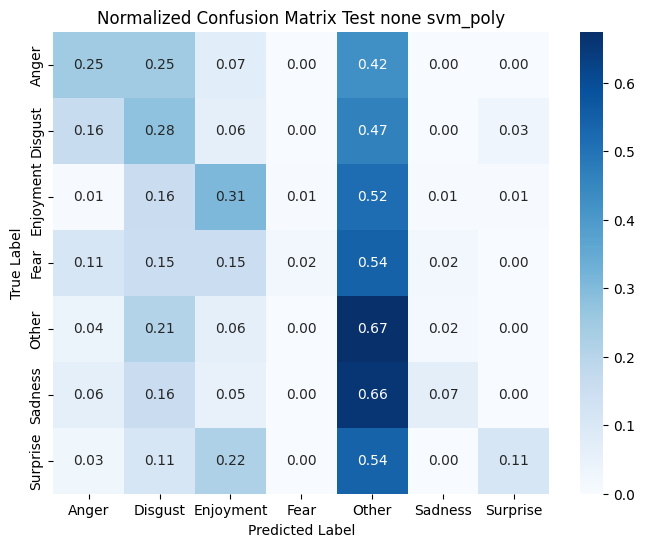

In [85]:
# SVM - poly - None (6:4)
model_64_svm_poly, train_64_svm_poly, valid_64_svm_poly, test_64_svm_poly, pred_64_svm_poly = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly = train_64_svm_poly[1], valid_64_svm_poly[1], test_64_svm_poly[1]
y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly = pred_64_svm_poly

pipeline_evaluation(
    y_train_64_svm_poly, y_valid_64_svm_poly, y_test_64_svm_poly,
    y_pred_train_64_svm_poly, y_pred_valid_64_svm_poly, y_pred_test_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.9264868858514961
Recall: 0.9264868858514961
Precision: 0.9356120532432155
F1-score: 0.9266209245455062

--- valid --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.49584487534626037
Recall: 0.49584487534626037
Precision: 0.5633998517465191
F1-score: 0.5024975623022753

--- test --- 6:4 --- svm_rbf --- none ---
Accuracy: 0.34156976744186046
Recall: 0.34156976744186046
Precision: 0.477607763273032
F1-score: 0.3528987576197186


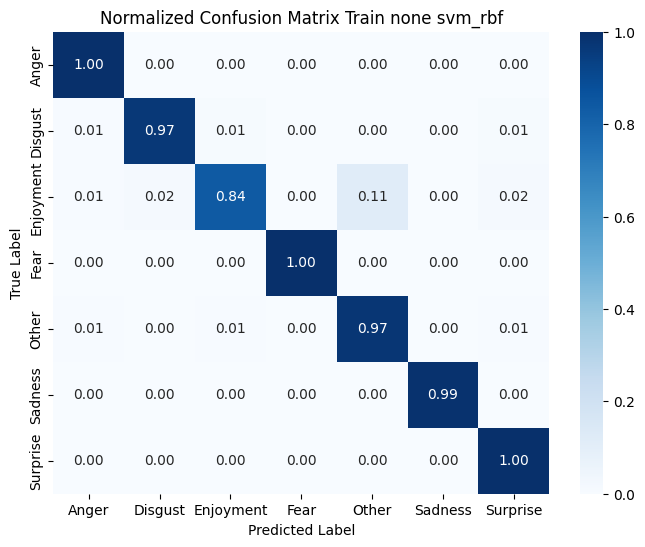

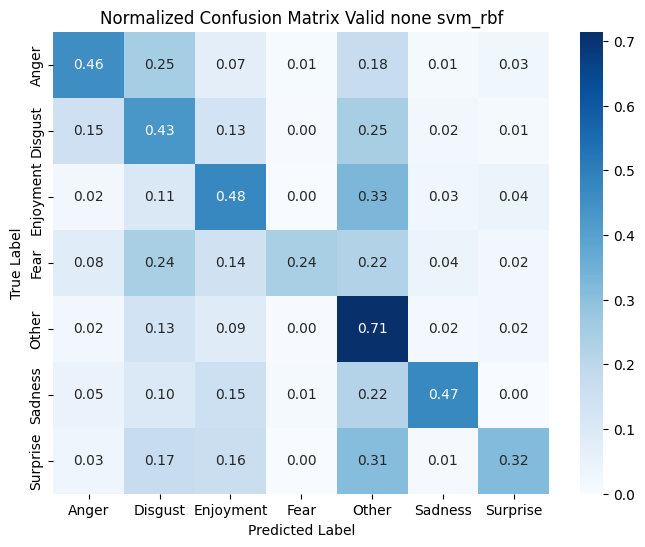

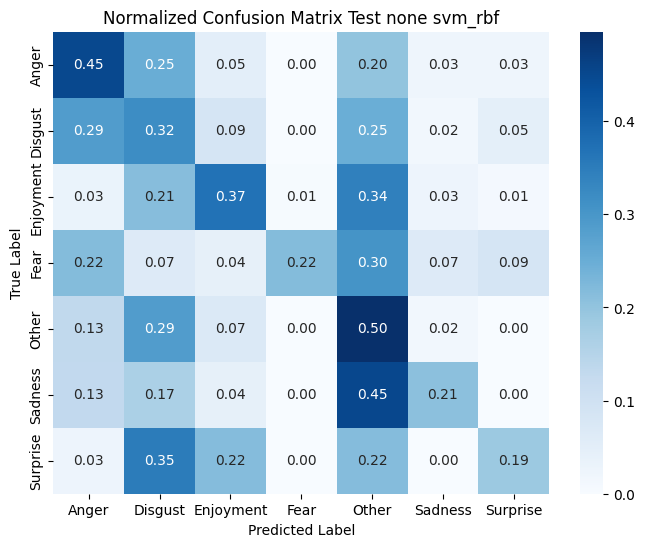

In [86]:
# SVM - rbf - None (6:4)
model_64_svm_rbf, train_64_svm_rbf, valid_64_svm_rbf, test_64_svm_rbf, pred_64_svm_rbf = pipeline_modeling(
    X_train_64, X_valid_64, X_test_64,
    y_train_64, y_valid_64, y_test_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf = train_64_svm_rbf[1], valid_64_svm_rbf[1], test_64_svm_rbf[1]
y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf = pred_64_svm_rbf

pipeline_evaluation(
    y_train_64_svm_rbf, y_valid_64_svm_rbf, y_test_64_svm_rbf,
    y_pred_train_64_svm_rbf, y_pred_valid_64_svm_rbf, y_pred_test_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="none",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu PCA

--- train --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.8840044329516069
Recall: 0.8840044329516069
Precision: 0.8890329380487466
F1-score: 0.884168543478738

--- valid --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.5401662049861495
Recall: 0.5401662049861495
Precision: 0.5431234111190162
F1-score: 0.5401792257826273

--- test --- 6:4 --- svm_linear --- pca ---
Accuracy: 0.3808139534883721
Recall: 0.3808139534883721
Precision: 0.4239095778689976
F1-score: 0.3870545828056485


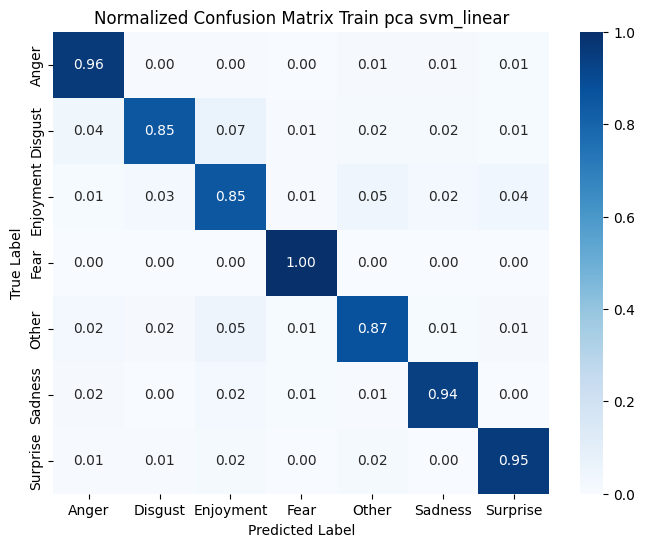

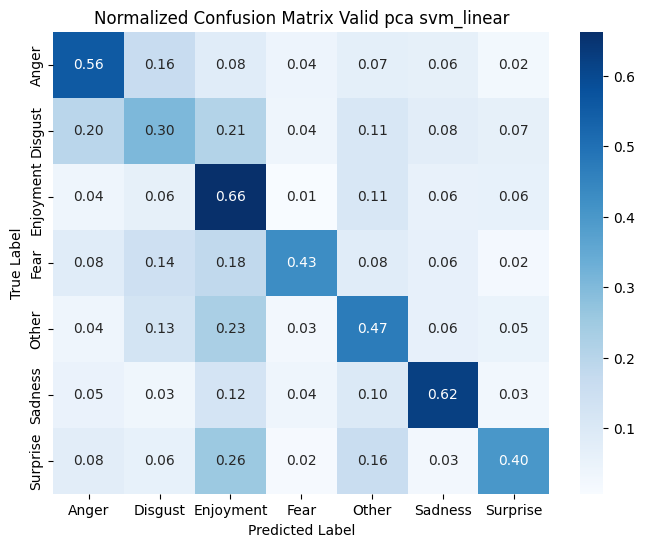

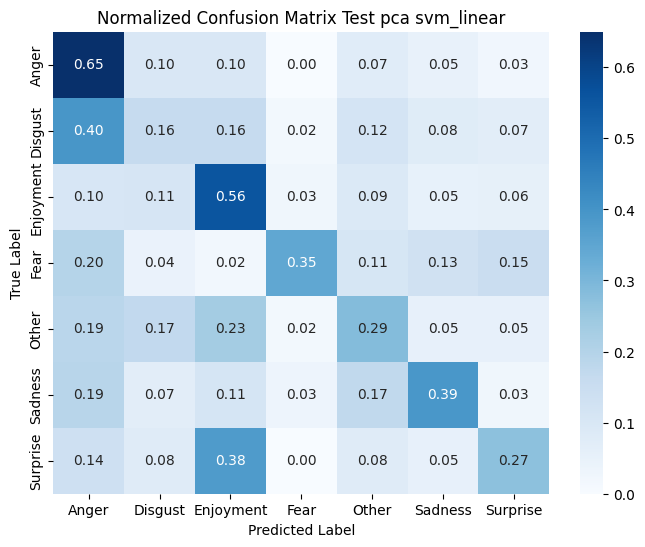

In [87]:
# SVM - linear - PCA (6:4)
model_pca_64_svm_linear, train_pca_64_svm_linear, valid_pca_64_svm_linear, test_pca_64_svm_linear, pred_pca_64_svm_linear = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear = train_pca_64_svm_linear[1], valid_pca_64_svm_linear[1], test_pca_64_svm_linear[1]
y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear = pred_pca_64_svm_linear

pipeline_evaluation(
    y_train_pca_64_svm_linear, y_valid_pca_64_svm_linear, y_test_pca_64_svm_linear,
    y_pred_train_pca_64_svm_linear, y_pred_valid_pca_64_svm_linear, y_pred_test_pca_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_linear",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.9464351680827484
Recall: 0.9464351680827484
Precision: 0.951180100109731
F1-score: 0.9467521329271782

--- valid --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.4476454293628809
Recall: 0.4476454293628809
Precision: 0.5445414250978857
F1-score: 0.4464277123346641

--- test --- 6:4 --- svm_poly --- pca ---
Accuracy: 0.2921511627906977
Recall: 0.2921511627906977
Precision: 0.44062998790689867
F1-score: 0.26995886217488674


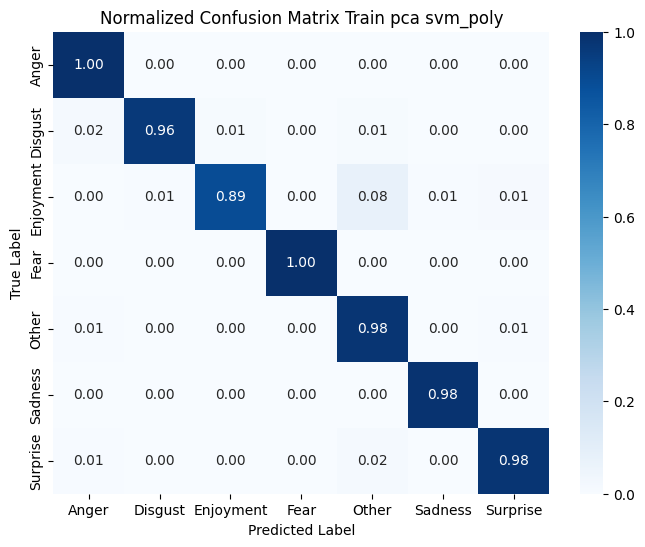

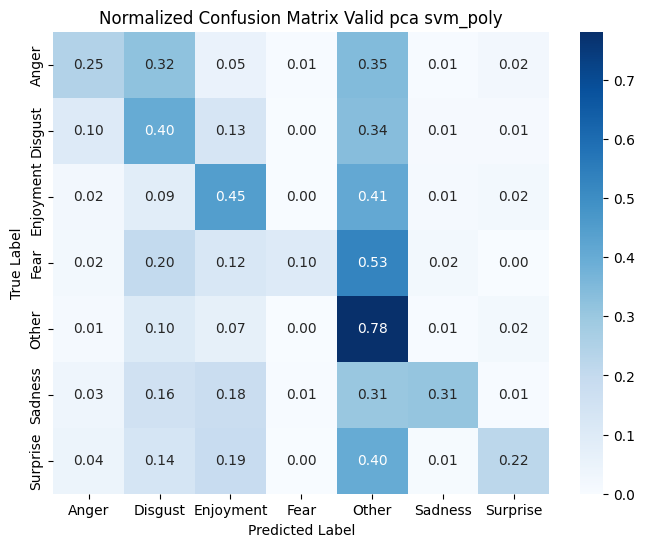

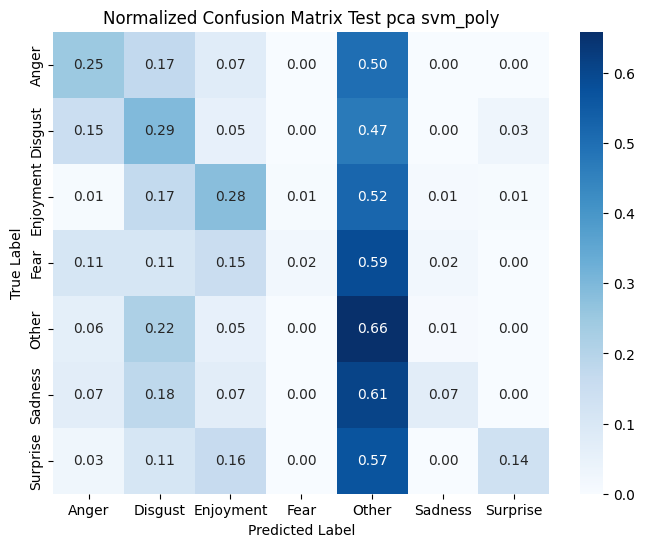

In [88]:
# SVM - poly - PCA (6:4)
model_pca_64_svm_poly, train_pca_64_svm_poly, valid_pca_64_svm_poly, test_pca_64_svm_poly, pred_pca_64_svm_poly = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly = train_pca_64_svm_poly[1], valid_pca_64_svm_poly[1], test_pca_64_svm_poly[1]
y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly = pred_pca_64_svm_poly

pipeline_evaluation(
    y_train_pca_64_svm_poly, y_valid_pca_64_svm_poly, y_test_pca_64_svm_poly,
    y_pred_train_pca_64_svm_poly, y_pred_valid_pca_64_svm_poly, y_pred_test_pca_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:305: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


--- train --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.8965644625046176
Recall: 0.8965644625046176
Precision: 0.9105094151964416
F1-score: 0.8957798735538169

--- valid --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.48310249307479225
Recall: 0.48310249307479225
Precision: 0.5439563637525806
F1-score: 0.4985862866073519

--- test --- 6:4 --- svm_rbf --- pca ---
Accuracy: 0.33575581395348836
Recall: 0.33575581395348836
Precision: 0.46403449154532184
F1-score: 0.3549797987830289


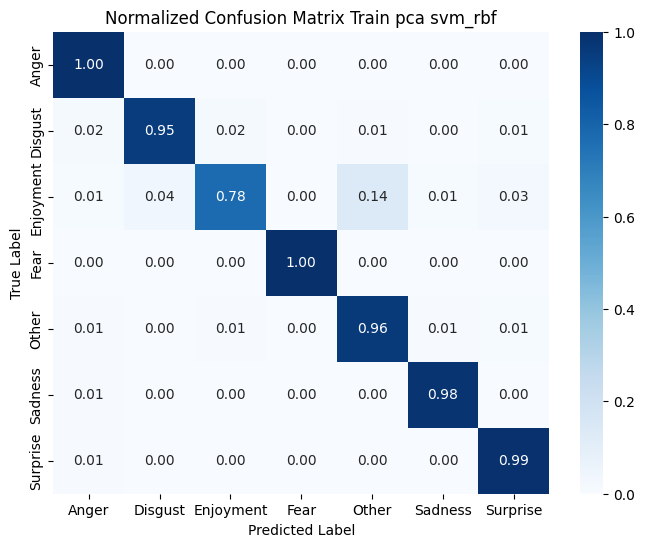

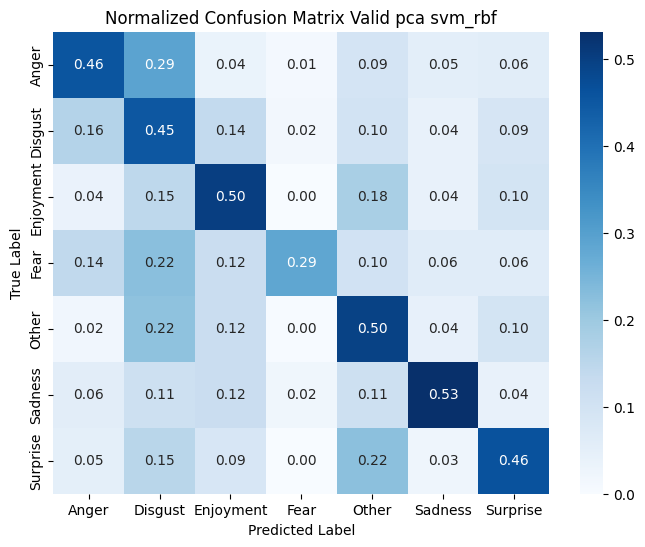

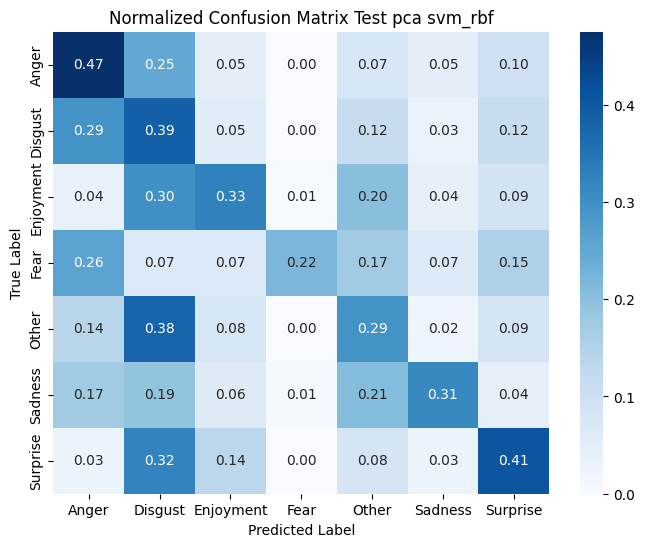

In [89]:
# SVM - rbf - PCA (6:4)
model_pca_64_svm_rbf, train_pca_64_svm_rbf, valid_pca_64_svm_rbf, test_pca_64_svm_rbf, pred_pca_64_svm_rbf = pipeline_modeling(
    X_train_pca_64, X_valid_pca_64, X_test_pca_64,
    y_train_pca_64, y_valid_pca_64, y_test_pca_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf = train_pca_64_svm_rbf[1], valid_pca_64_svm_rbf[1], test_pca_64_svm_rbf[1]
y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf = pred_pca_64_svm_rbf

pipeline_evaluation(
    y_train_pca_64_svm_rbf, y_valid_pca_64_svm_rbf, y_test_pca_64_svm_rbf,
    y_pred_train_pca_64_svm_rbf, y_pred_valid_pca_64_svm_rbf, y_pred_test_pca_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="pca",
    model_type="svm_rbf",
    show_plot=True
)

### Bộ dữ liệu LDA

--- train --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.9937199852234947
Recall: 0.9937199852234947
Precision: 0.9940209876663453
F1-score: 0.9937831005037943

--- valid --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.36786703601108034
Recall: 0.36786703601108034
Precision: 0.3670234585313884
F1-score: 0.35757248424512506

--- test --- 6:4 --- svm_linear --- lda ---
Accuracy: 0.26453488372093026
Recall: 0.26453488372093026
Precision: 0.2643744333315929
F1-score: 0.25094950153289125


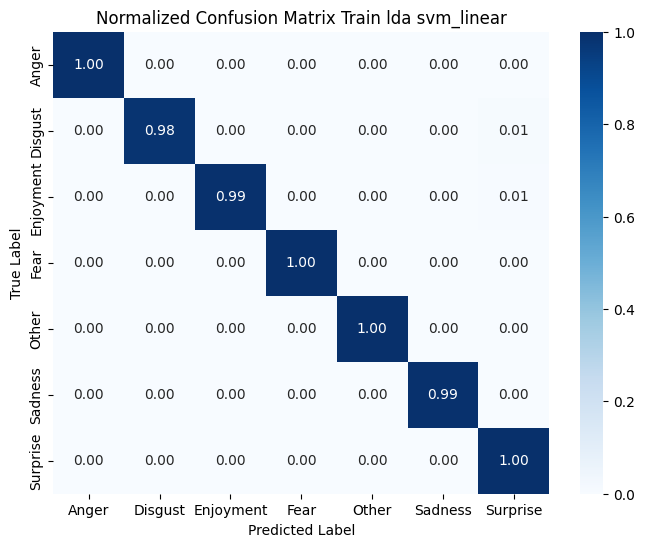

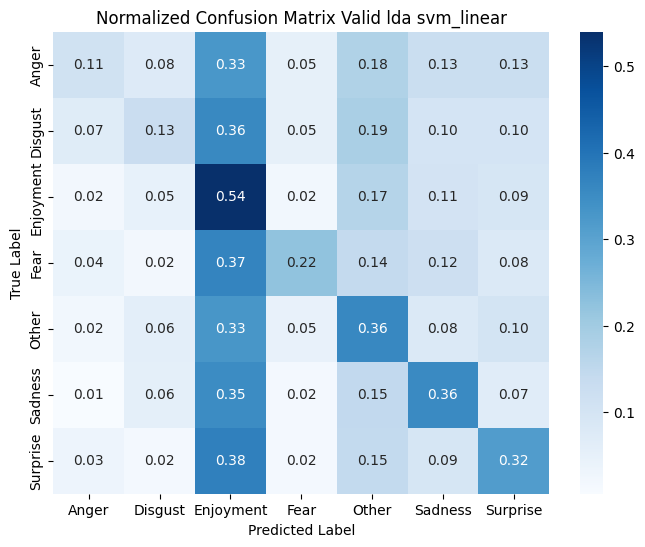

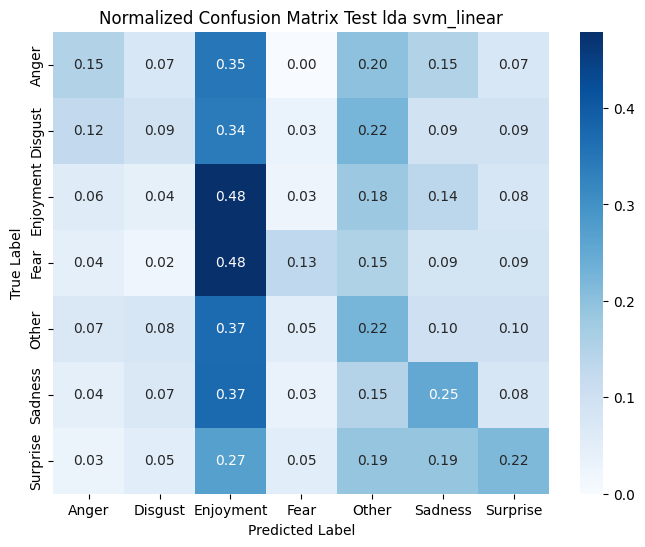

In [90]:
# SVM - linear - LDA (6:4)
model_lda_64_svm_linear, train_lda_64_svm_linear, valid_lda_64_svm_linear, test_lda_64_svm_linear, pred_lda_64_svm_linear = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 0.5, "svm_kernel": "linear"}
)

y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear = train_lda_64_svm_linear[1], valid_lda_64_svm_linear[1], test_lda_64_svm_linear[1]
y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear = pred_lda_64_svm_linear

pipeline_evaluation(
    y_train_lda_64_svm_linear, y_valid_lda_64_svm_linear, y_test_lda_64_svm_linear,
    y_pred_train_lda_64_svm_linear, y_pred_valid_lda_64_svm_linear, y_pred_test_lda_64_svm_linear,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_linear",
    show_plot=True
)

--- train --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.9926117473217584
Recall: 0.9926117473217584
Precision: 0.992706309885535
F1-score: 0.9926086737750692

--- valid --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.2371191135734072
Recall: 0.2371191135734072
Precision: 0.35443039500772516
F1-score: 0.2476770438103226

--- test --- 6:4 --- svm_poly --- lda ---
Accuracy: 0.17587209302325582
Recall: 0.17587209302325582
Precision: 0.24800530900168985
F1-score: 0.168752546996651


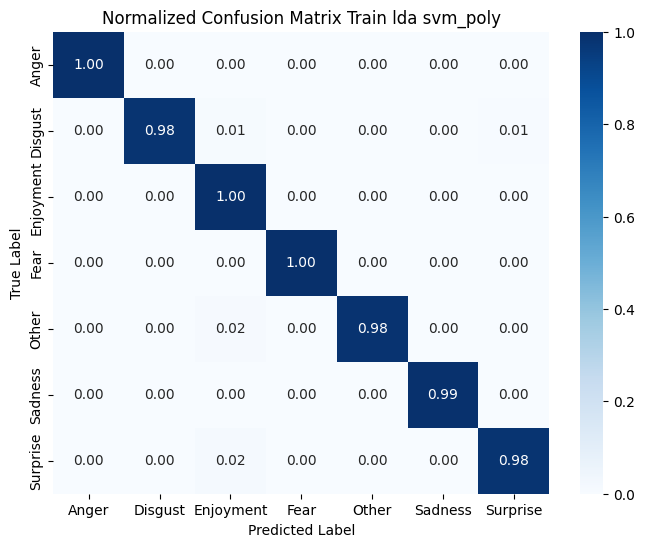

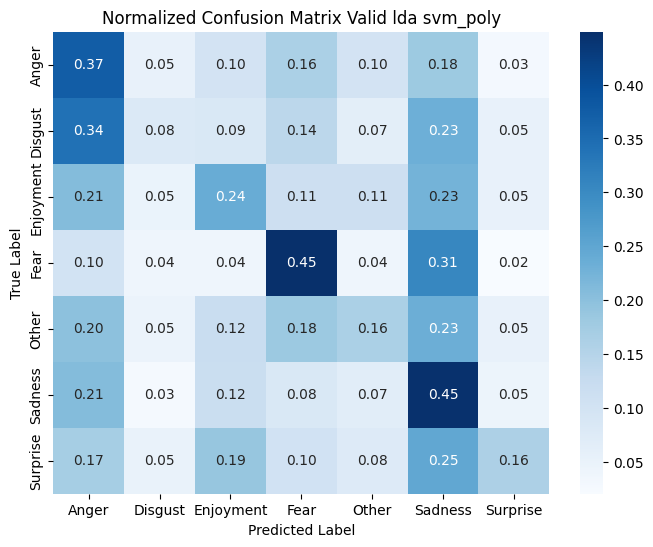

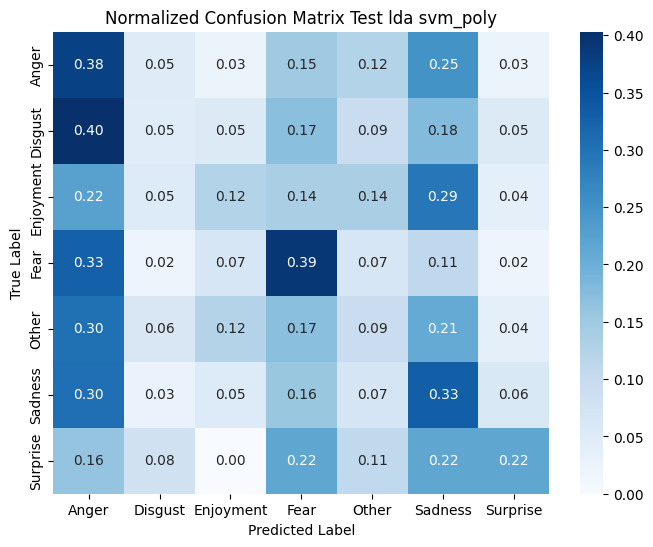

In [91]:
# SVM - poly - LDA (6:4)
model_lda_64_svm_poly, train_lda_64_svm_poly, valid_lda_64_svm_poly, test_lda_64_svm_poly, pred_lda_64_svm_poly = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "poly", "svm_degree": 2}
)

y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly = train_lda_64_svm_poly[1], valid_lda_64_svm_poly[1], test_lda_64_svm_poly[1]
y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly = pred_lda_64_svm_poly

pipeline_evaluation(
    y_train_lda_64_svm_poly, y_valid_lda_64_svm_poly, y_test_lda_64_svm_poly,
    y_pred_train_lda_64_svm_poly, y_pred_valid_lda_64_svm_poly, y_pred_test_lda_64_svm_poly,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_poly",
    show_plot=True
)

c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


--- train --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.995197635759143
Recall: 0.995197635759143
Precision: 0.99539376185228
F1-score: 0.9952410149002493

--- valid --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.3894736842105263
Recall: 0.3894736842105263
Precision: 0.27974644475033894
F1-score: 0.22462479392562035

--- test --- 6:4 --- svm_rbf --- lda ---
Accuracy: 0.27906976744186046
Recall: 0.27906976744186046
Precision: 0.09573997057658573
F1-score: 0.12424499814377765


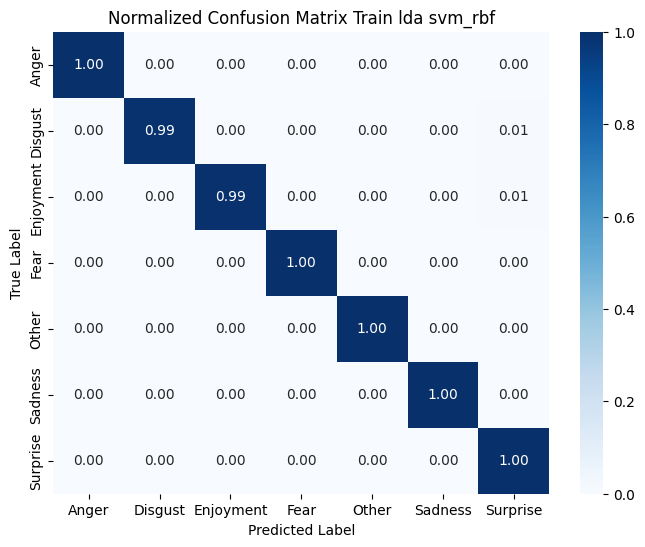

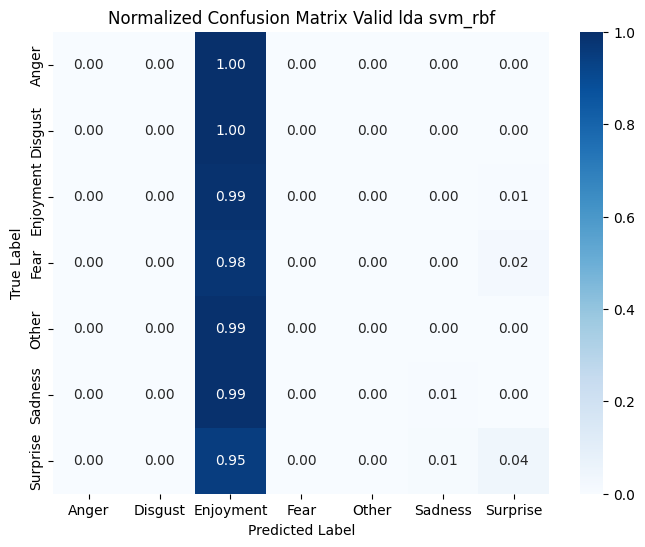

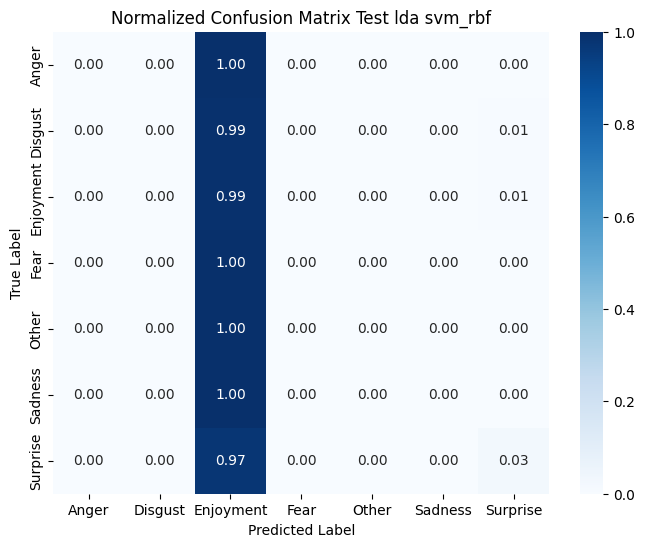

In [92]:
# SVM - rbf - LDA (6:4)
model_lda_64_svm_rbf, train_lda_64_svm_rbf, valid_lda_64_svm_rbf, test_lda_64_svm_rbf, pred_lda_64_svm_rbf = pipeline_modeling(
    X_train_lda_64, X_valid_lda_64, X_test_lda_64,
    y_train_lda_64, y_valid_lda_64, y_test_lda_64,
    model_type="svm",
    model_params={"C": 1.0, "svm_kernel": "rbf", "svm_gamma": 1.0}
)

y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf = train_lda_64_svm_rbf[1], valid_lda_64_svm_rbf[1], test_lda_64_svm_rbf[1]
y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf = pred_lda_64_svm_rbf

pipeline_evaluation(
    y_train_lda_64_svm_rbf, y_valid_lda_64_svm_rbf, y_test_lda_64_svm_rbf,
    y_pred_train_lda_64_svm_rbf, y_pred_valid_lda_64_svm_rbf, y_pred_test_lda_64_svm_rbf,
    train_size=6, valid_size=4,
    discriminant="lda",
    model_type="svm_rbf",
    show_plot=True
)

# Tổng hợp kết quả các mô hình phân loại

In [93]:
# Tổng hợp kết quả từ các cell output đã chạy
import pandas as pd
import re
import json
import matplotlib.pyplot as plt
import seaborn as sns

def extract_results_from_notebook(notebook_path=None):
    """Trích xuất kết quả từ notebook JSON"""
    import os
    
    # Tự động tìm file notebook hiện tại
    if notebook_path is None:
        # Thử các đường dẫn có thể
        possible_paths = [
            'modeling_hus_fb.ipynb',
            'src/modeling_hus_fb.ipynb',
            '../src/modeling_hus_fb.ipynb',
            os.path.abspath(__file__.replace('.py', '.ipynb')) if '__file__' in globals() else None
        ]
        
        for path in possible_paths:
            if path and os.path.exists(path):
                notebook_path = path
                break
        
        if notebook_path is None:
            raise FileNotFoundError("Không tìm thấy file notebook. Vui lòng chỉ định đường dẫn.")
    
    results = []
    
    with open(notebook_path, 'r', encoding='utf-8') as f:
        notebook = json.load(f)
    
    # Pattern để parse output - lấy kết quả từ cả train, valid và test
    pattern = r'--- (train|valid|test) --- (\d+):(\d+) --- ([^-]+) --- ([^-]+) ---\s+Accuracy: ([\d.]+)\s+Recall: ([\d.]+)\s+Precision: ([\d.]+)\s+F1-score: ([\d.]+)'
    
    for cell in notebook['cells']:
        if 'outputs' in cell:
            for output in cell['outputs']:
                if 'text' in output:
                    text = ''.join(output['text'])
                    
                    # Tìm tất cả các kết quả trong output
                    matches = re.findall(pattern, text)
                    
                    for match in matches:
                        dataset, train_size, valid_size, model_type, discriminant, acc, recall, prec, f1 = match
                        
                        results.append({
                            'Dataset': dataset.strip().upper(),  # TRAIN, VALID, hoặc TEST
                            'Model': model_type.strip(),
                            'Train:Valid': f'{train_size}:{valid_size}',
                            'Discriminant': discriminant.strip().upper(),
                            'Accuracy': float(acc),
                            'Precision': float(prec),
                            'Recall': float(recall),
                            'F1-Score': float(f1)
                        })
    
    return pd.DataFrame(results)

# Trích xuất và tổng hợp
try:
    results_df = extract_results_from_notebook()
    
    # Loại bỏ duplicate (nếu có)
    results_df = results_df.drop_duplicates(subset=['Dataset', 'Model', 'Train:Valid', 'Discriminant']).reset_index(drop=True)
    
    # Sắp xếp: Dataset (TEST > VALID > TRAIN), sau đó F1-Score giảm dần
    dataset_order = {'TEST': 0, 'VALID': 1, 'TRAIN': 2}
    results_df['Dataset_Order'] = results_df['Dataset'].map(dataset_order)
    results_df = results_df.sort_values(['Dataset_Order', 'F1-Score'], ascending=[True, False]).reset_index(drop=True)
    results_df = results_df.drop('Dataset_Order', axis=1)
    
    print("=" * 120)
    print("TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)")
    print("=" * 120)
    print()
    
    # Hiển thị bảng đầy đủ
    pd.set_option('display.max_columns', None)
    pd.set_option('display.width', None)
    pd.set_option('display.max_colwidth', None)
    print(results_df.to_string(index=False))
    
    print()
    print("=" * 120)
    print(f"Tổng số kết quả: {len(results_df)}")
    
    # Thống kê theo từng dataset
    for dataset in ['TRAIN', 'VALID', 'TEST']:
        df_dataset = results_df[results_df['Dataset'] == dataset]
        if len(df_dataset) > 0:
            best = df_dataset.iloc[0]
            print(f"\n{dataset} SET - Mô hình tốt nhất (F1-Score):")
            print(f"  Model: {best['Model']} - {best['Discriminant']} - {best['Train:Valid']}")
            print(f"  F1-Score: {best['F1-Score']:.4f} | Accuracy: {best['Accuracy']:.4f} | Precision: {best['Precision']:.4f} | Recall: {best['Recall']:.4f}")
    
    print("=" * 120)
    
except Exception as e:
    print(f"Lỗi khi đọc notebook: {e}")
    print("Vui lòng đảm bảo các cell đã được chạy và có output.")
    import traceback
    traceback.print_exc()

TỔNG HỢP KẾT QUẢ CÁC MÔ HÌNH PHÂN LOẠI (TRAIN - VALID - TEST)

Dataset               Model Train:Valid Discriminant  Accuracy  Precision   Recall  F1-Score
   TEST          svm_linear         7:3          PCA  0.390988   0.428498 0.390988  0.396059
   TEST logistic_regression         7:3          PCA  0.373547   0.458966 0.373547  0.395753
   TEST          svm_linear         7:3         NONE  0.389535   0.429264 0.389535  0.395010
   TEST logistic_regression         6:4          PCA  0.373547   0.449378 0.373547  0.392567
   TEST          svm_linear         8:2         NONE  0.388081   0.426617 0.388081  0.392520
   TEST logistic_regression         8:2         NONE  0.375000   0.449029 0.375000  0.392264
   TEST logistic_regression         8:2          PCA  0.370640   0.447473 0.370640  0.389025
   TEST logistic_regression         6:4         NONE  0.372093   0.441360 0.372093  0.388665
   TEST          svm_linear         8:2          PCA  0.380814   0.421080 0.380814  0.388541
   TEST

# Xem kết quả dự đoán cho từng nhãn

In [94]:
from sklearn.metrics import classification_report

print(classification_report(y_test_73, y_pred_test_73, digits=4))

              precision    recall  f1-score   support

       Anger     0.1543    0.6250    0.2475        40
     Disgust     0.2353    0.2171    0.2258       129
   Enjoyment     0.6222    0.4375    0.5138       192
        Fear     0.4872    0.4130    0.4471        46
       Other     0.3396    0.2791    0.3064       129
     Sadness     0.6301    0.4000    0.4894       115
    Surprise     0.2778    0.4054    0.3297        37

    accuracy                         0.3677       688
   macro avg     0.3924    0.3967    0.3657       688
weighted avg     0.4433    0.3677    0.3870       688



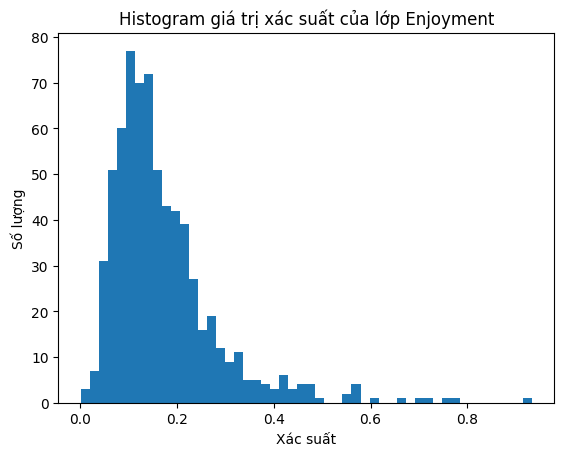

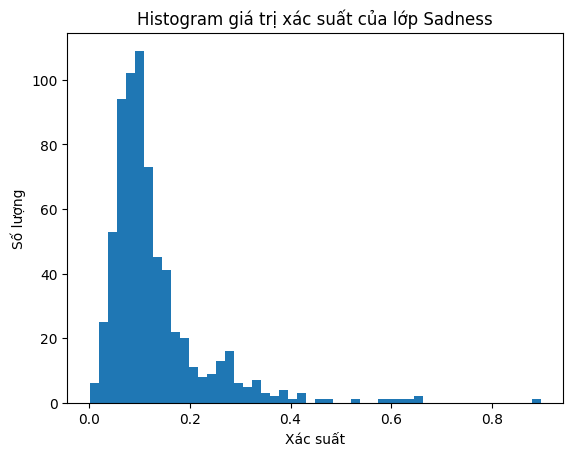

In [95]:
def plot_score_hist(model, X, label_name):
    scores = model.predict_proba(X)       # Trả về giá trị hàm quyết định
    classes = list(model.classes_)       # Các lớp của mô hình 

    # Lấy index của lớp lable_name
    idx = classes.index(label_name)
    
    # Lấy ra cột score của nhãn label_name 
    score = scores[:, idx]  

    plt.figure()
    plt.hist(score, bins=50)
    plt.title(f"Histogram giá trị xác suất của lớp {label_name}")
    plt.xlabel("Xác suất")
    plt.ylabel("Số lượng")
    plt.show()
    
    return score
    
# Chọn 1 mô hình bất kì   
model = model_82         # model logistic regression đã huấn luyện
X_test_processed, y_test = test_82

score_enj = plot_score_hist(model, X_test_processed, "Enjoyment")
score_sad = plot_score_hist(model, X_test_processed, "Sadness")

Nhận xét: 


- Lớp Enjoyment có F1 cao nhất và số lượng nhãn lớn nhất => Ổn định, ít nhiễu hơn và ít giao động khi chia tập DL 

- Dựa vào histogram ta thấy phân bố của lớp Enjoyment khá mượt và trải rộng => có nhiều mức điểm khác nhau cho mô hình ==> phù hợp làm đầu ra hồi quy

- Lớp Sadness cũng là một sự lựa chọn ổn, tuy nhiên phân bố không quá đẹp, không ổn định bằng Enjoyment và F1-Score của 2 lớp này cũng không chênh lệch nhiều

=> Chọn đầu ra hồi quy là giá trị hàm quyết định của lớp Enjoyment

# Chuyển bài toán sang hồi quy


## Các hàm xử lý cho hồi quy

In [96]:
import numpy as np
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.decomposition import PCA


### Hàm lấy softmax probability của lớp Enjoyment


In [97]:
def get_enjoyment_score(model, X_data):

    # Lấy tất cả softmax probabilities cho tất cả các lớp
    probabilities = model.predict_proba(X_data)  # Shape: (n_samples, n_classes)
    
    # Tìm index của lớp Enjoyment
    classes = list(model.classes_)
    idx_enjoyment = classes.index("Enjoyment")
    
    # Lấy cột probability của lớp Enjoyment
    prob_enjoyment = probabilities[:, idx_enjoyment]
    
    return prob_enjoyment


### Hàm đánh giá mô hình hồi quy (MSE, MAE, R2)


In [98]:
def evaluate_regression(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    return {"MSE": mse, "MAE": mae, "R2": r2}


### Hồi quy tuyến tính (L2 regularization)


In [99]:
# alpha: hệ số regularization
def train_ridge(X_train, y_train, alpha=1.0, random_state=11):
    ridge = Ridge(alpha=alpha, random_state=random_state)
    ridge.fit(X_train, y_train)
    return ridge


### KNN


In [100]:
def train_knn_regressor(X_train, y_train, metric='cosine', n_jobs=-1):
    k = int(np.sqrt(len(X_train)))
    knn = KNeighborsRegressor(n_neighbors=k, metric=metric, n_jobs=n_jobs)
    knn.fit(X_train, y_train)
    return knn


### Hàm lựa chọn mô hình hồi quy


Hệ số cho mô hình
- model_type: loại mô hình
- alpha: hệ số regularization 
- metric: metric của KNN (cosine,...)

In [101]:
def use_regression_model(model_type, X_train, y_train, alpha=1.0, metric='cosine'):
    if model_type == "ridge":
        return train_ridge(X_train, y_train, alpha=alpha)
    elif model_type == "knn":
        return train_knn_regressor(X_train, y_train, metric=metric)
    else:
        raise ValueError(f"Unknown model_type: {model_type}. Use 'ridge' or 'knn'")


### Hàm dự đoán hồi quy


In [102]:
def predict_regression(model, X_train, X_valid, X_test):
    y_pred_train = model.predict(X_train)
    y_pred_valid = model.predict(X_valid)
    y_pred_test = model.predict(X_test)
    
    return y_pred_train, y_pred_valid, y_pred_test


### Hàm chuẩn bị dữ liệu 

- Input là dữ liệu sau TF-IDF của model lựa chọn (model đã trả về dữ liệu này)
- Lấy softmax probabilities từ model có kết quả phân loại tốt nhất (chọn model_73)
- Áp dụng PCA (1/3, tùy chọn)

In [103]:
def prepare_data_for_regression(classification_model, X_train_valid, X_test, 
                                 y_train_valid, y_test,
                                 train_size=7, valid_size=3,
                                 discriminant="none", n_components_pca=None, random_state=11):

    
    # 1. Lấy giá trị softmax probalilities từ classification_model cho train_valid và test
    z_train_valid = get_enjoyment_score(classification_model, X_train_valid)
    z_test = get_enjoyment_score(classification_model, X_test)
    
    # 2. Chia train_valid
    print(f"Tỉ lệ train - valid {train_size}:{valid_size}")
    X_train_reg, X_valid_reg, z_train_reg, z_valid_reg = train_test_split(
        X_train_valid, z_train_valid,
        test_size=valid_size/(train_size + valid_size),
        random_state=random_state,
        stratify=y_train_valid 
    )
    
    # 3. Giảm chiều (1/3, tùy chọn)
    if discriminant == 'pca':
        if n_components_pca is None:
            n_components_pca = max(1, int(X_train_reg.shape[1] / 3))
        
        print(f'PCA: {X_train_reg.shape[1]} -> {n_components_pca} chiều')
        pca_reducer = PCA(n_components=n_components_pca, random_state=random_state)
        X_train_processed = pca_reducer.fit_transform(X_train_reg)
        X_valid_processed = pca_reducer.transform(X_valid_reg)
        X_test_processed = pca_reducer.transform(X_test)
        
        print(f'PCA explained variance ratio: {pca_reducer.explained_variance_ratio_.sum():.4f}')
        discriminant_model = pca_reducer
    else:
        X_train_processed = X_train_reg
        X_valid_processed = X_valid_reg
        X_test_processed = X_test
        discriminant_model = None
    
    return (X_train_processed, X_valid_processed, X_test_processed,
            z_train_reg, z_valid_reg, z_test,
            discriminant_model)

## Pipeline hồi quy


In [104]:
def pipeline_regression(X_train, X_valid, X_test, z_train, z_valid, z_test,
                        regression_model_type='ridge', alpha=1.0, metric='cosine',
                        random_state=11):

    # Đặt lại tên cho tường minh
    X_reg_train, y_reg_train = X_train, z_train
    X_reg_valid, y_reg_valid = X_valid, z_valid
    X_reg_test, y_reg_test = X_test, z_test

    print(f'Tập hồi quy - Train: {X_reg_train.shape}, Valid: {X_reg_valid.shape}, Test: {X_reg_test.shape}')
    print()

    # Huấn luyện mô hình hồi quy
    regression_model = use_regression_model(regression_model_type, X_reg_train, y_reg_train,
                                            alpha=alpha, metric=metric)

    # Dự đoán
    y_pred_train, y_pred_valid, y_pred_test = predict_regression(
        regression_model, X_reg_train, X_reg_valid, X_reg_test
    )

    # Đánh giá mô hình
    metrics_train = evaluate_regression(y_reg_train, y_pred_train)
    metrics_valid = evaluate_regression(y_reg_valid, y_pred_valid)
    metrics_test = evaluate_regression(y_reg_test, y_pred_test)

    return (regression_model,
            (X_reg_train, X_reg_valid, X_reg_test),
            (y_reg_train, y_reg_valid, y_reg_test),
            (y_pred_train, y_pred_valid, y_pred_test),
            (metrics_train, metrics_valid, metrics_test))


## Hàm đánh giá và hiển thị kết quả


In [105]:
def pipeline_evaluation_regression(metrics_train, metrics_valid, metrics_test,
                                   regression_model_type, discriminant, data_type=""):
    print(f"=== {regression_model_type.upper()} Regression - {discriminant.upper()} {data_type} ===")
    print()
    
    print("--- Train ---")
    print(f"MSE = {metrics_train['MSE']:.6f}")
    print(f"MAE = {metrics_train['MAE']:.6f}")
    print(f"R2  = {metrics_train['R2']:.6f}")
    print()
    
    print("--- Valid ---")
    print(f"MSE = {metrics_valid['MSE']:.6f}")
    print(f"MAE = {metrics_valid['MAE']:.6f}")
    print(f"R2  = {metrics_valid['R2']:.6f}")
    print()
    
    print("--- Test ---")
    print(f"MSE = {metrics_test['MSE']:.6f}")
    print(f"MAE = {metrics_test['MAE']:.6f}")
    print(f"R2  = {metrics_test['R2']:.6f}")
    print()
    print("=" * 80)
    print()


## Tạo bộ dữ liệu hồi quy

In [106]:
import numpy as np

In [107]:
X_train_73_reg = train_73[0]
X_valid_73_reg = valid_73[0]
X_test_reg = test_73[0]
y_train_73_cls = train_73[1]
y_valid_73_cls = valid_73[1]
y_test_cls = test_73[1]

# Gộp train và valid thành train_valid
X_train_valid_reg = np.vstack([X_train_73_reg, X_valid_73_reg])
y_train_valid_reg = np.concatenate([y_train_73_cls, y_valid_73_cls])

print("============== Kích thước ===============")
print(f"train_valid: {X_train_valid_reg.shape}, test: {X_test_reg.shape}")
print(f"labels train_valid: {y_train_valid_reg.shape}, test: {y_test_cls.shape}")

============== Kích thước ===============
train_valid: (4512, 4893), test: (688, 4893)
labels train_valid: (4512,), test: (688,)


## Train:Validation = 8:2

### Hồi quy tuyến tính (Ridge L2)

#### Dữ liệu gốc

In [108]:
X_train_reg_82, X_valid_reg_82, X_test_reg_82, \
z_train_reg_82, z_valid_reg_82, z_test_reg_82, disc_model_reg_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_82_model, X_reg_82, y_reg_82, y_pred_ridge_82, metrics_ridge_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_82[0], metrics_ridge_82[1], metrics_ridge_82[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
Tập hồi quy - Train: (3609, 4893), Valid: (903, 4893), Test: (688, 4893)

=== RIDGE Regression - NONE (8:2) ===

--- Train ---
MSE = 0.000803
MAE = 0.021596
R2  = 0.964167

--- Valid ---
MSE = 0.001768
MAE = 0.031661
R2  = 0.921925

--- Test ---
MSE = 0.000801
MAE = 0.020464
R2  = 0.936056




#### Dữ liệu PCA

In [109]:
X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82, \
z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82, disc_model_reg_pca_82 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=8,
    valid_size=2,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 rồi nên không cần nữa
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_82_model, X_reg_pca_82, y_reg_pca_82, y_pred_ridge_pca_82, metrics_ridge_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_82[0], metrics_ridge_pca_82[1], metrics_ridge_pca_82[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(8:2)"
)

Tỉ lệ train - valid 8:2
PCA: 4893 -> 1631 chiều
PCA explained variance ratio: 0.9232
Tập hồi quy - Train: (3609, 1631), Valid: (903, 1631), Test: (688, 1631)

=== RIDGE Regression - PCA (8:2) ===

--- Train ---
MSE = 0.000901
MAE = 0.022946
R2  = 0.959780

--- Valid ---
MSE = 0.001842
MAE = 0.032240
R2  = 0.918664

--- Test ---
MSE = 0.000813
MAE = 0.020621
R2  = 0.935090




### KNN

#### Bộ dữ liệu không giảm chiều 

In [110]:
# KNN / None
knn_82_model, X_reg_82_knn, y_reg_82_knn, y_pred_knn_82, metrics_knn_82 = pipeline_regression(
    X_train_reg_82, X_valid_reg_82, X_test_reg_82,
    z_train_reg_82, z_valid_reg_82, z_test_reg_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_82[0], metrics_knn_82[1], metrics_knn_82[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(8:2)"
)

Tập hồi quy - Train: (3609, 4893), Valid: (903, 4893), Test: (688, 4893)

=== KNN Regression - NONE (8:2) ===

--- Train ---
MSE = 0.007891
MAE = 0.070439
R2  = 0.647933

--- Valid ---
MSE = 0.008776
MAE = 0.075081
R2  = 0.612508

--- Test ---
MSE = 0.005457
MAE = 0.058218
R2  = 0.564204




In [111]:
# KNN / PCA
knn_pca_82_model, X_reg_pca_82_knn, y_reg_pca_82_knn, y_pred_knn_pca_82, metrics_knn_pca_82 = pipeline_regression(
    X_train_reg_pca_82, X_valid_reg_pca_82, X_test_reg_pca_82,
    z_train_reg_pca_82, z_valid_reg_pca_82, z_test_reg_pca_82,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_82[0], metrics_knn_pca_82[1], metrics_knn_pca_82[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(8:2)"
)

Tập hồi quy - Train: (3609, 1631), Valid: (903, 1631), Test: (688, 1631)

=== KNN Regression - PCA (8:2) ===

--- Train ---
MSE = 0.007747
MAE = 0.069666
R2  = 0.654330

--- Valid ---
MSE = 0.008697
MAE = 0.074497
R2  = 0.616020

--- Test ---
MSE = 0.005306
MAE = 0.057505
R2  = 0.576245




## Train:Validation = 7:3

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [112]:
# Chuẩn bị dữ liệu
X_train_reg_73, X_valid_reg_73, X_test_reg_73, \
z_train_reg_73, z_valid_reg_73, z_test_reg_73, disc_model_reg_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_73_model, X_reg_73, y_reg_73, y_pred_ridge_73, metrics_ridge_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_73[0], metrics_ridge_73[1], metrics_ridge_73[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
Tập hồi quy - Train: (3158, 4893), Valid: (1354, 4893), Test: (688, 4893)

=== RIDGE Regression - NONE (7:3) ===

--- Train ---
MSE = 0.000856
MAE = 0.022269
R2  = 0.961888

--- Valid ---
MSE = 0.001922
MAE = 0.033154
R2  = 0.914353

--- Test ---
MSE = 0.000841
MAE = 0.020946
R2  = 0.932861




### Bộ dữ liệu PCA

In [113]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73, \
z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73, disc_model_reg_pca_73 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=7,
    valid_size=3,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính 1/3 rồi nên không cần nữa 
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_73_model, X_reg_pca_73, y_reg_pca_73, y_pred_ridge_pca_73, metrics_ridge_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_73[0], metrics_ridge_pca_73[1], metrics_ridge_pca_73[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(7:3)"
)

Tỉ lệ train - valid 7:3
PCA: 4893 -> 1631 chiều
PCA explained variance ratio: 0.9376
Tập hồi quy - Train: (3158, 1631), Valid: (1354, 1631), Test: (688, 1631)

=== RIDGE Regression - PCA (7:3) ===

--- Train ---
MSE = 0.000939
MAE = 0.023343
R2  = 0.958203

--- Valid ---
MSE = 0.001972
MAE = 0.033528
R2  = 0.912133

--- Test ---
MSE = 0.000849
MAE = 0.020997
R2  = 0.932222




### KNN

#### Bộ dữ liệu không giảm chiều

In [114]:
# KNN / None
knn_73_model, X_reg_73_knn, y_reg_73_knn, y_pred_knn_73, metrics_knn_73 = pipeline_regression(
    X_train_reg_73, X_valid_reg_73, X_test_reg_73,
    z_train_reg_73, z_valid_reg_73, z_test_reg_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_73[0], metrics_knn_73[1], metrics_knn_73[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(7:3)"
)

Tập hồi quy - Train: (3158, 4893), Valid: (1354, 4893), Test: (688, 4893)

=== KNN Regression - NONE (7:3) ===

--- Train ---
MSE = 0.008206
MAE = 0.072191
R2  = 0.634700

--- Valid ---
MSE = 0.009157
MAE = 0.076597
R2  = 0.591985

--- Test ---
MSE = 0.005665
MAE = 0.059345
R2  = 0.547589




In [115]:
# KNN / PCA
knn_pca_73_model, X_reg_pca_73_knn, y_reg_pca_73_knn, y_pred_knn_pca_73, metrics_knn_pca_73 = pipeline_regression(
    X_train_reg_pca_73, X_valid_reg_pca_73, X_test_reg_pca_73,
    z_train_reg_pca_73, z_valid_reg_pca_73, z_test_reg_pca_73,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_73[0], metrics_knn_pca_73[1], metrics_knn_pca_73[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(7:3)"
)

Tập hồi quy - Train: (3158, 1631), Valid: (1354, 1631), Test: (688, 1631)

=== KNN Regression - PCA (7:3) ===

--- Train ---
MSE = 0.008072
MAE = 0.071140
R2  = 0.640697

--- Valid ---
MSE = 0.008914
MAE = 0.074927
R2  = 0.602796

--- Test ---
MSE = 0.005489
MAE = 0.058547
R2  = 0.561643




## Train:Validation = 6:4

### Ridge Regression

#### Bộ dữ liệu không giảm chiều

In [116]:
# Chuẩn bị dữ liệu
X_train_reg_64, X_valid_reg_64, X_test_reg_64, \
z_train_reg_64, z_valid_reg_64, z_test_reg_64, disc_model_reg_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="none",
    random_state=11
)

# Ridge Regression / None
ridge_64_model, X_reg_64, y_reg_64, y_pred_ridge_64, metrics_ridge_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_64[0], metrics_ridge_64[1], metrics_ridge_64[2],
    regression_model_type="ridge",
    discriminant="none",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
Tập hồi quy - Train: (2707, 4893), Valid: (1805, 4893), Test: (688, 4893)

=== RIDGE Regression - NONE (6:4) ===

--- Train ---
MSE = 0.000939
MAE = 0.023349
R2  = 0.957923

--- Valid ---
MSE = 0.002157
MAE = 0.035441
R2  = 0.904843

--- Test ---
MSE = 0.000909
MAE = 0.021695
R2  = 0.927428




#### Bộ dữ liệu sau khi PCA

In [117]:
# Chuẩn bị dữ liệu 
X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64, \
z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64, disc_model_reg_pca_64 = prepare_data_for_regression(
    classification_model=model_73,
    X_train_valid=X_train_valid_reg,
    X_test=X_test_reg,
    y_train_valid=y_train_valid_reg,
    y_test=y_test_cls,
    train_size=6,
    valid_size=4,
    discriminant="pca",
    n_components_pca=None,  # Tự động tính = 1/3 số chiều
    random_state=11
)

# Ridge Regression / PCA
ridge_pca_64_model, X_reg_pca_64, y_reg_pca_64, y_pred_ridge_pca_64, metrics_ridge_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="ridge",
    alpha=1.0,
    random_state=11
)

pipeline_evaluation_regression(
    metrics_ridge_pca_64[0], metrics_ridge_pca_64[1], metrics_ridge_pca_64[2],
    regression_model_type="ridge",
    discriminant="pca",
    data_type="(6:4)"
)

Tỉ lệ train - valid 6:4
PCA: 4893 -> 1631 chiều
PCA explained variance ratio: 0.9552
Tập hồi quy - Train: (2707, 1631), Valid: (1805, 1631), Test: (688, 1631)

=== RIDGE Regression - PCA (6:4) ===

--- Train ---
MSE = 0.001002
MAE = 0.024092
R2  = 0.955112

--- Valid ---
MSE = 0.002209
MAE = 0.035899
R2  = 0.902528

--- Test ---
MSE = 0.000912
MAE = 0.021723
R2  = 0.927190




## KNN

### Bộ dữ liệu không giảm chiều

In [118]:
# KNN / None
knn_64_model, X_reg_64_knn, y_reg_64_knn, y_pred_knn_64, metrics_knn_64 = pipeline_regression(
    X_train_reg_64, X_valid_reg_64, X_test_reg_64,
    z_train_reg_64, z_valid_reg_64, z_test_reg_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_64[0], metrics_knn_64[1], metrics_knn_64[2],
    regression_model_type="knn",
    discriminant="none",
    data_type="(6:4)"
)

Tập hồi quy - Train: (2707, 4893), Valid: (1805, 4893), Test: (688, 4893)

=== KNN Regression - NONE (6:4) ===

--- Train ---
MSE = 0.008453
MAE = 0.072506
R2  = 0.621281

--- Valid ---
MSE = 0.009207
MAE = 0.076422
R2  = 0.593809

--- Test ---
MSE = 0.005684
MAE = 0.059313
R2  = 0.546117




#### Bộ dữ liệu sau PCA

In [119]:
# KNN / PCA
knn_pca_64_model, X_reg_pca_64_knn, y_reg_pca_64_knn, y_pred_knn_pca_64, metrics_knn_pca_64 = pipeline_regression(
    X_train_reg_pca_64, X_valid_reg_pca_64, X_test_reg_pca_64,
    z_train_reg_pca_64, z_valid_reg_pca_64, z_test_reg_pca_64,
    regression_model_type="knn",
    metric='cosine',
    random_state=11
)

pipeline_evaluation_regression(
    metrics_knn_pca_64[0], metrics_knn_pca_64[1], metrics_knn_pca_64[2],
    regression_model_type="knn",
    discriminant="pca",
    data_type="(6:4)"
)

Tập hồi quy - Train: (2707, 1631), Valid: (1805, 1631), Test: (688, 1631)

=== KNN Regression - PCA (6:4) ===

--- Train ---
MSE = 0.008387
MAE = 0.072324
R2  = 0.624220

--- Valid ---
MSE = 0.009087
MAE = 0.075941
R2  = 0.599139

--- Test ---
MSE = 0.005544
MAE = 0.058904
R2  = 0.557273




# So sánh và đánh giá kết quả

In [120]:
# Tạo bảng so sánh kết quả
print("=" * 100)
print("BẢNG SO SÁNH KẾT QUẢ HỒI QUY")
print("=" * 100)
print(f"{'Mô hình':<25} {'Tỉ lệ':<10} {'Dữ liệu':<15} {'MSE (Test)':<15} {'MAE (Test)':<15} {'R2 (Test)':<15}")
print("-" * 100)
print(f"{'Ridge Regression':<25} {'8:2':<10} {'Gốc':<15} {metrics_ridge_82[2]['MSE']:<15.6f} {metrics_ridge_82[2]['MAE']:<15.6f} {metrics_ridge_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'8:2':<10} {'PCA':<15} {metrics_ridge_pca_82[2]['MSE']:<15.6f} {metrics_ridge_pca_82[2]['MAE']:<15.6f} {metrics_ridge_pca_82[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'Gốc':<15} {metrics_ridge_73[2]['MSE']:<15.6f} {metrics_ridge_73[2]['MAE']:<15.6f} {metrics_ridge_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'7:3':<10} {'PCA':<15} {metrics_ridge_pca_73[2]['MSE']:<15.6f} {metrics_ridge_pca_73[2]['MAE']:<15.6f} {metrics_ridge_pca_73[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'Gốc':<15} {metrics_ridge_64[2]['MSE']:<15.6f} {metrics_ridge_64[2]['MAE']:<15.6f} {metrics_ridge_64[2]['R2']:<15.6f}")
print(f"{'Ridge Regression':<25} {'6:4':<10} {'PCA':<15} {metrics_ridge_pca_64[2]['MSE']:<15.6f} {metrics_ridge_pca_64[2]['MAE']:<15.6f} {metrics_ridge_pca_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'Gốc':<15} {metrics_knn_82[2]['MSE']:<15.6f} {metrics_knn_82[2]['MAE']:<15.6f} {metrics_knn_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'8:2':<10} {'PCA':<15} {metrics_knn_pca_82[2]['MSE']:<15.6f} {metrics_knn_pca_82[2]['MAE']:<15.6f} {metrics_knn_pca_82[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'Gốc':<15} {metrics_knn_73[2]['MSE']:<15.6f} {metrics_knn_73[2]['MAE']:<15.6f} {metrics_knn_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'7:3':<10} {'PCA':<15} {metrics_knn_pca_73[2]['MSE']:<15.6f} {metrics_knn_pca_73[2]['MAE']:<15.6f} {metrics_knn_pca_73[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'Gốc':<15} {metrics_knn_64[2]['MSE']:<15.6f} {metrics_knn_64[2]['MAE']:<15.6f} {metrics_knn_64[2]['R2']:<15.6f}")
print(f"{'KNN Regressor':<25} {'6:4':<10} {'PCA':<15} {metrics_knn_pca_64[2]['MSE']:<15.6f} {metrics_knn_pca_64[2]['MAE']:<15.6f} {metrics_knn_pca_64[2]['R2']:<15.6f}")
print("=" * 100)


BẢNG SO SÁNH KẾT QUẢ HỒI QUY
Mô hình                   Tỉ lệ      Dữ liệu         MSE (Test)      MAE (Test)      R2 (Test)      
----------------------------------------------------------------------------------------------------
Ridge Regression          8:2        Gốc             0.000801        0.020464        0.936056       
Ridge Regression          8:2        PCA             0.000813        0.020621        0.935090       
Ridge Regression          7:3        Gốc             0.000841        0.020946        0.932861       
Ridge Regression          7:3        PCA             0.000849        0.020997        0.932222       
Ridge Regression          6:4        Gốc             0.000909        0.021695        0.927428       
Ridge Regression          6:4        PCA             0.000912        0.021723        0.927190       
KNN Regressor             8:2        Gốc             0.005457        0.058218        0.564204       
KNN Regressor             8:2        PCA             0.005306 

In [121]:
def plot_regression_correlation(y_true, y_pred, title='Correlation'):
    corr = np.corrcoef(y_true, y_pred)[0, 1]
    plt.figure(figsize=(6, 6))
    plt.scatter(y_true, y_pred, s=10, alpha=0.5)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f"{title} (corr={corr:.4f})")
    plt.grid(True, alpha=0.3)
    plt.show()
    return corr
